based on https://jhat.readthedocs.io/en/latest/examples/plot_b_nircam.html


# JWST NIRCAM

Aligning JWST/NIRCAM images with JHAT.


An example NIRCam Dataset is downloaded, and then a series of
alignment methods are used. For more information on the
key parameters used for alignment see 
`params:Useful Parameters`.

In [1]:
%reload_ext autoreload
%autoreload 2

import sys,os,glob
import pandas as pd
from astropy.io import fits
from astropy.table import Table
from astropy.nddata import extract_array
from astropy.coordinates import SkyCoord
from astropy import wcs
from astropy.wcs.utils import skycoord_to_pixel
from astropy import units as u
from astropy.stats import sigma_clipped_stats
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from astroquery.mast import Observations
from astropy.visualization import (simple_norm,LinearStretch)
from astroquery.gaia import Gaia
from jwst.datamodels import ImageModel
from astroquery.mast import Catalogs

from scipy.ndimage import binary_dilation
from copy import deepcopy

import jhat
from jhat import jwst_photclass,st_wcs_align, hst_photclass

from nbutils import xmatch_common
from tqdm import tqdm



The following task in the stsci.skypac package can be run with TEAL:
                                    skymatch                                    


In [2]:
from jwst123 import cut_gaia_sources, query_gaia, calc_dispersion, jwst_dispersion, jwst_phot, run_jhat, align_jwst_image

JWST version: 1.14.0


## Relative Alignment

**Create a Photometric Catalog for Relative Alignment**

We choose one of the images to be the reference image, and then 
create a catalog that we will use to align the other image.



In [26]:
# ref_image = glob.glob('jwstred_temp_gaia/f277w_jhat_i2d.fits')[0]
ref_image = glob.glob('jwstred_temp_gaia/ngc5643_f277w_i2d.fits')[0]
# ref_image = glob.glob('jw04793017001_08101_00004_nrcblong_jhat_cal.fits')[0]

In [27]:
def jwst_phot(phot_img):
    '''
    Run photometry using jhat jwst_photclass

    Parameters
    ----------
    phot_img : str
        Photometry image

    Returns
    -------
    refcat : astropy.table.Table
        Reference catalog
    photfilename : str
        Photometry file name
    '''
    jwst_phot = jwst_photclass()
    photfilename = phot_img.replace('.fits','.phot.txt')
    jwst_phot.run_phot(imagename=phot_img,
                        photfilename=photfilename,
                        overwrite=True,
                        ee_radius=70)
                        # use_dq=True
    refcat = Table.read(photfilename,format='ascii')
    return refcat, photfilename

In [28]:
refcat, ref_catname = jwst_phot(ref_image)
print(refcat)

0 jwstred_temp_gaia/ngc5643_f277w_i2d.phot.txt


2025-05-13 19:54:33,799 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-05-13 19:54:33,957 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-05-13 19:54:33,962 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-05-13 19:54:33,962 - stpipe - INFO - Instrument: NIRCAM
2025-05-13 19:54:33,962 - stpipe - INFO - Detector: MULTIPLE
2025-05-13 19:54:33,963 - stpipe - INFO - Filter: F277W
2025-05-13 19:54:33,963 - stpipe - INFO - Pupil: CLEAR
2025-05-13 19:54:33,963 - stpipe - INFO - Subarray: FULL


dmag 0.36200000000000004
aper_sum_2.3px annulus_median_2.3px aper_bkg_2.3px ...   x_idl      y_idl   
-------------- -------------------- -------------- ... ---------- ----------
      7.148292             0.184662       3.098329 ...  59.723551 -64.137488
     15.523798             0.172815       2.899562 ...  32.810262 -64.260265
     10.081253              0.19249       3.229669 ...  64.943476 -63.952517
     11.525747             0.158764       2.663806 ...   8.960411 -64.338565
       7.01116              0.17246       2.893591 ...   50.99761 -64.025012
      6.927942             0.163167       2.737685 ...  26.182852 -64.103221
    289.605697             0.522325       8.763766 ... -25.463821 -64.077895
      5.785718             0.146187       2.452782 ... -19.633087 -64.083197
    201.071399             0.372277       6.246194 ...  -2.893805 -63.918621
      7.700535              0.19433       3.260546 ...  65.825865 -63.294752
           ...                  ...            ... 

**Align the second image**

The plots outputted here show the various steps used by jhat to
determine the true matching sources in the image, and the
subsequent correction needed for optimal alignment.



In [29]:
align_image = glob.glob('jwstred_temp_gaia/jw01685011001_02101_00001_nrcalong_cal.fits')[0]
# align_image = glob.glob('jw04793017001_08101_00004_nrcblong_jhat_cal.fits')[0]

In [30]:
refcat_df = pd.read_csv(ref_catname, sep = '\s+')

In [31]:
refcat_df

,aper_sum_2.3px,annulus_median_2.3px,aper_bkg_2.3px,aper_sum_bkgsub_2.3px,flux_err_2.3px,mag,dmag,x,y,sharpness,roundness1,roundness2,ra,dec,x_idl,y_idl
0,7.148292,0.184662,3.098329,5.911325,0.000160,24.546338,0.007368,1959.361460,9.342619,0.736087,-0.437165,-0.177645,218.141039,-44.205267,59.723551,-64.137488
1,15.523798,0.172815,2.899562,18.426333,0.000224,23.311953,0.003320,1537.069779,11.438903,0.745301,0.127027,0.137900,218.140747,-44.212654,32.810262,-64.260265
2,10.081253,0.192490,3.229669,10.000571,0.000186,23.975488,0.005074,2041.202935,11.315590,0.761579,0.108114,-0.036153,218.141154,-44.203837,64.943476,-63.952517
3,11.525747,0.158764,2.663806,12.934889,0.000206,23.696143,0.004340,1162.541185,12.856142,0.737922,-0.134456,-0.039405,218.140477,-44.219205,8.960411,-64.338565
4,7.011160,0.172460,2.893591,6.010003,0.000156,24.528363,0.007083,1822.570299,12.511145,0.741014,0.316760,0.038897,218.141006,-44.207661,50.997610,-64.025012
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76063,11.507368,0.429290,7.202788,6.282965,0.000197,24.480138,0.008540,2930.725700,2090.356038,0.786738,0.202110,-0.416015,218.192587,-44.189480,119.077919,68.288538
76064,10.861820,0.451569,7.576594,4.795116,0.000192,24.773552,0.010910,3056.069095,2090.993315,0.775150,-0.200287,0.329163,218.192702,-44.187288,126.980141,68.532487
76065,10.150843,0.489304,8.209727,2.833253,0.000184,25.344837,0.017619,3061.878694,2091.532732,0.799458,0.177744,0.073753,218.192720,-44.187186,127.346484,68.576136
76066,9.470896,0.500304,8.394283,1.571424,0.000177,25.984817,0.030411,3066.306798,2091.566697,0.744867,-0.528907,-0.055479,218.192725,-44.187109,127.626009,68.585810


In [32]:
x = refcat['ra']

In [33]:
hdr = fits.open(ref_image)['SCI'].header
w = wcs.WCS(hdr)
jh_radec = w.all_pix2world(refcat_df['x'], refcat_df['y'], 0)
refcat['ra'], refcat['dec'] = jh_radec[0], jh_radec[1]

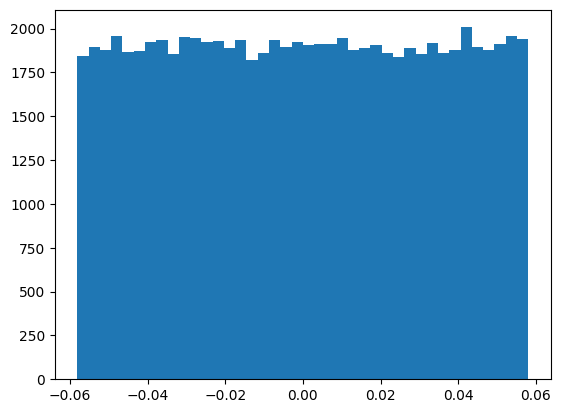

In [34]:
plt.hist((x-refcat['ra'])*3600/0.031, bins = 40)
plt.show()

In [37]:
refcat[['ra', 'dec', 'mag', 'dmag']].write('jwstred_temp_gaia/ngc5643_f277w_i2d.phot.txt', format='ascii', overwrite=True)

In [38]:
ref_catname = 'jwstred_temp_gaia/ngc5643_f277w_i2d.phot.txt'

0 ./jwstred_temp_gaia/jw01685011001_02101_00001_nrcalong.phot.txt


2025-05-13 20:11:58,052 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-05-13 20:11:58,181 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-05-13 20:11:58,186 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-05-13 20:11:58,187 - stpipe - INFO - Instrument: NIRCAM
2025-05-13 20:11:58,187 - stpipe - INFO - Detector: NRCALONG
2025-05-13 20:11:58,187 - stpipe - INFO - Filter: F277W
2025-05-13 20:11:58,187 - stpipe - INFO - Pupil: CLEAR
2025-05-13 20:11:58,187 - stpipe - INFO - Subarray: FULL
2025-05-13 20:11:58,197 - stpipe - WARNING - model.meta.resample.pixel_scale_ratio was not found. Assuming the native detector pixel scale (i.e., pixel_scale_ratio = 1)


dmag 0.2172
dmag 0.1
sharpness 0.95
roundness1 0.7
mag 25
x 2008
y 2008
Saving refcat file into ./jwstred_temp_gaia/jw01685011001_02101_00001_nrcalong.refcat.txt
reffile_d2d 0.1
*** Note: close plot to continue!


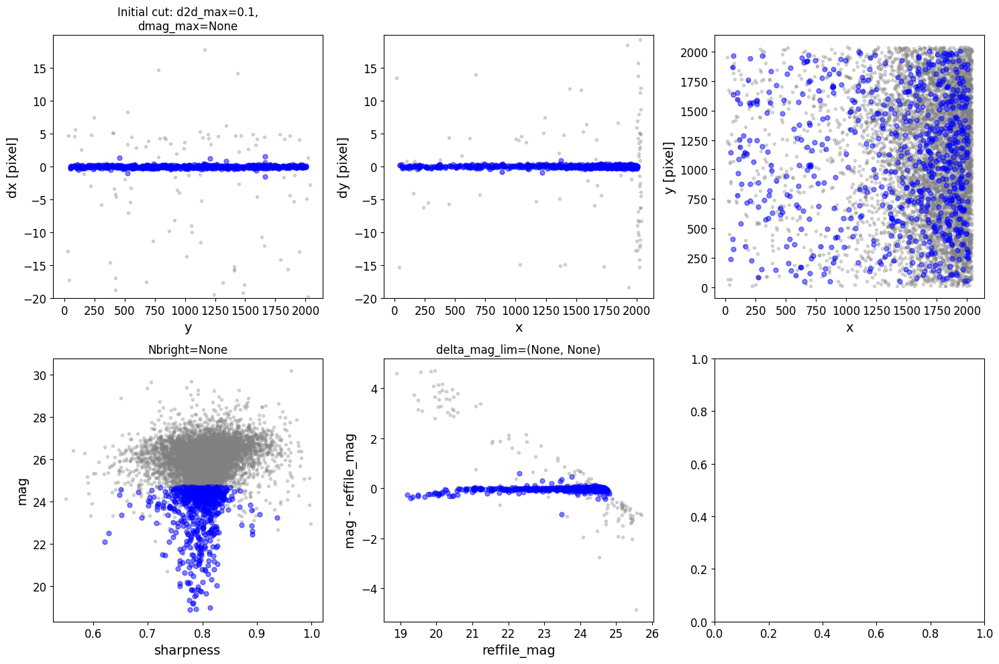

        slope    intercept     maxval  index  d_bestguess  fwhm  multimax
-3.469447e-17 3.552714e-14 507.602932     11     -0.05418   0.8     False
d_rot_tmp 0.745819517542101
Keeping 657 out of 657, skippin 0 because of null values in columns d_rot_tmp
median: -0.020864
75.000000 percentile cut: max residual for cut: 0.183059
__tmp_residuals 0.18305944831720486
median: -0.023256
i:00 mean:-0.023256(0.004238) stdev:0.093911(0.002994) X2norm:1.00 Nchanged:0 Ngood:492 Nclip:165

mean: -0.019652
i:01 mean:-0.019652(0.005296) stdev:0.131440(0.003742) X2norm:1.00 Nchanged:125 Ngood:617 Nclip:40

mean: -0.020761
i:02 mean:-0.020761(0.005815) stdev:0.148038(0.004109) X2norm:1.00 Nchanged:32 Ngood:649 Nclip:8

mean: -0.021414
i:03 mean:-0.021414(0.005899) stdev:0.150504(0.004168) X2norm:1.00 Nchanged:3 Ngood:652 Nclip:5

mean: -0.021414
i:04 mean:-0.021414(0.005899) stdev:0.150504(0.004168) X2norm:1.00 Nchanged:0 Ngood:652 Nclip:5


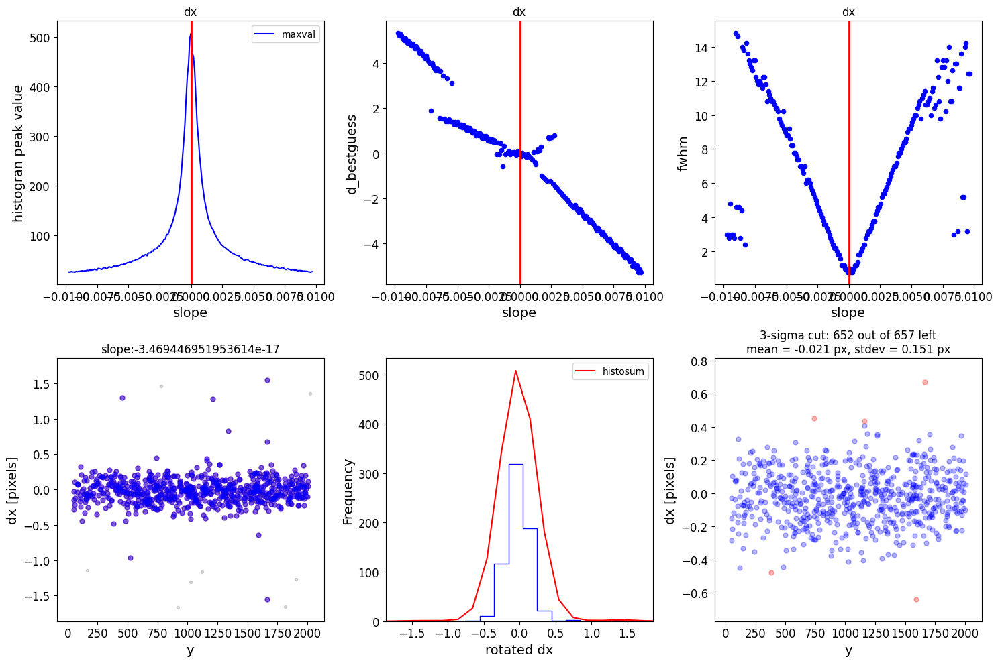

        slope    intercept     maxval  index  d_bestguess  fwhm  multimax
-3.469447e-17 3.552714e-14 499.500247      8     0.026541   0.8     False
d_rot_tmp 0.8265411164943153
Keeping 650 out of 650, skippin 0 because of null values in columns d_rot_tmp
median: -0.002083
75.000000 percentile cut: max residual for cut: 0.192584
__tmp_residuals 0.19258396402179598
median: -0.019000
i:00 mean:-0.019000(0.004171) stdev:0.091947(0.002946) X2norm:1.00 Nchanged:0 Ngood:487 Nclip:163

mean: -0.002477
i:01 mean:-0.002477(0.005129) stdev:0.122018(0.003623) X2norm:1.00 Nchanged:80 Ngood:567 Nclip:83

mean: 0.023244
i:02 mean:0.023244(0.005987) stdev:0.150865(0.004230) X2norm:1.00 Nchanged:69 Ngood:636 Nclip:14

mean: 0.030268
i:03 mean:0.030268(0.006265) stdev:0.159604(0.004427) X2norm:1.00 Nchanged:14 Ngood:650 Nclip:0

mean: 0.030268
i:04 mean:0.030268(0.006265) stdev:0.159604(0.004427) X2norm:1.00 Nchanged:0 Ngood:650 Nclip:0


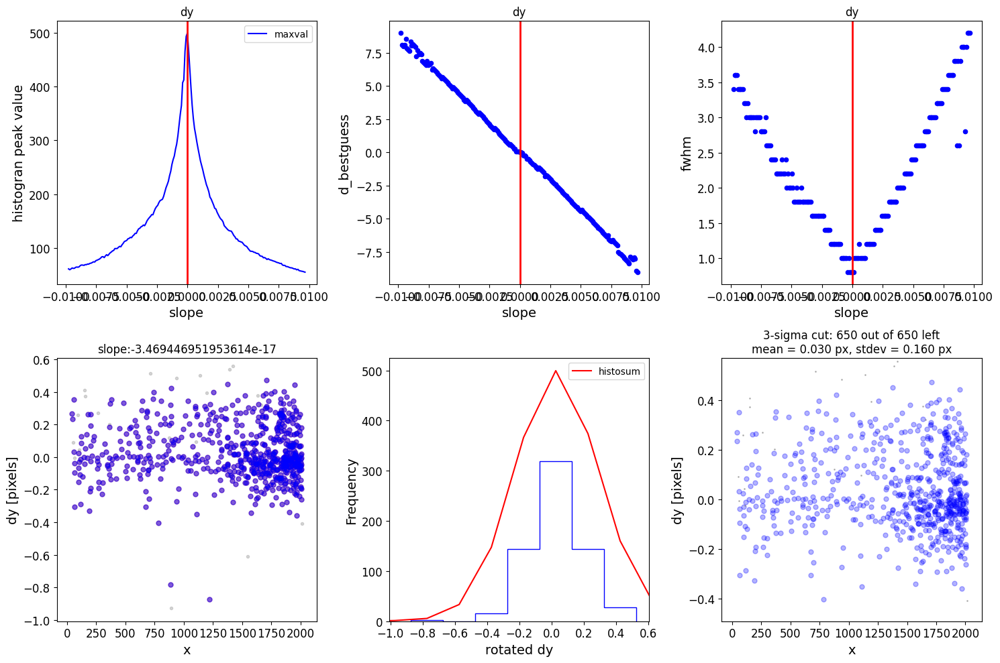

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

dx median of best matched objects of 1st iteration: -0.021059540460612425 dy median of best matched objects of 1st iteration: -0.0020831397268921137
x 2008
y 2008
reffile_d2d 0.1
        slope    intercept     maxval  index  d_bestguess  fwhm  multimax
-3.469447e-17 3.552714e-14 507.602932     11     -0.05418   0.8     False
d_rot_tmp 0.745819517542101
Keeping 657 out of 657, skippin 0 because of null values in columns d_rot_tmp
median: -0.020864
75.000000 percentile cut: max residual for cut: 0.183059
__tmp_residuals 0.18305944831720486
median: -0.023256
i:00 mean:-0.023256(0.004238) stdev:0.093911(0.002994) X2norm:1.00 Nchanged:0 Ngood:492 Nclip:165

mean: -0.019652
i:01 mean:-0.019652(0.005296) stdev:0.131440(0.003742) X2norm:1.00 Nchanged:125 Ngood:617 Nclip:40

mean: -0.020761
i:02 mean:-0.020761(0.005815) stdev:0.148038(0.004109) X2norm:1.00 Nchanged:32 Ngood:649 Nclip:8

mean: -0.021414
i:03 mean:-0.021414(0.005899) stdev:0.150504(0.004168) X2norm:1.00 Nchanged:3 Ngood:652 Nclip

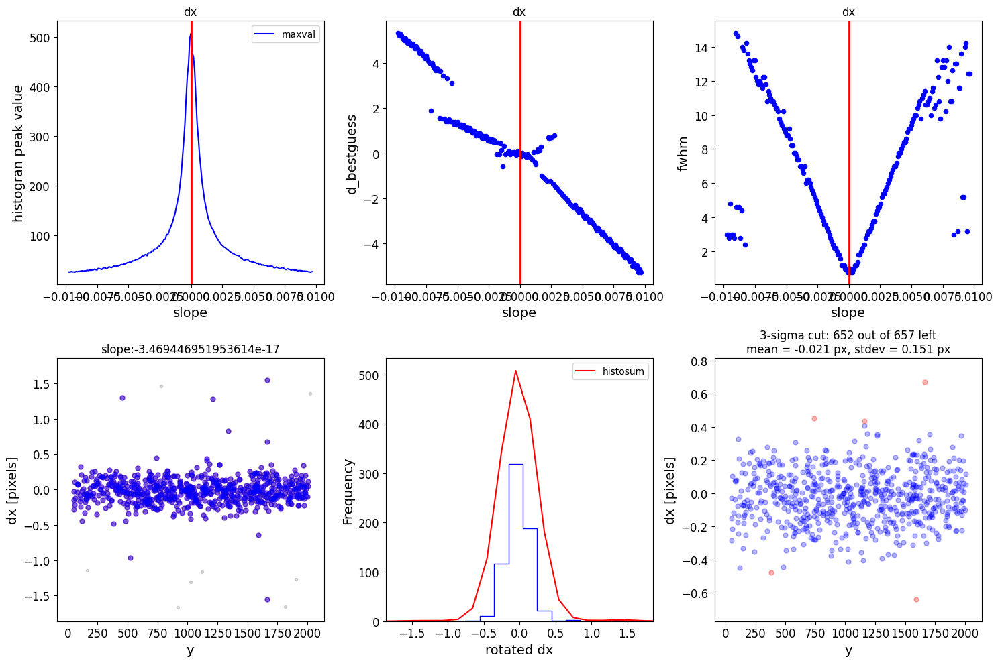

        slope    intercept     maxval  index  d_bestguess  fwhm  multimax
-3.469447e-17 3.552714e-14 499.500247      8     0.026541   0.8     False
d_rot_tmp 0.8265411164943153
Keeping 650 out of 650, skippin 0 because of null values in columns d_rot_tmp
median: -0.002083
75.000000 percentile cut: max residual for cut: 0.192584
__tmp_residuals 0.19258396402179598
median: -0.019000
i:00 mean:-0.019000(0.004171) stdev:0.091947(0.002946) X2norm:1.00 Nchanged:0 Ngood:487 Nclip:163

mean: -0.002477
i:01 mean:-0.002477(0.005129) stdev:0.122018(0.003623) X2norm:1.00 Nchanged:80 Ngood:567 Nclip:83

mean: 0.023244
i:02 mean:0.023244(0.005987) stdev:0.150865(0.004230) X2norm:1.00 Nchanged:69 Ngood:636 Nclip:14

mean: 0.030268
i:03 mean:0.030268(0.006265) stdev:0.159604(0.004427) X2norm:1.00 Nchanged:14 Ngood:650 Nclip:0

mean: 0.030268
i:04 mean:0.030268(0.006265) stdev:0.159604(0.004427) X2norm:1.00 Nchanged:0 Ngood:650 Nclip:0


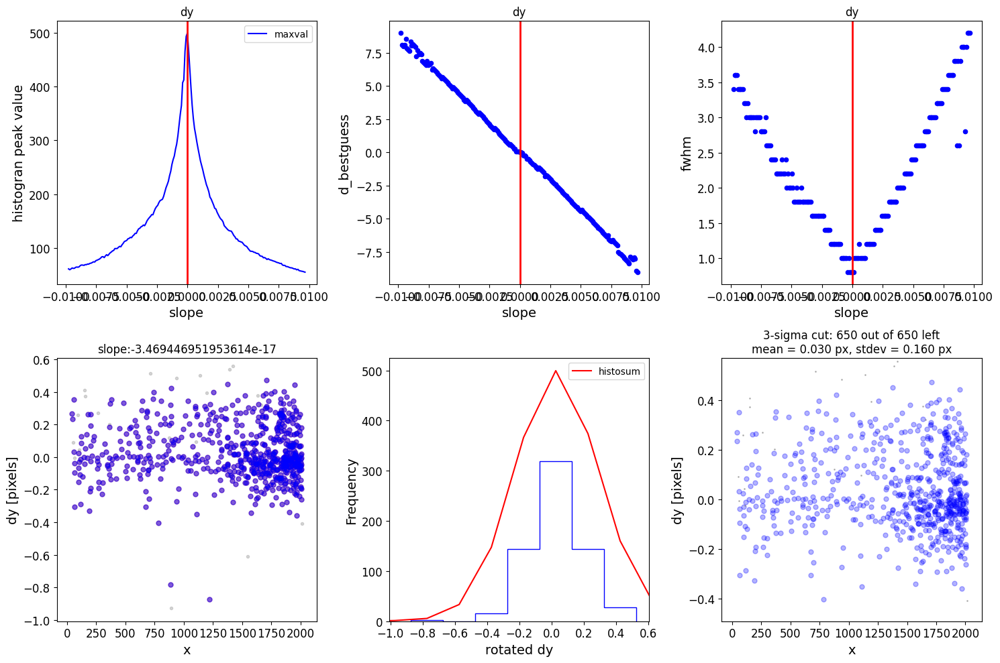

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

2025-05-13 20:12:04,708 - stpipe.TweakRegStep - INFO - TweakRegStep instance created.
2025-05-13 20:12:05,041 - stpipe.TweakRegStep - INFO - Step TweakRegStep running with args ([<ImageModel(2048, 2048) from jw01685011001_02101_00001_nrcalong_cal.fits>],).
2025-05-13 20:12:05,043 - stpipe.TweakRegStep - INFO - Step TweakRegStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: /Users/aswin/jwst123/jwstred_temp_gaia/jw01685011001_02101_00001_nrcalong_jhat.fits
  output_dir: ./jwstred_temp_gaia
  output_ext: .fits
  output_use_model: True
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_catalogs: False
  catalog_format: ecsv
  kernel_fwhm: 2.5
  snr_threshold: 50
  brightest: 4000
  peakmax: None
  enforce_user_order: False
  expand_refcat: False
  minobj: 4
  searchrad: 0.5
  use2dhist: True
  separation: 9
  tolerance: 0.7
  xoffset: 0
  yoffset: 0
  fitgeometry: rshift
  nclip: 3
  sigma: 3.0
  a

replacing SIP ./jwstred_temp_gaia/jw01685011001_02101_00001_nrcalong_jhat.fits


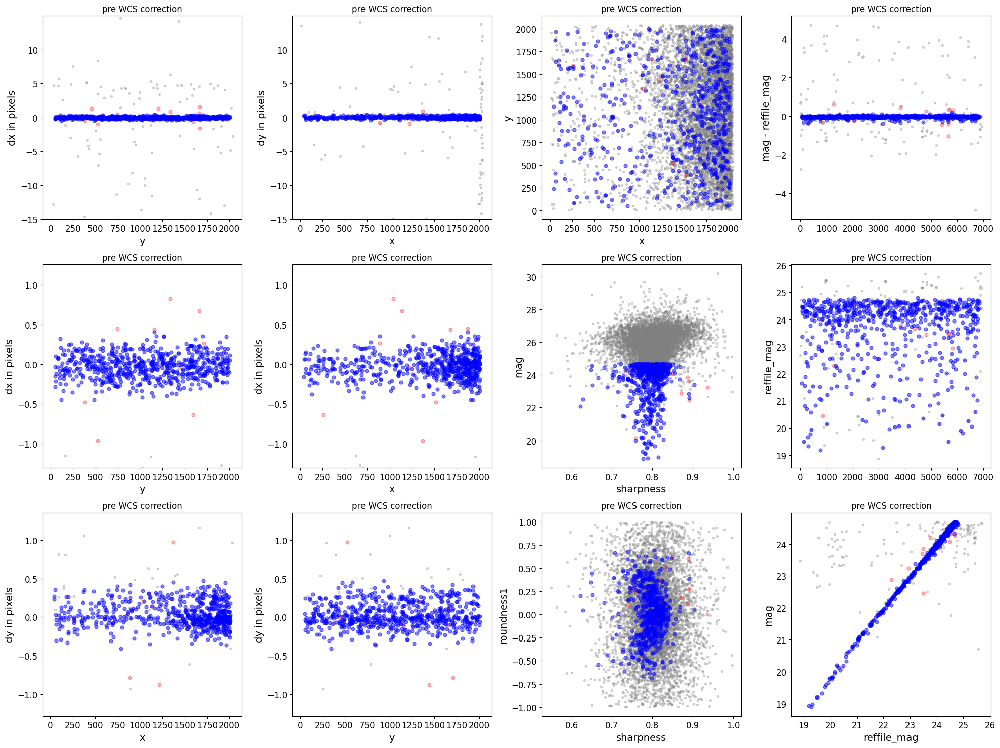

./jwstred_temp_gaia/jw01685011001_02101_00001_nrcalong_jhat.fits


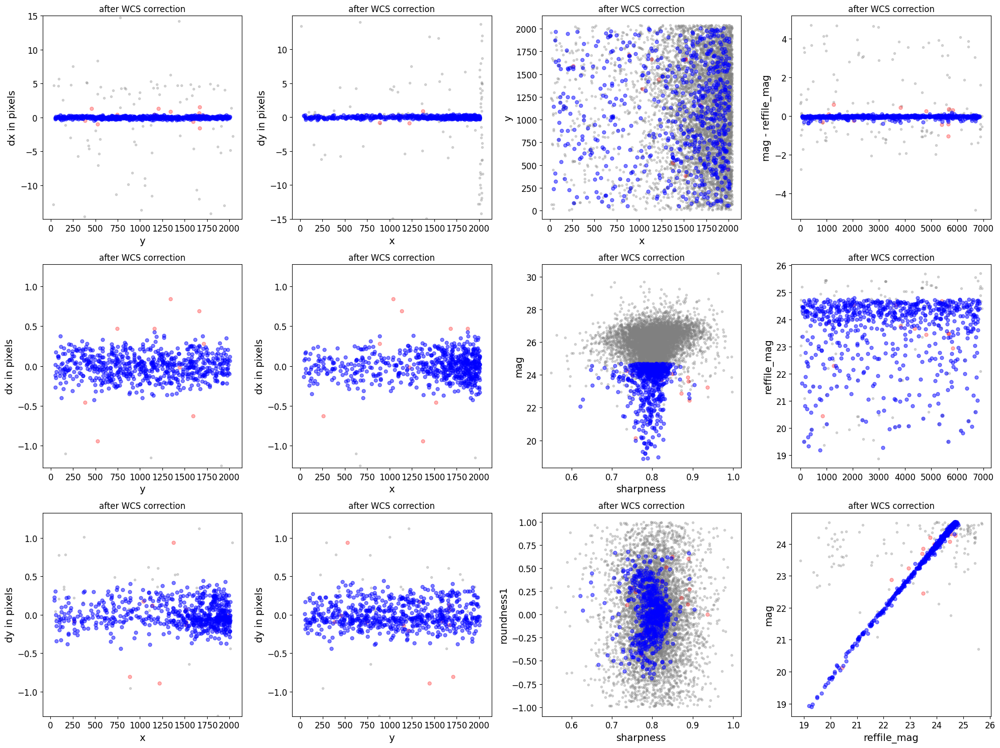

*** Note: close plots to continue!


0

In [51]:
wcs_align = st_wcs_align()

wcs_align.run_all(align_image,
                  telescope='jwst',
                  outsubdir='jwstred_temp_gaia',
                  refcat_racol='ra',
                  refcat_deccol='dec',
                  refcat_magcol='mag',
                  refcat_magerrcol='dmag',
                  overwrite=True,
                  d2d_max=0.1,
                  showplots=2,
                  find_stars_threshold=5,
                  refcatname=ref_catname,
                  iterate_with_xyshifts = True,
                  histocut_order='dxdy',
                  sharpness_lim=(0.3,0.95),
                  roundness1_lim=(-0.7, 0.7),
                  # xshift = -61,
                  # yshift = 12,
                  SNR_min= 5,
                  dmag_max=0.1,
                  Nbright=800,
                  objmag_lim =(17,25),
                  slope_min = -20/2048,
                  binsize_px = 0.2,
                  savephottable = 3)

In [58]:
def calc_dispersion(gaia_table, phot_file,
                     phot_image = False, dist_limit = 1, 
                     plot = False):
    '''
    Calculate disperson between Gaia and JWST sources

    Parameters
    ----------
    gaia_table : astropy.table.Table
        Gaia table
    phot_file : str
        Photometry file
    phot_image : str
        Photometry image
    dist_limit : float
        Distance limit for xmatch
    plot : bool
        Plot the histogram of distances

    Returns
    -------
    dispersion : float
        Dispersion between Gaia and JWST sources
    '''
    jhat_df = pd.read_csv(phot_file, sep = '\s+')    

    if phot_image:
        hdr = fits.open(phot_image)['SCI'].header
        w = wcs.WCS(hdr)
        jh_radec = w.all_pix2world(jhat_df['x'], jhat_df['y'], 0)
        jh_ra, jh_dec = np.array(jh_radec[0])*u.degree, np.array(jh_radec[1])*u.degree
        jh_skycoord = SkyCoord(ra = jh_ra, dec = jh_dec)
    else:    
        jh_ra, jh_dec = jhat_df['ra'].to_numpy()*u.degree, jhat_df['dec'].to_numpy()*u.degree
        jh_skycoord = SkyCoord(ra = jh_ra, dec = jh_dec)
    ga_ra, ga_dec = np.array(gaia_table['ra'])*u.degree, np.array(gaia_table['dec'])*u.degree
    ga_skycoord = SkyCoord(ra = ga_ra, dec = ga_dec)
    
    dist_matched_df = xmatch_common(jh_skycoord, ga_skycoord, dist_limit=dist_limit)

    clip_mean, clip_median, clip_std = sigma_clipped_stats(dist_matched_df['d2d']**2, sigma_lower=3, sigma_upper=1)
    dispersion = np.sqrt(clip_std)
    
    if plot:
        plt.hist(dist_matched_df['d2d'], bins = 40, histtype = 'step', 
                 linestyle = '--', color = 'cornflowerblue')
        plt.xlabel('d2d (arcsec)')
        plt.ylabel('frequency')
        plt.title('JWST-Gaia xmatch')
        plt.grid(alpha = 0.2, linestyle = '--')
        plt.show()
        
    return dispersion

In [59]:
_, _ = jwst_phot(align_image)

0 jwstred_temp_gaia/jw01685011001_02101_00001_nrcalong_cal.phot.txt


2025-05-13 20:14:01,161 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-05-13 20:14:01,287 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-05-13 20:14:01,292 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-05-13 20:14:01,292 - stpipe - INFO - Instrument: NIRCAM
2025-05-13 20:14:01,292 - stpipe - INFO - Detector: NRCALONG
2025-05-13 20:14:01,292 - stpipe - INFO - Filter: F277W
2025-05-13 20:14:01,293 - stpipe - INFO - Pupil: CLEAR
2025-05-13 20:14:01,293 - stpipe - INFO - Subarray: FULL
2025-05-13 20:14:01,301 - stpipe - WARNING - model.meta.resample.pixel_scale_ratio was not found. Assuming the native detector pixel scale (i.e., pixel_scale_ratio = 1)


dmag 0.36200000000000004


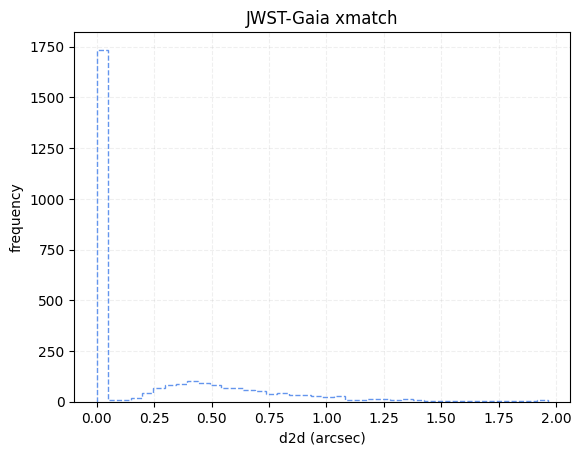

Initial dispersion: 0.009988848037276331"
0 jwstred_temp_gaia/jw01685011001_02101_00001_nrcalong_jhat_cal.phot.txt


2025-05-13 20:14:04,183 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-05-13 20:14:04,310 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-05-13 20:14:04,314 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-05-13 20:14:04,315 - stpipe - INFO - Instrument: NIRCAM
2025-05-13 20:14:04,315 - stpipe - INFO - Detector: NRCALONG
2025-05-13 20:14:04,315 - stpipe - INFO - Filter: F277W
2025-05-13 20:14:04,315 - stpipe - INFO - Pupil: CLEAR
2025-05-13 20:14:04,315 - stpipe - INFO - Subarray: FULL
2025-05-13 20:14:04,324 - stpipe - WARNING - model.meta.resample.pixel_scale_ratio was not found. Assuming the native detector pixel scale (i.e., pixel_scale_ratio = 1)


dmag 0.36200000000000004


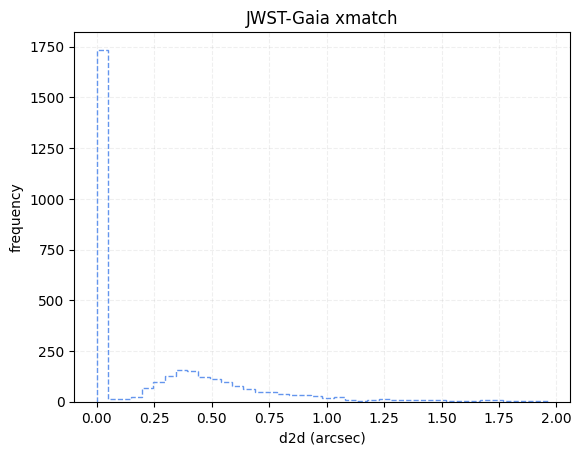

Final dispersion: 0.009997970334674441"


In [60]:
outdir = 'jwstred_temp_gaia'
photfilename = ref_catname
if 'cal.fits' in align_image:
    jhat_image = os.path.join(outdir, os.path.basename(align_image.replace('cal.fits', 'jhat.fits')))
    temp_cal_name = jhat_image.replace('jhat.fits', 'jhat_cal.fits')
    phot_image = False
elif 'i2d.fits' in align_image:
    jhat_image = os.path.join(outdir, os.path.basename(align_image.replace('i2d.fits', 'jhat.fits')))
    temp_cal_name = jhat_image.replace('jhat.fits', 'jhat_i2d.fits')
    phot_image = temp_cal_name

refcat_in = Table.read(photfilename, format='ascii')
dispersion_initial = calc_dispersion(refcat_in, jhat_image.replace('_jhat.fits', '.phot.txt'), dist_limit = 2, plot = True)
print(f'Initial dispersion: {dispersion_initial}"')
os.rename(jhat_image, temp_cal_name)
aligned_refcat, aligned_photfilename = jwst_phot(temp_cal_name)
dispersion_final = calc_dispersion(refcat_in, aligned_photfilename, phot_image = phot_image, dist_limit = 2, plot = True)
print(f'Final dispersion: {dispersion_final}"')
os.rename(temp_cal_name, jhat_image)

## Align to Catalog

You can also align each image to the Gaia DR3 catalog, or you
could replace the catalog created in step one with your own
catalog of the field. 



In [3]:
# align_image = glob.glob('jwstred_temp_gaia/jw01334001001_02101_00001_nrca4_cal.fits')[0] #short wavelength
# align_image = glob.glob('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits')[0] #long wavelength
# align_image = glob.glob('jwstred_temp_dolphot/out_filter/f150w_i2d.fits')[0]
align_image = glob.glob('f115w_i2d.fits')[0]
# align_image = glob.glob('jwstred_temp_gaia/jw01685011001_02101_00001_nrcalong_cal.fits')[0]
# align_image = glob.glob('frb20250316a/f150w2_i2d.fits')[0]                        
# align_image = glob.glob('jwstred_temp_gaia/f277w_i2d.fits')[0] #level3 file
# align_image = glob.glob('jwstred_temp_mosaic/jw02784002001_02101_00001_nrcb1_cal.fits')[0]

In [15]:
wcs_align = st_wcs_align()
    
wcs_align.run_all(align_image,
          telescope='jwst',
          outsubdir='jwstred_temp_gaia',
          overwrite=True,
          d2d_max=2.0, 
          find_stars_threshold = 3,
          showplots=2,
          refcatname='Gaia',
          refcat_pmflag = True,
          histocut_order='dxdy',
          use_dq = True,
          verbose = True,
          iterate_with_xyshifts = True,
          xshift = 0,
          yshift = 0,
              sharpness_lim=(0.3,0.95),
              roundness1_lim=(-0.7, 0.7),
              # Nbright = 200,
              SNR_min= 5,
              dmag_max=.1,
              objmag_lim =(15,22),
              # refmag_lim = (12,19),
              binsize_px = 1.0,
              saveplots = 0,
              slope_min = -20/2048,
              savephottable = 3)

telescope set to jwst

### Doing photometry on frb20250316a/f150w2_i2d.fits
True ./jwstred_temp_gaia/f150w2.phot.txt
photometry catalog filename: ./jwstred_temp_gaia/f150w2.phot.txt
Instrument: NIRCAM, aperture:NRCB4_FULL
Finding stars --- Detector: MULTIPLE, Filter: F150W2
FWHM for the filter F150W2: 1.628 px
Background and rms using MMMBackground and MADStdBackgroundRMS: 0.17351628839969635 0.005787548729474754


2025-05-25 20:20:24,538 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.



Number of sources found in the image: 53597
-------------------------------------



2025-05-25 20:20:25,844 - CRDS - INFO -  Calibration SW Found: jwst 1.14.0 (/Users/aswin/anaconda3/envs/webbphot/lib/python3.10/site-packages/jwst-1.14.0.dist-info)
2025-05-25 20:20:26,224 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-05-25 20:20:26,230 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-05-25 20:20:26,230 - stpipe - INFO - Instrument: NIRCAM
2025-05-25 20:20:26,230 - stpipe - INFO - Detector: MULTIPLE
2025-05-25 20:20:26,231 - stpipe - INFO - Filter: F150W2
2025-05-25 20:20:26,231 - stpipe - INFO - Pupil: CLEAR
2025-05-25 20:20:26,231 - stpipe - INFO - Subarray: FULL


radii:[3.454]pixels radius_sky_in:6.244999885559082 radius_sky_out:9.473999977111816  radius_for_mag:[3.454]
Performing aperture photometry for radius r = 3.4539999961853027 px
Time Elapsed: 3.476712583011249
45515 objects left after removing entries with NaNs in mag or dmag column
dmag 0.2172
SNR_min cut: 43624 objects left after removing entries dmag>0.2172 (SNR<5)
43624 out of 45515 entries remain in photometry table
Saving ./jwstred_temp_gaia/f150w2.phot.txt
########### !!!!!!!!!!  INITIAL CUT on image photometry cat: starting with 45515 objects
dmag_max =0.1 CUT:
dmag 0.1
39717 left
SHARPNESS =(0.3, 0.95) CUT:
sharpness 0.95
39683 left
roundness1=(-0.7, 0.7) CUT:
roundness1 0.7
34086 left
objmag_lim=(15, 22) CUT:
mag 22
12 left
12 of image photometry objects pass initial cuts #1, 45503 cut
Getting Gaia and matching it: ra=182.40875757922075 dec=58.84809469277173 radius=0.03922884609194338 deg
RA/Dec columns in reference catalog:  auto auto


2025-05-25 20:20:33,711 - stpipe - INFO - Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
Number of stars: 18
### NO propoer motion correction!!!
Number of stars after removing nan's: 18
########### !!!!!!!!!!  INITIAL CUT on reference catalog: starting with 18 objects
18 of image photometry objects pass initial cuts #1, 0 cut
Matching reference catalog Gaia
Using 12 image objects that are in x_idl=[-25.81,100.43] and y_idl=[-15.17,95.67] range
x 4279
y 4316
Keeping 5 out of 18 catalog objects within x=40.0-4279 and y=40.0-4316
Keeping 5  after removing NaNs from ra/dec
!! Matching 12 image objects to 5 refcat objects!
Saving refcat file into ./jwstred_temp_gaia/f150w2.refcat.txt
########### !!!!!!!!!!  INITIAL CUT on matched cat: starting with 12 objects
d2d =2.0 CUT using gaia_d2d:
gaia_d2d 2.0
2 left
2 of image photometry objects pass initial cuts #1, 10 cut


RuntimeError: Only 2 objects pass the initial cut, at least 3 required!

Aligning f322w2_jhat_i2d.fits to JWST
False ./jwstred_temp_gaia//f322w2_jhat.phot.txt


2025-05-20 18:35:58,518 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-05-20 18:35:58,657 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-05-20 18:35:58,661 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-05-20 18:35:58,662 - stpipe - INFO - Instrument: NIRCAM
2025-05-20 18:35:58,662 - stpipe - INFO - Detector: NRCBLONG
2025-05-20 18:35:58,662 - stpipe - INFO - Filter: F322W2
2025-05-20 18:35:58,662 - stpipe - INFO - Pupil: CLEAR
2025-05-20 18:35:58,662 - stpipe - INFO - Subarray: FULL


dmag 0.2172
dmag 0.1
sharpness 0.95
roundness1 0.7
mag 25
x 2041
y 2033
Saving refcat file into ./jwstred_temp_gaia//f322w2_jhat.refcat.txt
reffile_d2d 2.0
*** Note: close plot to continue!


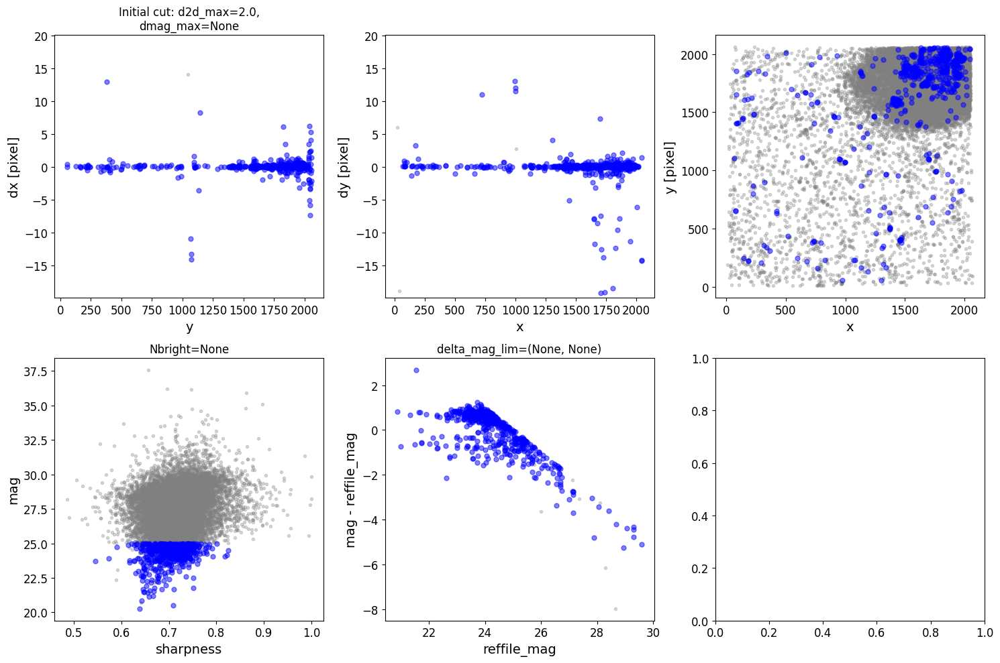

    slope  intercept  maxval  index  d_bestguess  fwhm  multimax
-0.000293   0.303662   469.0     15     0.410032   2.0     False
d_rot_tmp 1.2100318931305243
Keeping 531 out of 531, skippin 0 because of null values in columns d_rot_tmp
median: 0.247517
75.000000 percentile cut: max residual for cut: 0.260588
__tmp_residuals 0.26058820238272695
median: 0.249768
i:00 mean:0.249768(0.006224) stdev:0.124014(0.004396) X2norm:1.00 Nchanged:0 Ngood:398 Nclip:133

mean: 0.239761
i:01 mean:0.239761(0.007375) stdev:0.155234(0.005209) X2norm:1.00 Nchanged:46 Ngood:444 Nclip:87

mean: 0.228333
i:02 mean:0.228333(0.008593) stdev:0.188273(0.006070) X2norm:1.00 Nchanged:37 Ngood:481 Nclip:50

mean: 0.223676
i:03 mean:0.223676(0.009406) stdev:0.210538(0.006645) X2norm:1.00 Nchanged:21 Ngood:502 Nclip:29

mean: 0.226073
i:04 mean:0.226073(0.010104) stdev:0.229291(0.007138) X2norm:1.00 Nchanged:14 Ngood:516 Nclip:15

mean: 0.233594
i:05 mean:0.233594(0.010446) stdev:0.238429(0.007379) X2norm:1.00 Nchan

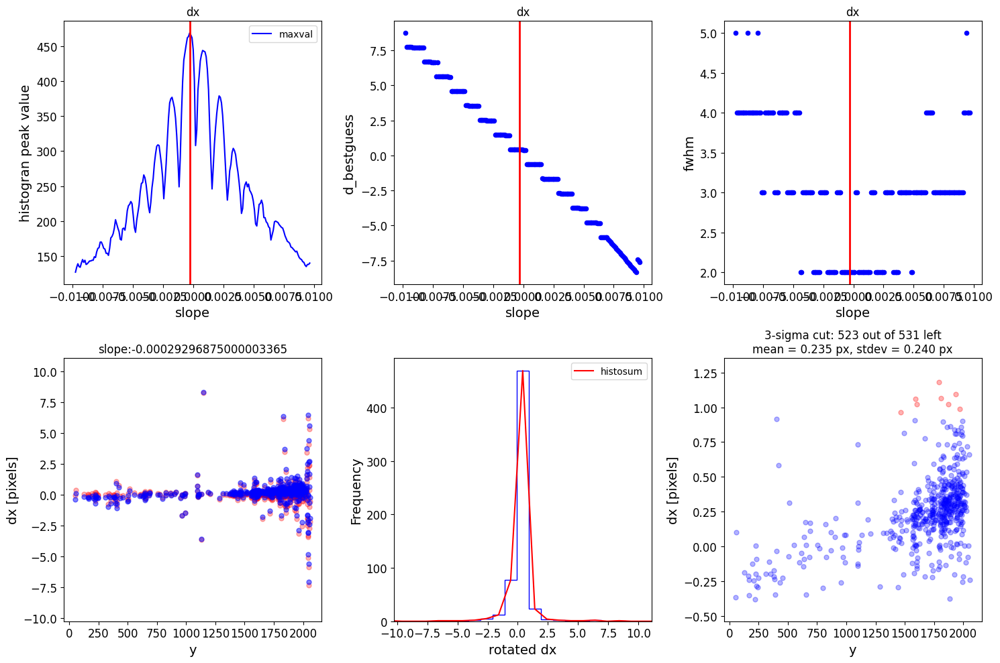

    slope  intercept  maxval  index  d_bestguess  fwhm  multimax
-0.000488   0.508057   331.0     25    -0.061336   2.0     False
d_rot_tmp 0.7386638540098389
Keeping 468 out of 468, skippin 0 because of null values in columns d_rot_tmp
median: 0.316198
75.000000 percentile cut: max residual for cut: 0.289510
__tmp_residuals 0.2895102974973179
median: 0.354219
i:00 mean:0.354219(0.007516) stdev:0.140614(0.005307) X2norm:1.00 Nchanged:0 Ngood:351 Nclip:117

mean: 0.346616
i:01 mean:0.346616(0.008879) stdev:0.177793(0.006270) X2norm:1.00 Nchanged:51 Ngood:402 Nclip:66

mean: 0.328822
i:02 mean:0.328822(0.009598) stdev:0.195989(0.006778) X2norm:1.00 Nchanged:16 Ngood:418 Nclip:50

mean: 0.315923
i:03 mean:0.315923(0.010208) stdev:0.210934(0.007210) X2norm:1.00 Nchanged:10 Ngood:428 Nclip:40

mean: 0.297786
i:04 mean:0.297786(0.011083) stdev:0.232469(0.007828) X2norm:1.00 Nchanged:13 Ngood:441 Nclip:27

mean: 0.284317
i:05 mean:0.284317(0.011739) stdev:0.248745(0.008291) X2norm:1.00 Nchang

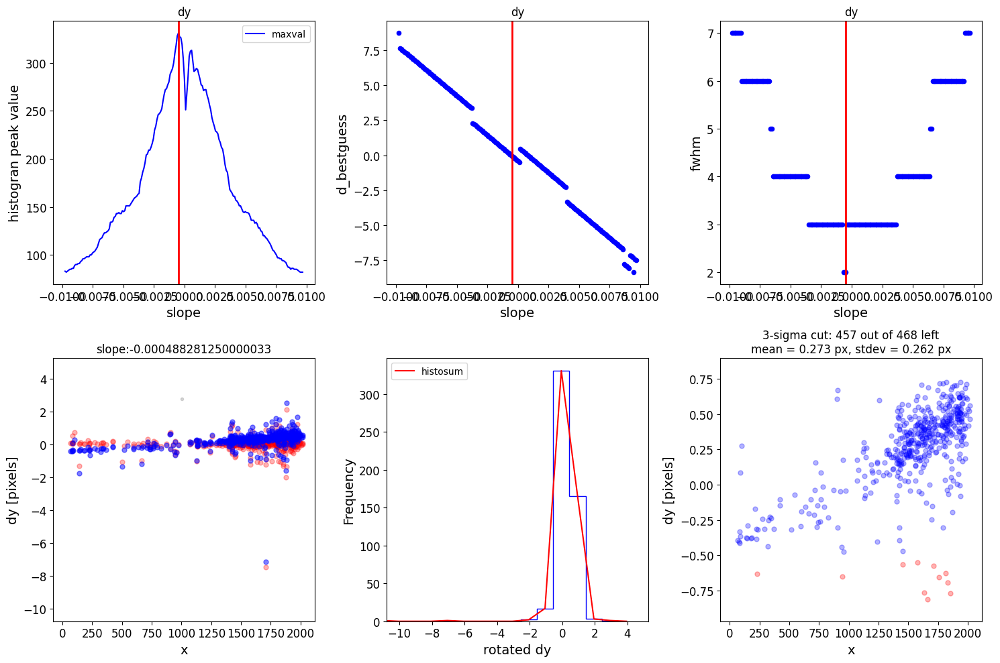

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

dx median of best matched objects of 1st iteration: 0.04002326733825612 dy median of best matched objects of 1st iteration: 0.05435955929897318
x 2041
y 2033
reffile_d2d 2.0
    slope  intercept  maxval  index  d_bestguess  fwhm  multimax
-0.000293   0.303662   469.0     15     0.410032   2.0     False
d_rot_tmp 1.2100318931305243
Keeping 532 out of 532, skippin 0 because of null values in columns d_rot_tmp
median: 0.248025
75.000000 percentile cut: max residual for cut: 0.260197
__tmp_residuals 0.26019745710997644
median: 0.251978
i:00 mean:0.251978(0.006203) stdev:0.123751(0.004381) X2norm:1.00 Nchanged:0 Ngood:399 Nclip:133

mean: 0.241102
i:01 mean:0.241102(0.007325) stdev:0.154179(0.005174) X2norm:1.00 Nchanged:45 Ngood:444 Nclip:88

mean: 0.229785
i:02 mean:0.229785(0.008539) stdev:0.187087(0.006032) X2norm:1.00 Nchanged:37 Ngood:481 Nclip:51

mean: 0.223076
i:03 mean:0.223076(0.009340) stdev:0.209061(0.006598) X2norm:1.00 Nchanged:21 Ngood:502 Nclip:30

mean: 0.225489
i:04 mean:

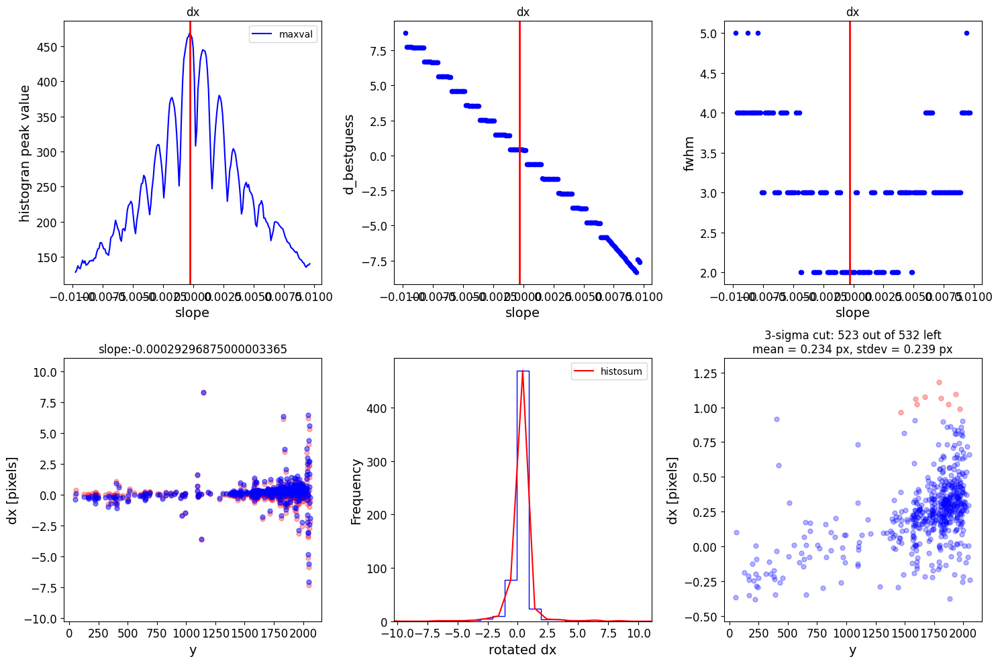

    slope  intercept  maxval  index  d_bestguess  fwhm  multimax
-0.000488   0.508057   330.0     25    -0.061336   3.0     False
d_rot_tmp 0.7386638540098389
Keeping 467 out of 467, skippin 0 because of null values in columns d_rot_tmp
median: 0.316321
75.000000 percentile cut: max residual for cut: 0.289183
__tmp_residuals 0.28918255863690606
median: 0.353881
i:00 mean:0.353881(0.007501) stdev:0.140135(0.005297) X2norm:1.00 Nchanged:0 Ngood:350 Nclip:117

mean: 0.347647
i:01 mean:0.347647(0.008840) stdev:0.176806(0.006243) X2norm:1.00 Nchanged:51 Ngood:401 Nclip:66

mean: 0.328822
i:02 mean:0.328822(0.009598) stdev:0.195989(0.006778) X2norm:1.00 Nchanged:17 Ngood:418 Nclip:49

mean: 0.315923
i:03 mean:0.315923(0.010208) stdev:0.210934(0.007210) X2norm:1.00 Nchanged:10 Ngood:428 Nclip:39

mean: 0.297786
i:04 mean:0.297786(0.011083) stdev:0.232469(0.007828) X2norm:1.00 Nchanged:13 Ngood:441 Nclip:26

mean: 0.284317
i:05 mean:0.284317(0.011739) stdev:0.248745(0.008291) X2norm:1.00 Nchan

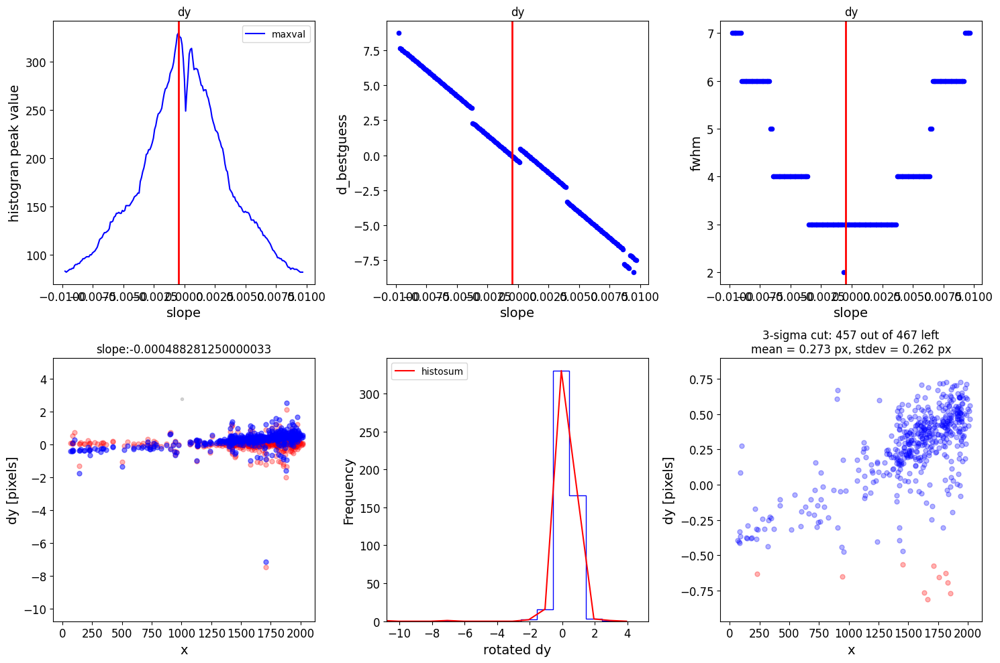

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

2025-05-20 18:36:05,925 - stpipe.TweakRegStep - INFO - TweakRegStep instance created.
2025-05-20 18:36:06,345 - stpipe.TweakRegStep - INFO - Step TweakRegStep running with args ([<ImageModel(2073, 2081) from f322w2_jhat_i2d.fits>],).
2025-05-20 18:36:06,346 - stpipe.TweakRegStep - INFO - Step TweakRegStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: /Users/aswin/jwst123/jwstred_temp_gaia/f322w2_jhat_jhat.fits
  output_dir: ./jwstred_temp_gaia
  output_ext: .fits
  output_use_model: True
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_catalogs: False
  catalog_format: ecsv
  kernel_fwhm: 2.5
  snr_threshold: 50
  brightest: 4000
  peakmax: None
  enforce_user_order: False
  expand_refcat: False
  minobj: 4
  searchrad: 0.5
  use2dhist: True
  separation: 9
  tolerance: 0.7
  xoffset: 0
  yoffset: 0
  fitgeometry: general
  nclip: 3
  sigma: 3.0
  align_to_gaia: False
  gaia_catalog: GAIADR2
 

WCSAXES 2 2
CRPIX1 1040.6807919816924 1040.6807919817
CRPIX2 1026.3011916143707 1026.3011916144
PC1_1 0.6472937040208769 0.64726757520855
PC1_2 0.7622406842559202 0.76227567966889
PC2_1 0.7622406842559202 0.76233526523307
PC2_2 -0.6472937040208769 -0.64733319092701
CDELT1 1.74992344037935e-05 1.7499234403794e-05
CDELT2 1.74992344037935e-05 1.7499234403794e-05
CUNIT1 deg deg
CUNIT2 deg deg
CRVAL1 182.4088161637002 182.40881799765
CRVAL2 58.84830072000674 58.848300545122
MJD-BEG 60814.58034247419 60814.580342474
MJD-AVG 60814.6391974871 60814.639197487
MJD-END 60814.69814862269 60814.698148623
XPOSURE 9469.826999999997 9469.827
TELAPSE 9469.826999999997 9469.827
OBSGEO-X -230665486.86889324 -230665486.86889
OBSGEO-Y -1444301486.2820294 -1444301486.282
OBSGEO-Z -856906362.8332468 -856906362.83325
RADESYS ICRS ICRS
VELOSYS 18074.1 18074.1


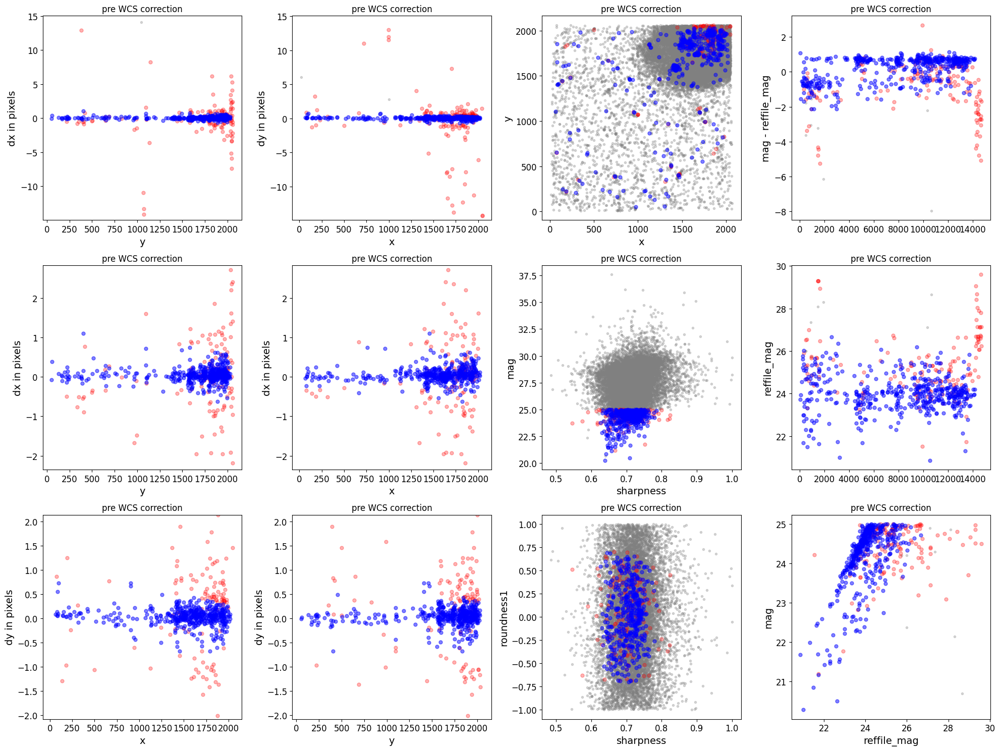

./jwstred_temp_gaia//f322w2_jhat_jhat.fits


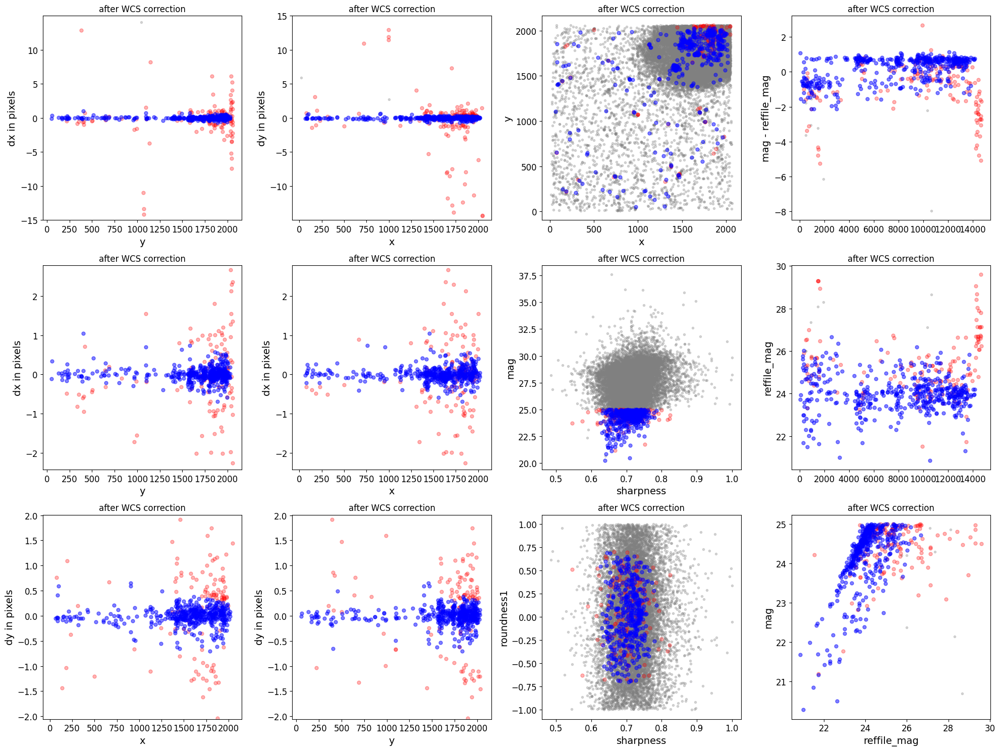

*** Note: close plots to continue!
Initial dispersion: 0.011179519717493654
0 jwstred_temp_gaia/f322w2_jhat_jhat_i2d.phot.txt


2025-05-20 18:36:10,082 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-05-20 18:36:10,219 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-05-20 18:36:10,224 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-05-20 18:36:10,224 - stpipe - INFO - Instrument: NIRCAM
2025-05-20 18:36:10,224 - stpipe - INFO - Detector: NRCBLONG
2025-05-20 18:36:10,225 - stpipe - INFO - Filter: F322W2
2025-05-20 18:36:10,225 - stpipe - INFO - Pupil: CLEAR
2025-05-20 18:36:10,225 - stpipe - INFO - Subarray: FULL


dmag 0.36200000000000004
Final dispersion: 0.011281446856054455
Final JWST dispersion for jwstred_temp_gaia/f322w2_jhat_i2d.fits: 0.011281446856054455"


In [392]:
mosaic_name = 'jwstred_temp_gaia/f322w2_jhat_i2d.fits'
outdir = 'jwstred_temp_gaia/'
align_jwst_image(align_image=mosaic_name, outdir=outdir, gaia=False, photfilename='jwstred_temp_gaia/jhat_corr_phot.txt')

Aligning f115w_i2d.fits to Gaia
telescope set to jwst

### Doing photometry on f115w_i2d.fits
True ././f115w.phot.txt
photometry catalog filename: ././f115w.phot.txt
Instrument: NIRCAM, aperture:NRCB4_FULL
Finding stars --- Detector: MULTIPLE, Filter: F115W
FWHM for the filter F115W: 1.298 px
Background and rms using MMMBackground and MADStdBackgroundRMS: 0.24288997054100037 0.04680544635586156


2025-06-21 18:20:46,351 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.



Number of sources found in the image: 91823
-------------------------------------



2025-06-21 18:20:47,657 - CRDS - INFO -  Calibration SW Found: jwst 1.14.0 (/Users/aswin/anaconda3/envs/webbphot/lib/python3.10/site-packages/jwst-1.14.0.dist-info)
2025-06-21 18:20:48,033 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-06-21 18:20:48,037 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-06-21 18:20:48,038 - stpipe - INFO - Instrument: NIRCAM
2025-06-21 18:20:48,038 - stpipe - INFO - Detector: MULTIPLE
2025-06-21 18:20:48,038 - stpipe - INFO - Filter: F115W
2025-06-21 18:20:48,038 - stpipe - INFO - Pupil: CLEAR
2025-06-21 18:20:48,038 - stpipe - INFO - Subarray: FULL


radii:[3.287]pixels radius_sky_in:6.828999996185303 radius_sky_out:9.722999572753906  radius_for_mag:[3.287]
Performing aperture photometry for radius r = 3.2869999408721924 px
Time Elapsed: 5.226734041934833
91781 objects left after removing entries with NaNs in mag or dmag column
dmag 0.2172
SNR_min cut: 91294 objects left after removing entries dmag>0.2172 (SNR<5)
91294 out of 91781 entries remain in photometry table
Saving ././f115w.phot.txt
########### !!!!!!!!!!  INITIAL CUT on image photometry cat: starting with 91781 objects
dmag_max =0.1 CUT:
dmag 0.1
85629 left
SHARPNESS =(0.3, 0.95) CUT:
sharpness 0.95
85623 left
roundness1=(-0.7, 0.7) CUT:
roundness1 0.7
81938 left
objmag_lim=(15, 25) CUT:
mag 25
10231 left
10231 of image photometry objects pass initial cuts #1, 81550 cut
Getting Gaia and matching it: ra=184.8338494759361 dec=47.16048553684641 radius=0.07202362420236073 deg
RA/Dec columns in reference catalog:  auto auto


2025-06-21 18:20:59,458 - stpipe - INFO - Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
Number of stars: 53
### Applying proper motion correction to epoch mjd=60102.13632945222
Number of stars after removing nan's: 41
########### !!!!!!!!!!  INITIAL CUT on reference catalog: starting with 41 objects
41 of image photometry objects pass initial cuts #1, 0 cut
Matching reference catalog Gaia
Using 10231 image objects that are in x_idl=[-30.98,202.65] and y_idl=[-31.67,105.41] range
x 10018
y 4504
Keeping 13 out of 41 catalog objects within x=40.0-10018 and y=40.0-4504
Keeping 13  after removing NaNs from ra/dec
!! Matching 10231 image objects to 13 refcat objects!
Saving refcat file into ././f115w.refcat.txt
########### !!!!!!!!!!  INITIAL CUT on matched cat: starting with 10231 objects
d2d =0.5 CUT using gaia_d2d:
gaia_d2d 0.5
82 left
82 of image photometry objects pass initial cuts #1, 10149 cut
dx median: -1.9695519665983738
dy median: -0.5233077606424104
*** Note: close plot to continue!


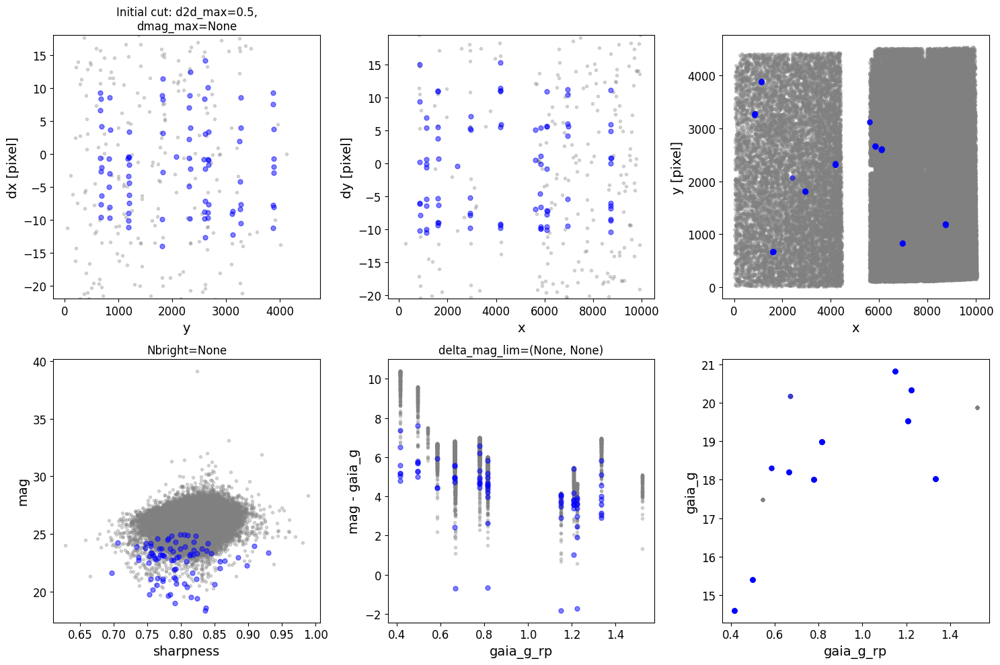

### Doing histogram cut for dx, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dx versus y
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
    slope  intercept  maxval  index  d_bestguess  fwhm  multimax
-0.000293   0.665625    11.0     14    -0.604133   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp 0.19586723410157458

rough_cut_px=0.8 pixels removes 71 from 82 entries
Keeping 11 out of 11, skippin 0 because of null values in columns d_rot_tmp
median: -0.762510
75.000000 percentile cut: max residual for cut: 0.318061
__tmp_residuals 0.3180607044329501
median: -0.781741
i:00 mean:-0.781741(0.070692) stdev:0.187035(0.046759) X2norm:0.93 Nchanged:0 Ngood:8 N

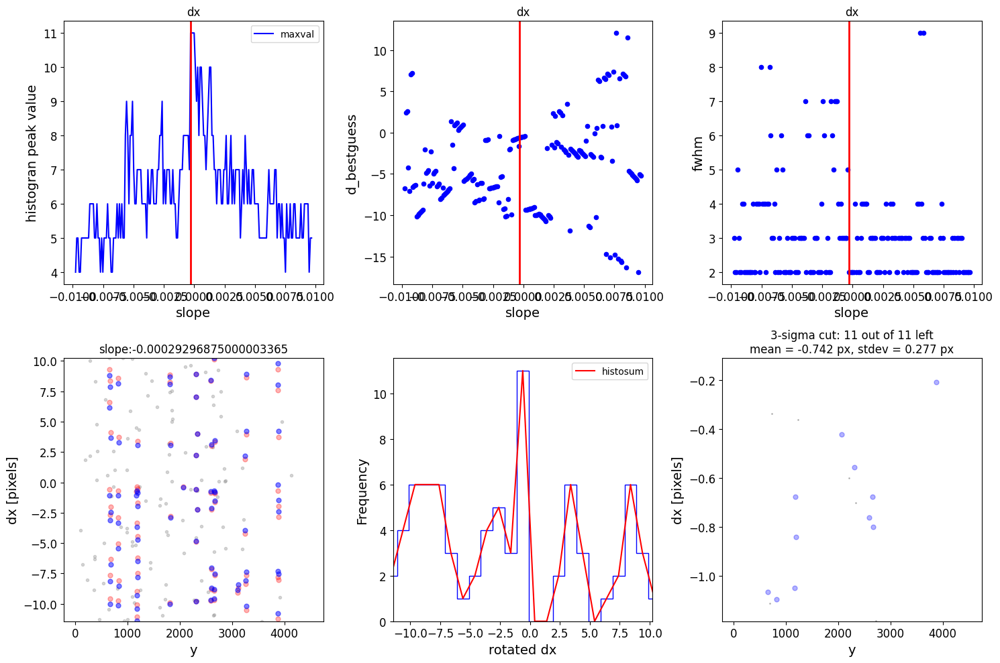

### Doing histogram cut for dy, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dy versus x
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
        slope    intercept  maxval  index  d_bestguess  fwhm  multimax
-3.469447e-17 1.744785e-13     5.0     22    11.091682   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp 11.891682222734008

rough_cut_px=0.8 pixels removes 6 from 11 entries
Keeping 5 out of 5, skippin 0 because of null values in columns d_rot_tmp
median: 11.089041
75.000000 percentile cut: max residual for cut: 0.144999
__tmp_residuals 0.14499914715766415
median: 11.089041
i:00 mean:11.089041(0.024631) stdev:0.034834(0.014221) X2norm:0.79 Nchanged:0 

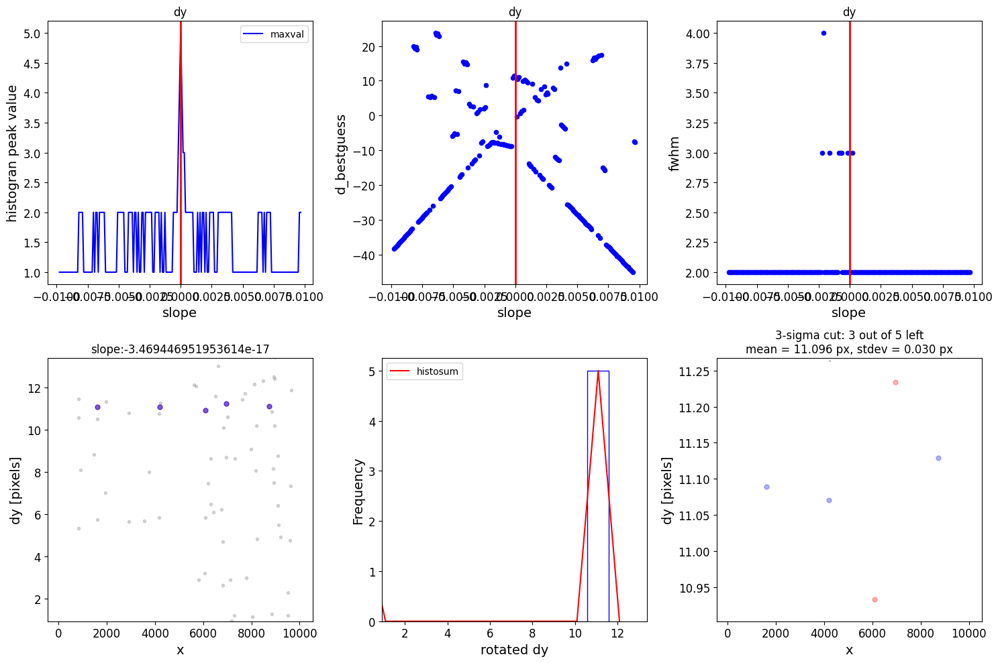

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

dx median of best matched objects of 1st iteration: -0.5921454455246931 dy median of best matched objects of 1st iteration: 11.089040706237938
Matching reference catalog Gaia
Using 10231 image objects that are in x_idl=[-30.98,202.65] and y_idl=[-31.67,105.41] range
x 10018
y 4504
Keeping 13 out of 41 catalog objects within x=40.0-10018 and y=40.0-4504
Keeping 13  after removing NaNs from ra/dec
!! Matching 10231 image objects to 13 refcat objects!
########### !!!!!!!!!!  INITIAL CUT on matched cat: starting with 10231 objects
d2d =0.5 CUT using gaia_d2d:
gaia_d2d 0.5
50 left
50 of image photometry objects pass initial cuts #1, 10181 cut
### Doing histogram cut for dx, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dx versus y
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
   s

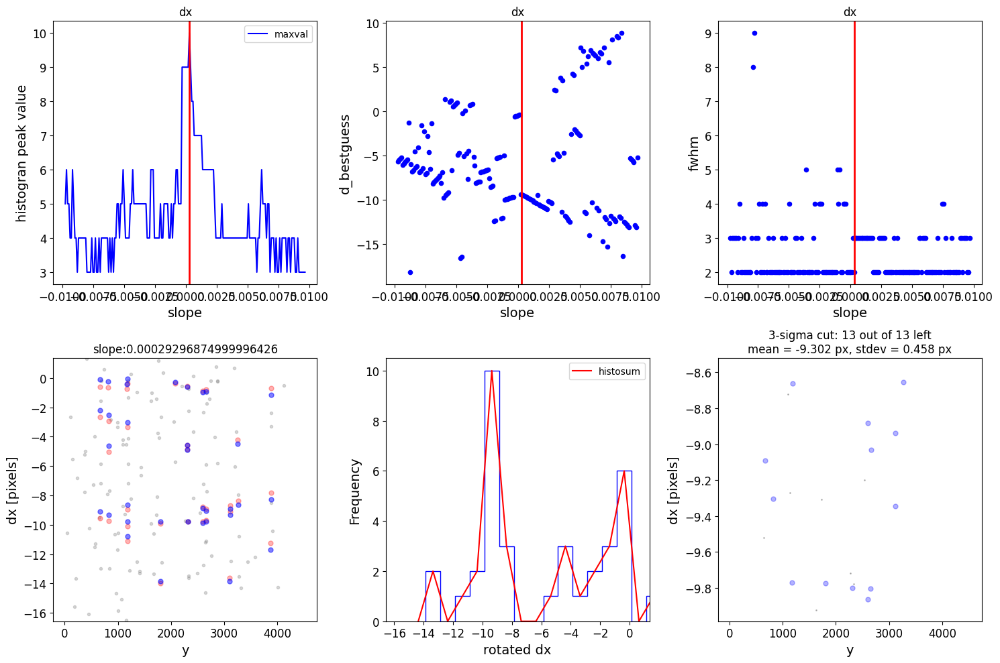

### Doing histogram cut for dy, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dy versus x
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
   slope  intercept  maxval  index  d_bestguess  fwhm  multimax
0.000098  -0.491113     6.0      7     5.609647   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp 6.409647198650636

rough_cut_px=0.8 pixels removes 6 from 13 entries
Keeping 7 out of 7, skippin 0 because of null values in columns d_rot_tmp
median: 5.474523
75.000000 percentile cut: max residual for cut: 0.265102
__tmp_residuals 0.2651017692274009
median: 5.474523
i:00 mean:5.474523(0.064894) stdev:0.129788(0.041042) X2norm:0.88 Nchanged:0 Ngood:5 Nclip:2

me

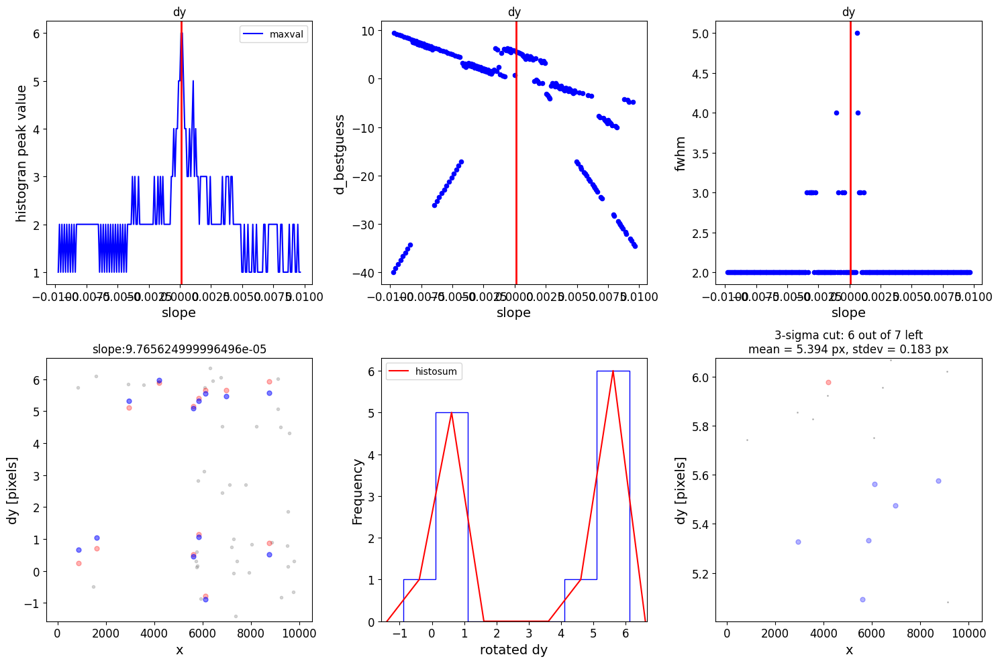

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

2025-06-21 18:21:03,836 - stpipe.TweakRegStep - INFO - TweakRegStep instance created.
2025-06-21 18:21:04,388 - stpipe.TweakRegStep - INFO - Step TweakRegStep running with args ([<ImageModel(4544, 10058) from f115w_i2d.fits>],).
2025-06-21 18:21:04,390 - stpipe.TweakRegStep - INFO - Step TweakRegStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: /Users/aswin/jwst123/f115w_jhat.fits
  output_dir: ./.
  output_ext: .fits
  output_use_model: True
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_catalogs: False
  catalog_format: ecsv
  kernel_fwhm: 2.5
  snr_threshold: 50
  brightest: 4000
  peakmax: None
  enforce_user_order: False
  expand_refcat: False
  minobj: 4
  searchrad: 0.5
  use2dhist: True
  separation: 9
  tolerance: 0.7
  xoffset: 0
  yoffset: 0
  fitgeometry: general
  nclip: 3
  sigma: 3.0
  align_to_gaia: False
  gaia_catalog: GAIADR2
  min_gaia: 30
  save_gaia_catalog: False
  te

Setting output directory for f115w_jhat.fits file to ./.
6 matches are passed to tweakreg general fitting
Fitting tweakreg fitgeometry=general to xy=x,y to ra,dec=gaia_ra,gaia_dec


2025-06-21 18:21:05,227 - stpipe.TweakRegStep - INFO - No matching of sources from 'GROUP ID: f115w_i2d' catalog with sources from the reference 'Unnamed' catalog was requested.
2025-06-21 18:21:05,228 - stpipe.TweakRegStep - INFO - Catalogs are assumed matched with 1-to-1 correspondence.
2025-06-21 18:21:05,229 - stpipe.TweakRegStep - INFO - Found 6 matches for 'GROUP ID: f115w_i2d'...
2025-06-21 18:21:05,229 - stpipe.TweakRegStep - INFO - Performing 'general' fit
2025-06-21 18:21:05,230 - stpipe.TweakRegStep - INFO - Computed 'general' fit for GROUP ID: f115w_i2d:
2025-06-21 18:21:05,231 - stpipe.TweakRegStep - INFO - XSH: -10.2855  YSH: 4.89395    PROPER ROT: 0.00360126    
2025-06-21 18:21:05,231 - stpipe.TweakRegStep - INFO - <ROT>: 0.00360126  SKEW: 0.0222731    ROT_X: -0.00753529  ROT_Y: 0.0147378
2025-06-21 18:21:05,231 - stpipe.TweakRegStep - INFO - <SCALE>: 0.999956  SCALE_X: 1.00001  SCALE_Y: 0.999904
2025-06-21 18:21:05,232 - stpipe.TweakRegStep - INFO - 
2025-06-21 18:21:0

WCSAXES 2 2
CRPIX1 5074.819637474735 5074.8196374747
CRPIX2 2236.461011210442 2236.4610112104
PC1_1 0.49095906437143694 0.49107761075967
PC1_2 0.871182642797435 0.87122490897352
PC2_1 0.871182642797435 0.8711251502033
PC2_2 -0.49095906437143694 -0.49068763782545
CDELT1 8.70101703375708e-06 8.7010170337571e-06
CDELT2 8.70101703375708e-06 8.7010170337571e-06
CUNIT1 deg deg
CUNIT2 deg deg
CRVAL1 184.83374114774136 184.83373999318
CRVAL2 47.160984674755554 47.160888543369
MJD-BEG 60102.11596289236 60102.115962892
MJD-AVG 60102.13632945222 60102.136329452
MJD-END 60102.15672349537 60102.156723495
XPOSURE 2802.294 2802.294
TELAPSE 2802.294 2802.294
OBSGEO-X 123243628.4211238 123243628.42112
OBSGEO-Y -1416673640.439149 -1416673640.4391
OBSGEO-Z -957903797.2301965 -957903797.2302
RADESYS ICRS ICRS
VELOSYS 21154.52 21154.52


2025-06-21 18:21:06,217 - stpipe.TweakRegStep - INFO - Step TweakRegStep done


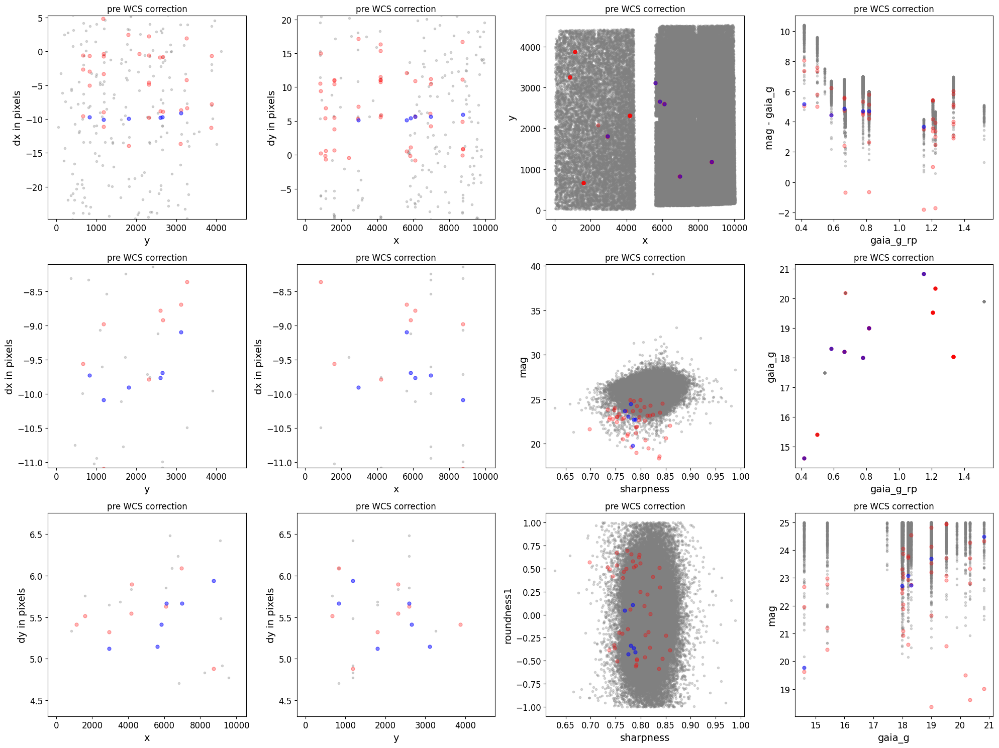

././f115w_jhat.fits


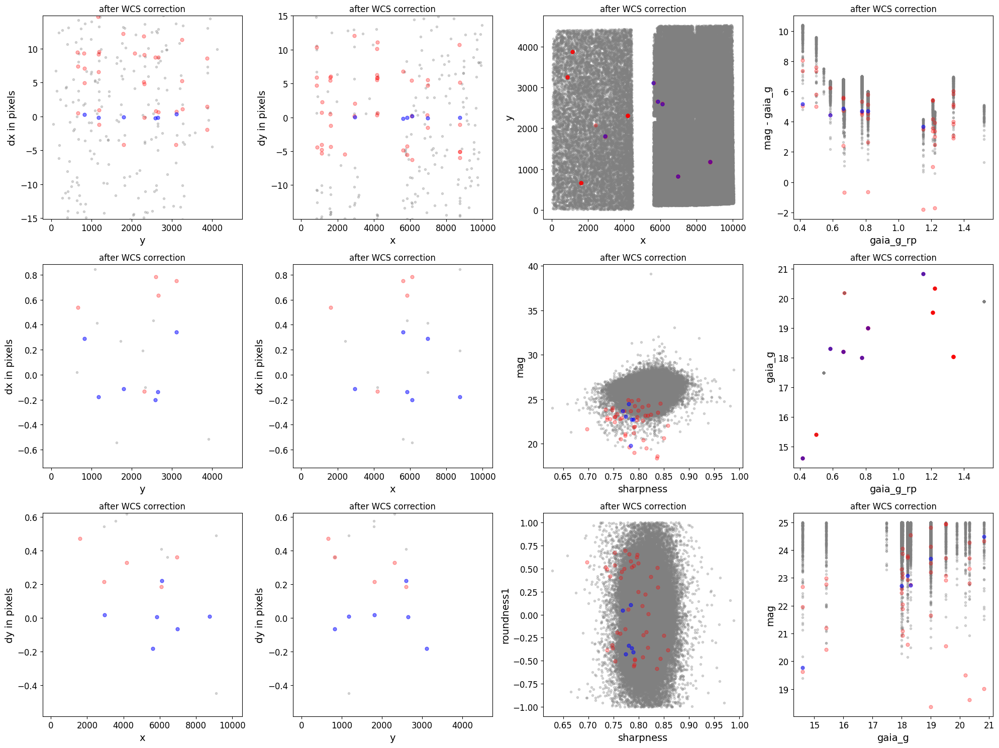

*** Note: close plots to continue!


2025-06-21 18:21:11,825 - stpipe - INFO - Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
Number of Gaia stars: 18


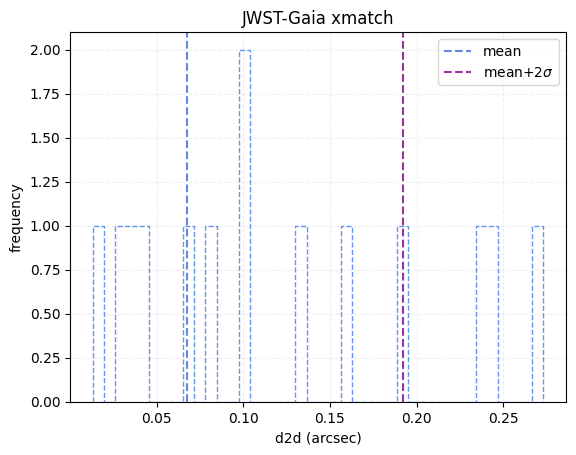

Initial dispersion: 67.37015324023645 mas
0 ./f115w_jhat_i2d.phot.txt


2025-06-21 18:21:28,323 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-06-21 18:21:28,705 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-06-21 18:21:28,710 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-06-21 18:21:28,710 - stpipe - INFO - Instrument: NIRCAM
2025-06-21 18:21:28,711 - stpipe - INFO - Detector: MULTIPLE
2025-06-21 18:21:28,711 - stpipe - INFO - Filter: F115W
2025-06-21 18:21:28,711 - stpipe - INFO - Pupil: CLEAR
2025-06-21 18:21:28,711 - stpipe - INFO - Subarray: FULL


dmag 0.36200000000000004


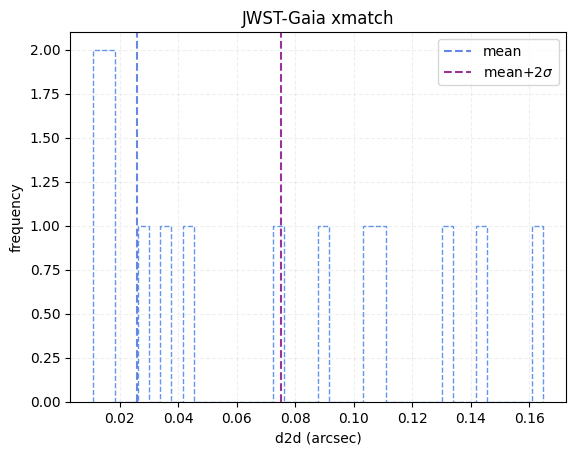

Final dispersion: 25.711750341704654 mas
Final Gaia dispersion for f115w_i2d.fits: 25.711750341704654 mas


In [4]:
outdir = '.'
align_jwst_image(align_image=align_image, outdir=outdir, gaia=True, verbose=True, plot=True)

In [5]:
# save gaia positions
refdf = pd.read_csv(align_image.replace('_i2d.fits', '.refcat.txt'), sep = r'\s+')
np.savetxt('gaia_locs.txt', np.array(refdf[['ra1', 'dec1']]), fmt = '%s')

In [6]:
catalog_data = Catalogs.query_region("182.434625 58.84908333",
                                     radius=0.05,
                                     catalog="Panstarrs",
                                     data_release="dr2",
                                     table="mean")

In [7]:
catalog_data

objName,objAltName1,objAltName2,objAltName3,objID,uniquePspsOBid,ippObjID,surveyID,htmID,zoneID,tessID,projectionID,skyCellID,randomID,batchID,dvoRegionID,processingVersion,objInfoFlag,qualityFlag,raStack,decStack,raStackErr,decStackErr,raMean,decMean,raMeanErr,decMeanErr,epochMean,posMeanChisq,cx,cy,cz,lambda,beta,l,b,nStackObjectRows,nStackDetections,nDetections,ng,nr,ni,nz,ny,gQfPerfect,gMeanPSFMag,gMeanPSFMagErr,gMeanPSFMagStd,gMeanPSFMagNpt,gMeanPSFMagMin,gMeanPSFMagMax,gMeanKronMag,gMeanKronMagErr,gMeanKronMagStd,gMeanKronMagNpt,gMeanApMag,gMeanApMagErr,gMeanApMagStd,gMeanApMagNpt,gFlags,rQfPerfect,rMeanPSFMag,rMeanPSFMagErr,rMeanPSFMagStd,rMeanPSFMagNpt,rMeanPSFMagMin,rMeanPSFMagMax,rMeanKronMag,rMeanKronMagErr,rMeanKronMagStd,rMeanKronMagNpt,rMeanApMag,rMeanApMagErr,rMeanApMagStd,rMeanApMagNpt,rFlags,iQfPerfect,iMeanPSFMag,iMeanPSFMagErr,iMeanPSFMagStd,iMeanPSFMagNpt,iMeanPSFMagMin,iMeanPSFMagMax,iMeanKronMag,iMeanKronMagErr,iMeanKronMagStd,iMeanKronMagNpt,iMeanApMag,iMeanApMagErr,iMeanApMagStd,iMeanApMagNpt,iFlags,zQfPerfect,zMeanPSFMag,zMeanPSFMagErr,zMeanPSFMagStd,zMeanPSFMagNpt,zMeanPSFMagMin,zMeanPSFMagMax,zMeanKronMag,zMeanKronMagErr,zMeanKronMagStd,zMeanKronMagNpt,zMeanApMag,zMeanApMagErr,zMeanApMagStd,zMeanApMagNpt,zFlags,yQfPerfect,yMeanPSFMag,yMeanPSFMagErr,yMeanPSFMagStd,yMeanPSFMagNpt,yMeanPSFMagMin,yMeanPSFMagMax,yMeanKronMag,yMeanKronMagErr,yMeanKronMagStd,yMeanKronMagNpt,yMeanApMag,yMeanApMagErr,yMeanApMagStd,yMeanApMagNpt,yFlags,distance
str21,str4,str4,str4,int64,int64,int64,uint8,int64,int64,uint8,int64,uint8,float64,int64,int64,uint8,int64,uint8,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,int64,int64,int64,int64,int64,int64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,int64,int64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,int64,int64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,int64,int64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,int64,int64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,int64,int64,float64
PSO J182.4325+58.8236,-999,-999,-999,178581824324929069,3584178000018340,306321362536356,0,14676581049447,17858,1,2429,71,0.841647473947748,3584178,71321,3,268513280,32,--,--,--,--,182.43247364,58.82359998,0.02322000078856945,0.02322000078856945,56786.29674769,--,-0.5172081850130715,-0.021971106700113752,0.8555775615488386,148.2409510016995,52.53420937650736,132.9697280469042,57.484438960839135,--,0,1,0,0,1,0,0,--,--,--,--,0,--,--,--,--,--,0,--,--,--,0,0,--,--,--,--,0,--,--,--,--,--,0,--,--,--,0,0,0.9970189929008484,18.547700881958008,0.017721999436616898,--,1,18.547700881958008,18.547700881958008,19.393800735473633,0.04721599817276001,--,1,19.2189998626709,0.017721999436616898,--,1,16,--,--,--,--,0,--,--,--,--,--,0,--,--,--,0,0,--,--,--,--,0,--,--,--,--,--,0,--,--,--,0,0,0.025507656755345397
PSO J182.4340+58.8178,-999,-999,-999,178581824340692143,3584178000018456,306321362536472,0,14676581087216,17858,1,2429,71,0.446537969118485,3584178,71321,3,436285440,52,182.43411457,58.81784532,0.0010000000474974513,0.0010000000474974513,182.43404844,58.81782137,0.13649000227451324,0.13649000227451324,56404.37333333,0.015699999406933784,-0.5172937903823088,-0.021988986957365307,0.8555253467224059,148.24817175495673,52.530367097495756,132.97150251557542,57.490196339312604,--,3,3,0,0,3,0,0,--,--,--,--,0,--,--,--,--,--,0,--,--,--,0,16416,--,--,--,--,0,--,--,--,--,--,0,--,--,--,0,114720,0.9992550015449524,21.56369972229004,0.12480399757623672,0.17650100588798523,2,21.439199447631836,21.688800811767578,21.690099716186523,0.02381799928843975,0.03368400037288666,2,21.638999938964844,0.2000319957733154

In [4]:
from astroquery.esa.euclid import Euclid
from astropy.coordinates import SkyCoord
import astropy.units as u
coord = SkyCoord("182.434625 58.84908333", frame='icrs', unit=u.deg)
table = Euclid.query_object(coordinate=coord, width=u.Quantity(0.1, u.deg), height= u.Quantity(0.1, u.deg))
print(table)

dist basic_download_data_oid to_be_published ... gaia_id gaia_match_quality
                                             ...    NA           NA        
---- ----------------------- --------------- ... ------- ------------------


In [8]:
(catalog_data['raMeanErr'] < 0.03).data.sum()

770

In [9]:
catalog_data

objName,objAltName1,objAltName2,objAltName3,objID,uniquePspsOBid,ippObjID,surveyID,htmID,zoneID,tessID,projectionID,skyCellID,randomID,batchID,dvoRegionID,processingVersion,objInfoFlag,qualityFlag,raStack,decStack,raStackErr,decStackErr,raMean,decMean,raMeanErr,decMeanErr,epochMean,posMeanChisq,cx,cy,cz,lambda,beta,l,b,nStackObjectRows,nStackDetections,nDetections,ng,nr,ni,nz,ny,gQfPerfect,gMeanPSFMag,gMeanPSFMagErr,gMeanPSFMagStd,gMeanPSFMagNpt,gMeanPSFMagMin,gMeanPSFMagMax,gMeanKronMag,gMeanKronMagErr,gMeanKronMagStd,gMeanKronMagNpt,gMeanApMag,gMeanApMagErr,gMeanApMagStd,gMeanApMagNpt,gFlags,rQfPerfect,rMeanPSFMag,rMeanPSFMagErr,rMeanPSFMagStd,rMeanPSFMagNpt,rMeanPSFMagMin,rMeanPSFMagMax,rMeanKronMag,rMeanKronMagErr,rMeanKronMagStd,rMeanKronMagNpt,rMeanApMag,rMeanApMagErr,rMeanApMagStd,rMeanApMagNpt,rFlags,iQfPerfect,iMeanPSFMag,iMeanPSFMagErr,iMeanPSFMagStd,iMeanPSFMagNpt,iMeanPSFMagMin,iMeanPSFMagMax,iMeanKronMag,iMeanKronMagErr,iMeanKronMagStd,iMeanKronMagNpt,iMeanApMag,iMeanApMagErr,iMeanApMagStd,iMeanApMagNpt,iFlags,zQfPerfect,zMeanPSFMag,zMeanPSFMagErr,zMeanPSFMagStd,zMeanPSFMagNpt,zMeanPSFMagMin,zMeanPSFMagMax,zMeanKronMag,zMeanKronMagErr,zMeanKronMagStd,zMeanKronMagNpt,zMeanApMag,zMeanApMagErr,zMeanApMagStd,zMeanApMagNpt,zFlags,yQfPerfect,yMeanPSFMag,yMeanPSFMagErr,yMeanPSFMagStd,yMeanPSFMagNpt,yMeanPSFMagMin,yMeanPSFMagMax,yMeanKronMag,yMeanKronMagErr,yMeanKronMagStd,yMeanKronMagNpt,yMeanApMag,yMeanApMagErr,yMeanApMagStd,yMeanApMagNpt,yFlags,distance
str21,str4,str4,str4,int64,int64,int64,uint8,int64,int64,uint8,int64,uint8,float64,int64,int64,uint8,int64,uint8,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,int64,int64,int64,int64,int64,int64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,int64,int64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,int64,int64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,int64,int64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,int64,int64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,int64,int64,float64
PSO J182.3815+58.8076,-999,-999,-999,178561823815039775,3584178000095942,306321362616326,0,14676580993450,17856,1,2429,71,0.00400379021093602,3584178,71321,3,1343750144,160,182.38150345,58.80755128,0.0010000000474974513,0.0010000000474974513,182.38150345,58.80755128,0.0010000000474974513,0.0010000000474974513,55953.39226852,--,-0.5174669480676182,-0.021520948228152096,0.8554325259451772,148.22533326636002,52.50481905724627,133.0255339006212,57.49181797452363,--,1,0,0,0,0,0,0,--,--,--,--,0,--,--,--,--,--,0,--,--,--,0,114720,--,--,--,--,0,--,--,--,--,--,0,--,--,--,0,16416,--,--,--,--,0,--,--,--,--,--,0,--,--,--,0,16416,--,--,--,--,0,--,--,--,--,--,0,--,--,--,0,16416,--,--,--,--,0,--,--,--,--,--,0,--,--,--,0,16416,0.04980900926461736
PSO J182.3823+58.8072,-999,-999,-999,178561823822929301,3584178000014057,306321362532073,0,14676580993965,17856,1,2429,71,0.263487288042425,3584178,71321,3,268959744,32,--,--,--,--,182.38232134,58.80715791,0.3266899883747101,0.3266899883747101,55255.46826389,--,-0.5174725087768084,-0.02152857912825923,0.8554289701319182,148.22628232128983,52.50479769025409,133.02500271242022,57.49232065101332,--,0,1,0,0,0,1,0,--,--,--,--,0,--,--,--,--,--,0,--,--,--,0,0,--,--,--,--,0,--,--,--,--,--,0,--,--,--,0,0,--,--,--,--,0,--,--,--,--,--,0,--,--,--,0,0,0.6263409852981567,20.933000564575195,0.3263460099697113,--,1,20.933000564575195,20.933000564575195,--,--,--,0,23.042800903320312,0.3263460099697113,--,1,4120,--,--,--,--,0,--,--,--,--,--,0,--,--,--,0,0,0.04990665457584559
PSO J182.3901+58.8054,-999,-999,-999,178561823900937198,3584178000014728,306321362532744,0,146765810

In [13]:
subcat = catalog_data[['raMean', 'decMean', 'raMeanErr', 'decMeanErr', 'gMeanPSFMag', 'gMeanPSFMagErr']]
ra, dec, raerr, decerr = subcat['raMean'].data, subcat['decMean'].data, subcat['raMeanErr'].data, subcat['decMeanErr'].data
gmag, gerr = subcat['gMeanPSFMag'].data, subcat['gMeanPSFMagErr'].data
netmask = ~raerr.mask & ~decerr.mask #& ~gmag.mask & ~gerr.mask
ra, dec, raerr, decerr = ra[netmask].data, dec[netmask].data, raerr[netmask].data, decerr[netmask].data
err_mask = (np.abs(raerr) < 0.031) & (np.abs(decerr) < 0.031)

ra, dec, raerr, decerr = ra[err_mask], dec[err_mask], raerr[err_mask], decerr[err_mask]

In [14]:
len(ra)

723

In [15]:
np.savetxt('jwstred_temp_gaia/ps1_locs.txt', np.array([ra, dec]).T, fmt='%s')

In [467]:
np.array([ra, dec])

array([[182.41027497, 182.40699205, 182.40463694, ..., 182.36192785,
        182.36574807, 182.36798215],
       [ 58.75611498,  58.75378623,  58.75515529, ...,  58.94133838,
         58.94198114,  58.94230679]])

In [454]:
subcat['raStack'].mask

array([ True,  True,  True, ...,  True,  True,  True])

In [4]:
jhat_image = align_image.replace('i2d', 'jhat_i2d')

In [5]:
jhat_image

'f115w_jhat_jhat_i2d.fits'

In [6]:
image_model = ImageModel(jhat_image)
# phot.t[refcat_xcol], phot.t[refcat_ycol] = image_model.meta.wcs.world_to_pixel(SkyCoord(phot.t[refcat_racol],
#     phot.t[refcat_deccol],unit=u.deg))
# sc = image_model.meta.wcs.pixel_to_world(phot.t['x'],phot.t['y'])
# phot.t['ra'] = sc.ra.value
# phot.t['dec'] = sc.dec.value

In [40]:
type(image_model.meta.wcs)

gwcs.wcs.WCS

In [8]:
from asdf import AsdfFile
tree = {"wcs": image_model.meta.wcs}
wcs_file = AsdfFile(tree)
wcs_file.write_to("wcs.asdf")

In [9]:
ast_wcs = wcs.WCS(fits.open(jhat_image)['SCI'].header)
ast_ra, ast_dec = ast_wcs.all_pix2world([1030], [1034], 0)

In [10]:
ast_c = SkyCoord(ast_ra*u.deg, ast_dec*u.deg)

In [11]:
modelc = image_model.meta.wcs.pixel_to_world([1030], [1034])

In [12]:
imcoord = SkyCoord([259.3012246]*u.deg, [43.1284878]*u.deg)

In [13]:
imcoord.separation(modelc)

<Angle [0.00055292] deg>

In [14]:
imcoord.separation(ast_c)

<Angle [1.23356737e-05] deg>

#### Gaia xmatch

In [58]:
def cut_gaia_sources(image, table_gaia):
    im = fits.open(image)
    hdr = im['SCI'].header
    w = wcs.WCS(hdr)
    nx, ny = hdr['NAXIS1'], hdr['NAXIS2']

    pix_coords = w.all_world2pix(np.array(table_gaia['ra']), np.array(table_gaia['dec']), 1)
    im_x, im_y = pix_coords[0], pix_coords[1]
    mask = (im_x > 0) & (im_x < nx) & (im_y > 0) & (im_y < ny)

    return table_gaia[mask]

In [59]:
def query_gaia(image, dr = 'gaiadr3', telescope = 'jwst', save_file = False):
    im = fits.open(image)

    hdr = im['SCI'].header
    nx = hdr['NAXIS1']
    ny = hdr['NAXIS2']

    if telescope == 'jwst':
        image_model = ImageModel(im)
        ra0,dec0 = image_model.meta.wcs(nx/2.0-1,ny/2.0-1)
    if telescope == 'hst':
        w = wcs.WCS(hdr)
        ra0, dec0 = w.pixel_to_world_values(nx/2.0-1, ny/2.0-1)
        
    #find radius of query region usinng image header
    coord0 = SkyCoord(ra0,dec0,unit=(u.deg, u.deg), frame='icrs')
    radius_deg = []
    for x in [0,nx-1]:        
        for y in [0,ny-1]:
            if telescope == 'jwst':
                ra, dec = image_model.meta.wcs(x,y)
            if telescope == 'hst':
                ra, dec = w.pixel_to_world_values(x, y)
            radius_deg.append(coord0.separation(SkyCoord(ra,dec,unit=(u.deg, u.deg), frame='icrs')).deg)
    radius_deg = np.amax(radius_deg)*1.1

    #query gaia
    query ="SELECT * FROM {}.gaia_source WHERE CONTAINS(POINT('ICRS',\
            {}.gaia_source.ra,{}.gaia_source.dec),\
            CIRCLE('ICRS',{},{} ,{}))=1;".format(dr,dr,dr,ra0,dec0,radius_deg)

    job5 = Gaia.launch_job_async(query)
    tb_gaia = job5.get_results() 
    tb_gaia['pm/pmerr'] = (tb_gaia['pmra']**2 + tb_gaia['pmdec']**2) / (tb_gaia['pmra_error']**2 + tb_gaia['pmdec_error']**2)
    tb_gaia = cut_gaia_sources(image, tb_gaia)
    print("Number of Gaia stars:",len(tb_gaia))
    
    if save_file:
        print(f'Saving Gaia query to {save_file}')
        np.savetxt(save_file, np.array(tb_gaia[['ra', 'dec']]), fmt = '%s')
    
    return tb_gaia

In [16]:
def get_GAIA_sources(ra0,dec0,radius_deg,radius_factor=1.1,
                     mjd=None, # if mjd!=None, then proper motion (pm) adjustement is done
                     pm_median = False, # if pm_median, then the median proper motion is added instead of the individual ones
                     datarelease='dr3',
                     calc_mag_errors=True,
                     rename_mag_colnames=True, # renames from f'phot_{filt}_mean_mag' to f'{filt}'
                     remove_null=True,
                     columns=['source_id','ref_epoch','ra','ra_error','dec','dec_error','pmra','pmra_error','pmdec','pmdec_error',
                              'g','g_err','bp','bp_err','rp','rp_err','bp_rp','bp_g','g_rp','bp_rp_err','bp_g_err','g_rp_err']):
#                     columns=['source_id','ref_epoch','ra','ra_error','dec','dec_error','pmra','pmra_error','pmdec','pmdec_error',
#                              'phot_g_mean_mag','phot_bp_mean_mag','phot_rp_mean_mag','bp_rp','bp_g','g_rp','phot_g_mean_flux','phot_g_mean_flux_error','phot_bp_mean_flux','phot_bp_mean_flux_error','phot_rp_mean_flux','phot_rp_mean_flux_error']):
    if datarelease is None:
        dr = 'gaiadr2'
    elif datarelease.lower() in ['dr2','gaiadr2']:
        dr = 'gaiadr2'
    elif datarelease.lower() in ['edr3','gaiaedr3']:
        dr = 'gaiaedr3'
    elif datarelease.lower() in ['dr3','gaiadr3']:
        dr = 'gaiadr3'
    else:
        raise RuntimeError(f'datarelease {datarelease} not known yet')
    
    query ="SELECT * FROM {}.gaia_source WHERE CONTAINS(POINT('ICRS',\
            {}.gaia_source.ra,{}.gaia_source.dec),\
            CIRCLE('ICRS',{},{} ,{}))=1;".format(dr,dr,dr,ra0,dec0,radius_deg)
    
    job5 = Gaia.launch_job_async(query)
    tb_gaia = job5.get_results() 
    print("Number of stars:",len(tb_gaia))
    
    if mjd is not None:
        print(f'### Applying proper motion correction to epoch mjd={mjd}')
        time_gaia = Time(tb_gaia['ref_epoch'], format = 'jyear')[0]
        time_obs = Time(mjd, format ='mjd')

        dRA = ((time_obs - time_gaia).to(u.yr).value * tb_gaia['pmra'].data * u.mas / np.cos(np.deg2rad(tb_gaia['dec']))).to(u.deg).value
        dDec = ((time_obs - time_gaia).to(u.yr).value * tb_gaia['pmdec'].data * u.mas).to(u.deg).value

        if pm_median:
            ok = (np.isfinite(dRA)) & (np.isfinite(dDec)) 
            dRA_median = np.median(dRA[ok])
            dDec_median = np.median(dDec[ok])
            print(f'adding median pm dRA={dRA_median} and dDec={dDec_median}')
            tb_gaia['ra1'] = tb_gaia['ra'] + dRA_median
            tb_gaia['dec1'] = tb_gaia['dec'] + dDec_median
            tb_gaia['ref_epoch1'] = time_obs.decimalyear
        else:
            tb_gaia['ra1'] = tb_gaia['ra'] + dRA
            tb_gaia['dec1'] = tb_gaia['dec'] + dDec
            tb_gaia['ref_epoch1'] = time_obs.decimalyear
        if not('ra1' in columns): columns.append('ra1')
        if not('dec1' in columns): columns.append('dec1')
        if not('ref_epoch1' in columns): columns.append('ref_epoch1')
        #tb_gaia['dRA'] = dRA
        #tb_gaia['dDec'] = dDec
        #columns.extend(['dRA','dDec'])
        racol='ra1'
        deccol='dec1'
    else:
        print(f'### NO propoer motion correction!!!')
        racol='ra'
        deccol='dec'
    
    df = tb_gaia.to_pandas()
    if ('SOURCE_ID' in df.columns) and ('source_id' not in df.columns):
        df = df.rename(columns={'SOURCE_ID': 'source_id'})

    Table.from_pandas(df).write('Gaia_reference_catalog.txt',format='ascii',overwrite=True)

    # renames columns from f'phot_{filt}_mean_mag' to f'{filt}'
    if rename_mag_colnames:
        for filt in ['g','bp','rp']:
            df.rename(columns={f'phot_{filt}_mean_mag':f'{filt}'},inplace=True)
                              
    if calc_mag_errors:
        for filt in ['g','bp','rp']:
            fluxcol = f'phot_{filt}_mean_flux'
            dfluxcol = f'{fluxcol}_error'
            df[f'{filt}_err'] =  2.5 / math.log(10.0) * df[dfluxcol] / df[fluxcol]

        for (filt1,filt2) in [('bp','rp'),('bp','g'),('g','rp')]:
            df[f'{filt1}_{filt2}'] = df[f'{filt1}'] - df[f'{filt2}']
            df[f'{filt1}_{filt2}_err'] = np.sqrt(np.square(df[f'{filt1}']) - np.square(df[f'{filt2}']))

    if remove_null:
        ixs = df.index.values
        for colname in [racol,deccol]:
            #print('XXX',indices)
            (notnull,) = np.where(pd.notnull(df.loc[ixs,colname]))
            ixs = ixs[notnull]
        df = df.loc[ixs]
        print("Number of stars after removing nan's:",len(df[racol]))
                 
    if columns is not None:
        df = df[columns]
    
    #print(df['source_id'])
    #sys.exit(0)

    return(df,racol,deccol)


In [98]:
def calc_dispersion(gaia_table, phot_file, phot_image = False, dist_limit = 1, plot = False, inspect_large_offset = False):
    # gaia_table = gaia_table[gaia_table['pm/pmerr'] < 39]
    jhat_df = pd.read_csv(phot_file, sep = '\s+') #read phot file with uneven spacing

    if phot_image:
        hdr = fits.open(phot_image)['SCI'].header
        w = wcs.WCS(hdr)
        jh_radec = w.all_pix2world(jhat_df['x'], jhat_df['y'], 0)
        jh_ra, jh_dec = np.array(jh_radec[0])*u.degree, np.array(jh_radec[1])*u.degree
        jh_skycoord = SkyCoord(ra = jh_ra, dec = jh_dec)
    else:      
        jh_ra, jh_dec = jhat_df['ra'].to_numpy()*u.degree, jhat_df['dec'].to_numpy()*u.degree
        jh_skycoord = SkyCoord(ra = jh_ra, dec = jh_dec)
    ga_ra, ga_dec = np.array(gaia_table['ra'])*u.degree, np.array(gaia_table['dec'])*u.degree
    ga_skycoord = SkyCoord(ra = ga_ra, dec = ga_dec)
    
    dist_matched_df = xmatch_common(jh_skycoord, ga_skycoord, dist_limit=dist_limit)
    if inspect_large_offset:
        dmask = dist_matched_df['d2d'] > 0.1
        np.savetxt('jwstred_temp_gaia/jwst_large_offset.txt', np.column_stack((np.array(jh_skycoord[dist_matched_df[dmask]['idx_1']].ra.degree),
                       np.array(jh_skycoord[dist_matched_df[dmask]['idx_1']].dec.degree))), fmt='%s', delimiter = ',')
        np.savetxt('jwstred_temp_gaia/gaia_large_offset.txt', np.column_stack((np.array(ga_skycoord[dist_matched_df[dmask]['idx_2']].ra.degree),
                       np.array(ga_skycoord[dist_matched_df[dmask]['idx_2']].dec.degree))), fmt='%s', delimiter = ',')

    clip_mean, clip_median, clip_std = sigma_clipped_stats(dist_matched_df['d2d']**2)#, sigma_lower = 3, sigma_upper = 1)
    # print(dist_matched_df['d2d'])
    # print(clip_mean, clip_median, clip_std)
    dispersion = np.sqrt(clip_std)
    
    if plot:
        plt.hist(dist_matched_df['d2d'], bins = 40, histtype = 'step', 
                 linestyle = '--', color = 'cornflowerblue')
        plt.xlabel('d2d (arcsec)')
        plt.ylabel('frequency')
        plt.title('JWST-Gaia xmatch')
        plt.grid(alpha = 0.2, linestyle = '--')
        # plt.savefig('i2.png', dpi = 500, bbox_inches = 'tight')
        plt.show()
        
    return dispersion, dist_matched_df, jh_skycoord, ga_skycoord

In [154]:
tb_gaia = query_gaia('jwstred_temp_gaia/f322w2_jhat_i2d.fits', telescope = 'hst', save_file = 'jwstred_temp_gaia/all_gaia_locs.txt')

2025-05-20 12:22:48,975 - stpipe - INFO - Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
Number of Gaia stars: 5
Saving Gaia query to jwstred_temp_gaia/all_gaia_locs.txt


In [155]:
tb_gaia

solution_id,DESIGNATION,SOURCE_ID,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,pm,pmra,pmra_error,pmdec,pmdec_error,ra_dec_corr,ra_parallax_corr,ra_pmra_corr,ra_pmdec_corr,dec_parallax_corr,dec_pmra_corr,dec_pmdec_corr,parallax_pmra_corr,parallax_pmdec_corr,pmra_pmdec_corr,astrometric_n_obs_al,astrometric_n_obs_ac,astrometric_n_good_obs_al,astrometric_n_bad_obs_al,astrometric_gof_al,astrometric_chi2_al,astrometric_excess_noise,astrometric_excess_noise_sig,astrometric_params_solved,astrometric_primary_flag,nu_eff_used_in_astrometry,pseudocolour,pseudocolour_error,ra_pseudocolour_corr,dec_pseudocolour_corr,parallax_pseudocolour_corr,pmra_pseudocolour_corr,pmdec_pseudocolour_corr,astrometric_matched_transits,visibility_periods_used,astrometric_sigma5d_max,matched_transits,new_matched_transits,matched_transits_removed,ipd_gof_harmonic_amplitude,ipd_gof_harmonic_phase,ipd_frac_multi_peak,ipd_frac_odd_win,ruwe,scan_direction_strength_k1,scan_direction_strength_k2,scan_direction_strength_k3,scan_direction_strength_k4,scan_direction_mean_k1,scan_direction_mean_k2,scan_direction_mean_k3,scan_direction_mean_k4,duplicated_source,phot_g_n_obs,phot_g_mean_flux,phot_g_mean_flux_error,phot_g_mean_flux_over_error,phot_g_mean_mag,phot_bp_n_obs,phot_bp_mean_flux,phot_bp_mean_flux_error,phot_bp_mean_flux_over_error,phot_bp_mean_mag,phot_rp_n_obs,phot_rp_mean_flux,phot_rp_mean_flux_error,phot_rp_mean_flux_over_error,phot_rp_mean_mag,phot_bp_rp_excess_factor,phot_bp_n_contaminated_transits,phot_bp_n_blended_transits,phot_rp_n_contaminated_transits,phot_rp_n_blended_transits,phot_proc_mode,bp_rp,bp_g,g_rp,radial_velocity,radial_velocity_error,rv_method_used,rv_nb_transits,rv_nb_deblended_transits,rv_visibility_periods_used,rv_expected_sig_to_noise,rv_renormalised_gof,rv_chisq_pvalue,rv_time_duration,rv_amplitude_robust,rv_template_teff,rv_template_logg,rv_template_fe_h,rv_atm_param_origin,vbroad,vbroad_error,vbroad_nb_transits,grvs_mag,grvs_mag_error,grvs_mag_nb_transits,rvs_spec_sig_to_noise,phot_variable_flag,l,b,ecl_lon,ecl_lat,in_qso_candidates,in_galaxy_candidates,non_single_star,has_xp_continuous,has_xp_sampled,has_rvs,has_epoch_photometry,has_epoch_rv,has_mcmc_gspphot,has_mcmc_msc,in_andromeda_survey,classprob_dsc_combmod_quasar,classprob_dsc_combmod_galaxy,classprob_dsc_combmod_star,teff_gspphot,teff_gspphot_lower,teff_gspphot_upper,logg_gspphot,logg_gspphot_lower,logg_gspphot_upper,mh_gspphot,mh_gspphot_lower,mh_gspphot_upper,distance_gspphot,distance_gspphot_lower,distance_gspphot_upper,azero_gspphot,azero_gspphot_lower,azero_gspphot_upper,ag_gspphot,ag_gspphot_lower,ag_gspphot_upper,ebpminrp_gspphot,ebpminrp_gspphot_lower,ebpminrp_gspphot_upper,libname_gspphot,pm/pmerr
,,,,yr,deg,mas,deg,mas,mas,mas,,mas / yr,mas / yr,mas / yr,mas / yr,mas / yr,,,,,,,,,,,,,,,,,mas,,,,1 / um,1 / um,1 / um,,,,,,,,mas,,,,,deg,,,,,,,,deg,deg,deg,deg,,,electron / s,electron / s,,mag,,electron / s,electron / s,,mag,,electron / s,electron / s,,mag,,,,,,,mag,mag,mag,km / s,km / s,,,,,,,,d,km / s,K,log(cm.s**-2),dex,,km / s,km / s,,mag,mag,,,,deg,deg,deg,deg,,,,,,,,,,,,,,,K,K,K,log(cm.s**-2),log(cm.s**-2),log(cm.s**-2),dex,dex,dex,pc,pc,pc,mag,mag,mag,mag,mag,mag,mag,mag,mag,,
int64,object,int64,int64,float64,float64,float32,float64,float32,float64,float32,float32,float32,float64,float32,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int16,int16,int16,int16,float32,float32,float32,float32,int16,bool,float32,float32,float32,float32,float32,float32,float32,float32,int16,int16,float32,int16,int16,int16,float32,float32,int16,int16,float32,float32,float32,float32,float32,float32,float32,float32,float32,bool,int16,float64,float32,float32,float32,int16,float64,float32,float32,float32,int16,float64,float32,float32,float32,float32,int16,int16,int16,int16,int16,float32,float32,float32,float32,float32,int16,int16,int16,int16,float32,float32,float32,float32,float32,float32,float3

<SkyCoord (ICRS): (ra, dec) in deg
    [(182.41096622, 58.82771678), (182.4298503 , 58.83855081),
     (182.45217581, 58.84850373), (182.44712871, 58.84923699),
     (182.42600107, 58.85568245)]>
9852     0.669025
10296    0.040215
13004    0.049738
10166    0.031137
1623     0.787008
Name: d2d, dtype: float64
0.2144074629933835 0.0024739030100868332 0.26613220871094867


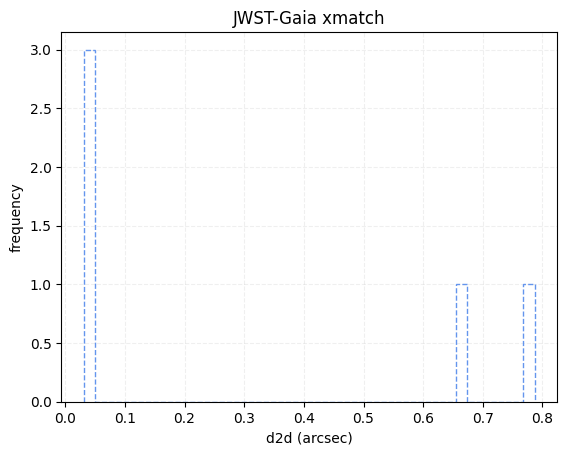

In [156]:
_, dmdf, jhs, gas = calc_dispersion(tb_gaia, align_image.replace('_i2d.fits', '.phot.txt'), phot_image = align_image, plot = True, inspect_large_offset=True)

In [124]:
dmdf

,idx_1,idx_2,d2d
21161,21161,0,0.403542
32105,32105,2,0.017400
23330,23330,3,0.033435
995,995,4,0.612261


In [126]:
jhs[21161]

<SkyCoord (ICRS): (ra, dec) in deg
    (182.41075058, 58.82770647)>

In [127]:
gas[0]

<SkyCoord (ICRS): (ra, dec) in deg
    (182.41096622, 58.82771678)>

In [165]:
with fits.open(align_image.replace('i2d.fits', 'jhat_i2d.fits'), mode='update') as filehandle:
    filehandle[1].header['CRPIX1'] -= 0
    filehandle[1].header['CRPIX2'] -= 0

In [417]:
align_image = glob.glob('jwstred_temp_gaia/f322w2_jhat_i2d.fits')[0]                        

0 jwstred_temp_gaia/jhat_corr_phot.txt


2025-05-20 19:20:38,279 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-05-20 19:20:38,422 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-05-20 19:20:38,427 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-05-20 19:20:38,427 - stpipe - INFO - Instrument: NIRCAM
2025-05-20 19:20:38,427 - stpipe - INFO - Detector: NRCBLONG
2025-05-20 19:20:38,428 - stpipe - INFO - Filter: F322W2
2025-05-20 19:20:38,428 - stpipe - INFO - Pupil: CLEAR
2025-05-20 19:20:38,428 - stpipe - INFO - Subarray: FULL


dmag 0.2172
aper_sum_2.5px annulus_median_2.5px aper_bkg_2.5px ...   x_idl      y_idl   
-------------- -------------------- -------------- ... ---------- ----------
      2.099544             0.102819       1.945234 ... -42.691658 -64.839411
       3.16874             0.157548       2.980662 ... -16.226618 -64.721122
      3.047516             0.133939       2.533989 ... -14.243225 -64.685383
        2.7681             0.106391        2.01282 ... -25.706132 -64.601482
      2.083857             0.102885        1.94648 ... -40.192614 -64.543664
      1.979183             0.101859       1.927074 ... -29.685889 -64.538112
      2.507505             0.126974       2.402235 ... -16.827707 -64.523327
      2.188487             0.102917       1.947082 ... -58.538391 -64.487169
      3.372887             0.165468       3.130486 ... -14.859212 -64.558921
      2.566358             0.112673       2.131662 ... -13.053664 -64.431045
           ...                  ...            ... ...        ..

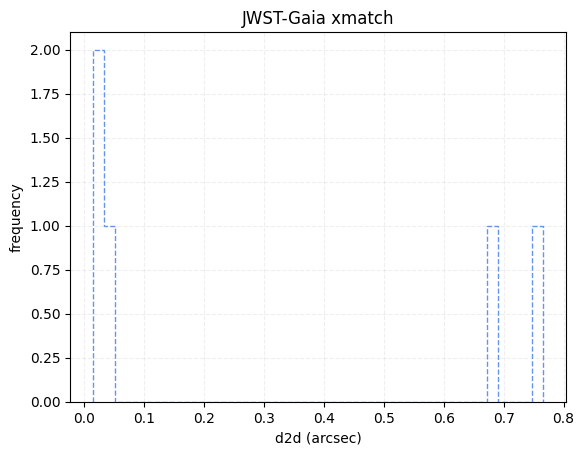

In [418]:
# p1, p2 = 2117.8251562819482, 2108.46467831571
p1, p2 = 1040.6807919816924, 1026.3011916143707
phot_img = glob.glob(align_image.replace('i2d.fits', 'jhat_i2d.fits'))[0]
with fits.open(phot_img, mode='update') as filehandle:
    filehandle[1].header['CRPIX1'] = p1+0.24
    filehandle[1].header['CRPIX2'] = p2-0.30

jwst_phot = jwst_photclass()
phot_img = glob.glob(align_image.replace('i2d.fits', 'jhat_i2d.fits'))[0]
jwst_phot.run_phot(imagename=phot_img,
                   photfilename='jwstred_temp_gaia/jhat_corr_phot.txt',
                   overwrite=True,
                   ee_radius=70,
#                    use_dq=True,
                   SNR_min = 5,
                   find_stars_threshold = 5)
# ref_catname = ref_image.replace('.fits','.phot.txt') # the default
refcat = Table.read('jwstred_temp_gaia/jhat_corr_phot.txt',format='ascii')
print(refcat)

_, dmdf, jhs, gas = calc_dispersion(tb_gaia, 'jwstred_temp_gaia/jhat_corr_phot.txt', 
                phot_image = phot_img,
                dist_limit = 1.0, plot = True, inspect_large_offset=True)

In [419]:
dmdf

,idx_1,idx_2,d2d
9868,9868,0,0.684748
10296,10296,1,0.032244
13004,13004,2,0.046167
10166,10166,3,0.013611
1623,1623,4,0.766468


In [306]:
dmdf

,idx_1,idx_2,d2d
21161,21161,0,0.403542
32105,32105,2,0.017400
23330,23330,3,0.033435
995,995,4,0.612261


In [308]:
dmdf

,idx_1,idx_2,d2d
21161,21161,0,0.404238
32105,32105,2,0.015458
23330,23330,3,0.016746
995,995,4,0.594526


In [314]:
dmdf

,idx_1,idx_2,d2d
9852,9852,0,0.669025
10296,10296,1,0.040215
13004,13004,2,0.049738
10166,10166,3,0.031137
1623,1623,4,0.787008


In [321]:
dmdf

,idx_1,idx_2,d2d
9868,9868,0,0.678088
10296,10296,1,0.026102
13004,13004,2,0.052620
10166,10166,3,0.009460
1623,1623,4,0.764851


In [408]:
#original for f322w2
off, xshift, yshift = [], [], []
pix1, pix2 = 1040.6807919816924, 1026.3011916143707
xsh, ysh = np.linspace(pix1-1.5, pix1+1.5, 51, dtype=np.longdouble), np.linspace(pix2-1.5, pix2+1.5, 51, dtype=np.longdouble)
for xs in tqdm(xsh):
    for ys in ysh:
        phot_img = glob.glob(align_image.replace('i2d.fits', 'jhat_i2d.fits'))[0]
        with fits.open(phot_img, mode='update') as filehandle:
            filehandle[1].header['CRPIX1'] = xs
            filehandle[1].header['CRPIX2'] = ys
            
        _, dmdf, jhs, gas = calc_dispersion(tb_gaia, 'jwstred_temp_gaia/jhat_corr_phot.txt', 
                        phot_image = phot_img,
                        dist_limit = 1.0, plot = False, inspect_large_offset=False)
        off.append(dmdf.iloc[[1, 2, 3]]['d2d'].values)
        xshift.append(xs)
        yshift.append(ys)

100%|██████████████████████████████████████████████████████████████████| 51/51 [01:13<00:00,  1.45s/it]


In [407]:
#original for f150w2
off, xshift, yshift = [], [], []
pix1, pix2 = 2117.8251562819482, 2108.46467831571
xsh, ysh = np.linspace(pix1-2, pix1+2, 71, dtype=np.longdouble), np.linspace(pix2-2, pix2+2, 71, dtype=np.longdouble)
for xs in tqdm(xsh):
    for ys in ysh:
        phot_img = glob.glob(align_image.replace('i2d.fits', 'jhat_i2d.fits'))[0]
        with fits.open(phot_img, mode='update') as filehandle:
            filehandle[1].header['CRPIX1'] = xs
            filehandle[1].header['CRPIX2'] = ys
            
        _, dmdf, jhs, gas = calc_dispersion(tb_gaia, 'jwstred_temp_gaia/jhat_corr_phot.txt', 
                        phot_image = phot_img,
                        dist_limit = 1.0, plot = False, inspect_large_offset=False)
        off.append(dmdf.iloc[[1, 2]]['d2d'].values)
        xshift.append(xs)
        yshift.append(ys)

100%|██████████████████████████████████████████████████████████████████| 71/71 [02:18<00:00,  1.96s/it]


In [99]:
hdr = fits.open(align_image)['SCI'].header
w = wcs.WCS(hdr)
jhat_df = pd.read_csv(photfile, sep = '\s+')
jh_radec = w.all_pix2world(jhat_df['x'], jhat_df['y'], 0)
jh_ra, jh_dec = np.array(jh_radec[0])*u.degree, np.array(jh_radec[1])*u.degree
jh_skycoord = SkyCoord(ra = jh_ra, dec = jh_dec)

In [100]:
jh_skycoord

<SkyCoord (ICRS): (ra, dec) in deg
    [(182.44750061, 58.84987408), (182.45252333, 58.84913875),
     (182.43023126, 58.83919175), (182.41130232, 58.82836571),
     (182.42634879, 58.85631135)]>

In [101]:
align_image

'frb20250316a/coadd_0_0_f150w2_jhat_i2d.fits'

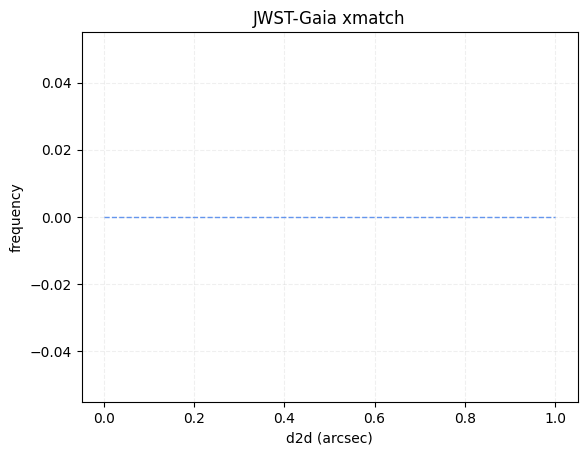

In [102]:
pix1, pix2 = 2117.8251562819482, 2108.46467831571
# phot_img = align_image #glob.glob(align_image.replace('i2d.fits', 'jhat_i2d.fits'))[0]
with fits.open(align_image, mode='update') as filehandle:
    filehandle[1].header['CRPIX1'] = pix1
    filehandle[1].header['CRPIX2'] = pix2

tb_gaia = pd.read_csv('frb20250316a/gaia_locs.txt', sep = '\s+')
photfile = 'frb20250316a/dolphot_locs.txt'
_, dmdf, jhs, gas = calc_dispersion(tb_gaia, photfile, dist_limit = 1,
                                    phot_image = align_image, plot = True)

In [103]:
#new for f150w2
off, xshift, yshift = [], [], []
pix1, pix2 = 2117.8251562819482, 2108.46467831571
xsh, ysh = np.linspace(pix1-4, pix1+4, 11, dtype=np.longdouble), np.linspace(pix2-4, pix2+4, 11, dtype=np.longdouble)
for xs in tqdm(xsh):
    for ys in ysh:
        phot_img = align_image #glob.glob(align_image.replace('i2d.fits', 'jhat_i2d.fits'))[0]
        with fits.open(phot_img, mode='update') as filehandle:
            filehandle[1].header['CRPIX1'] = xs
            filehandle[1].header['CRPIX2'] = ys
            
        _, dmdf, jhs, gas = calc_dispersion(tb_gaia, photfile, 
                        phot_image = phot_img,
                        dist_limit = 10.0, plot = False, inspect_large_offset=False)
        off.append(dmdf['d2d'].values)
        xshift.append(xs)
        yshift.append(ys)

100%|██████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.94it/s]


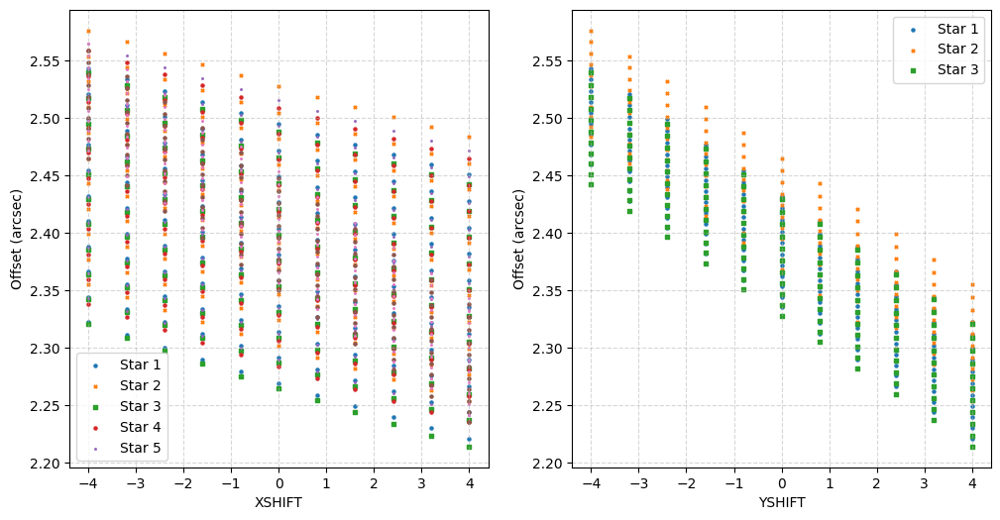

In [78]:
fig, ax = plt.subplots(1, 2, figsize = (12, 6))

ax[0].scatter(np.array(xshift) - pix1, np.array(off)[:, 0], s = 5, label = 'Star 1')
ax[0].scatter(np.array(xshift) - pix1, np.array(off)[:, 1], s = 5, marker = 'x', label = 'Star 2')
ax[0].scatter(np.array(xshift) - pix1, np.array(off)[:, 2], s = 5, marker = 's', label = 'Star 3')
ax[0].scatter(np.array(xshift) - pix1, np.array(off)[:, 3], s = 5, marker = 'o', label = 'Star 4')
ax[0].scatter(np.array(xshift) - pix1, np.array(off)[:, 4], s = 5, marker = '.', label = 'Star 5')
ax[0].legend()
ax[0].grid(linestyle = '--', alpha = 0.5)
ax[0].set_xlabel('XSHIFT')
ax[0].set_ylabel('Offset (arcsec)')

ax[1].scatter(np.array(yshift) - pix2, np.array(off)[:, 0], s = 5, label = 'Star 1')
ax[1].scatter(np.array(yshift) - pix2, np.array(off)[:, 1], s = 5, marker = 'x', label = 'Star 2')
ax[1].scatter(np.array(yshift) - pix2, np.array(off)[:, 2], s = 5, marker = 's', label = 'Star 3')
ax[0].scatter(np.array(yshift) - pix2, np.array(off)[:, 3], s = 5, marker = 'o', label = 'Star 4')
ax[0].scatter(np.array(yshift) - pix2, np.array(off)[:, 4], s = 5, marker = '.', label = 'Star 5')
ax[1].legend()
ax[1].grid(linestyle = '--', alpha = 0.5)
ax[1].set_xlabel('YSHIFT')
ax[1].set_ylabel('Offset (arcsec)')
plt.show()

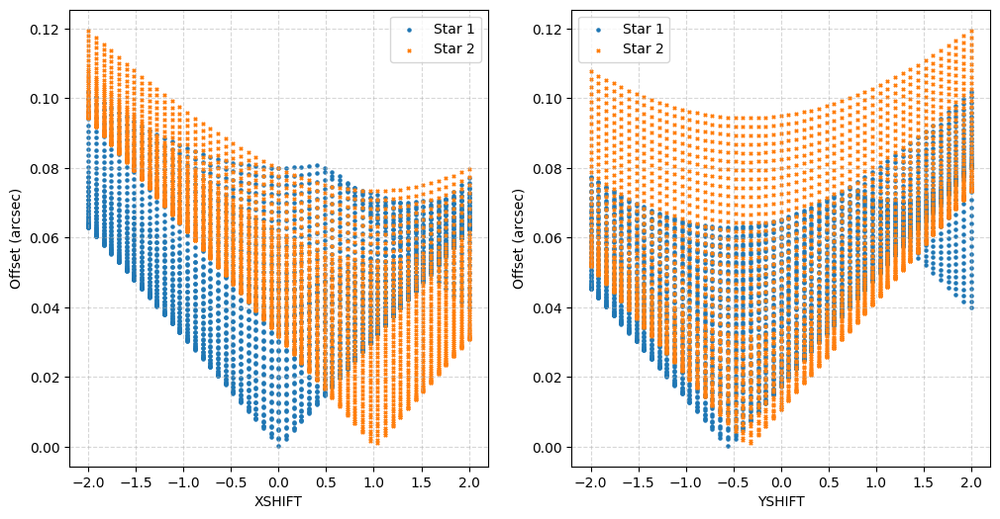

In [302]:
fig, ax = plt.subplots(1, 2, figsize = (12, 6))

ax[0].scatter(np.array(xshift) - pix1, np.array(off)[:, 0], s = 5, label = 'Star 1')
ax[0].scatter(np.array(xshift) - pix1, np.array(off)[:, 1], s = 5, marker = 'x', label = 'Star 2')
ax[0].legend()
ax[0].grid(linestyle = '--', alpha = 0.5)
ax[0].set_xlabel('XSHIFT')
ax[0].set_ylabel('Offset (arcsec)')

ax[1].scatter(np.array(yshift) - pix2, np.array(off)[:, 0], s = 5, label = 'Star 1')
ax[1].scatter(np.array(yshift) - pix2, np.array(off)[:, 1], s = 5, marker = 'x', label = 'Star 2')
ax[1].legend()
ax[1].grid(linestyle = '--', alpha = 0.5)
ax[1].set_xlabel('YSHIFT')
ax[1].set_ylabel('Offset (arcsec)')
plt.show()

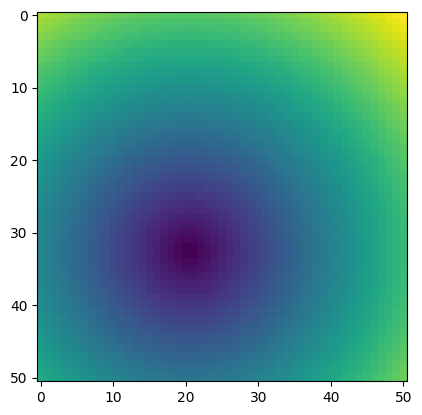

In [412]:
plt.imshow(np.array(off)[:,2].reshape(51,51))
plt.show()

In [414]:
rms_off = np.sqrt((np.array(off)[:,1]**2 + np.array(off)[:,0]**2 + np.array(off)[:,2]**2) / 3)

In [415]:
np.argmin(np.array(rms_off)), np.min(np.array(rms_off))

(1499, 0.033448224224104026)

In [416]:
xshift[1499] - pix1, yshift[1499] - pix2

(0.2400000000000091, -0.2999999999999545)

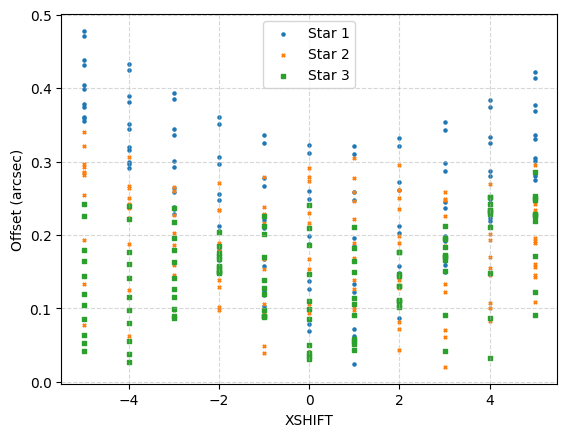

In [225]:
plt.scatter(np.array(xshift) - pix1, np.array(off)[:, 0], s = 5, label = 'Star 1')
plt.scatter(np.array(xshift) - pix1, np.array(off)[:, 1], s = 5, marker = 'x', label = 'Star 2')
plt.scatter(np.array(xshift) - pix1, np.array(off)[:, 2], s = 5, marker = 's', label = 'Star 3')
plt.legend()
plt.grid(linestyle = '--', alpha = 0.5)
plt.xlabel('XSHIFT')
plt.ylabel('Offset (arcsec)')
plt.show()

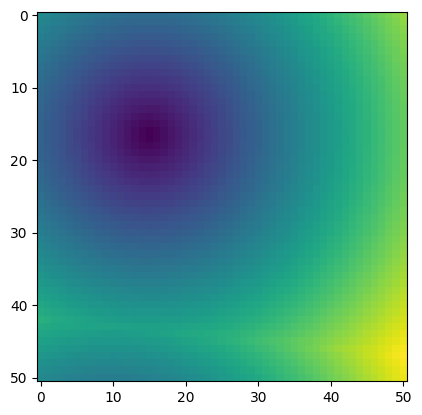

In [335]:
plt.imshow(np.array(off)[:,1].reshape(51,51))
plt.show()

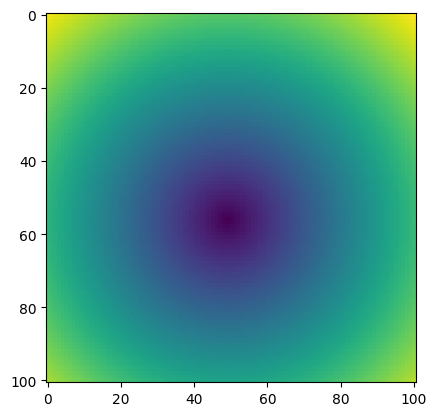

In [273]:
plt.imshow(np.array(off)[:,0].reshape(101,101))
plt.show()

In [317]:
tb_gaia

solution_id,DESIGNATION,SOURCE_ID,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,pm,pmra,pmra_error,pmdec,pmdec_error,ra_dec_corr,ra_parallax_corr,ra_pmra_corr,ra_pmdec_corr,dec_parallax_corr,dec_pmra_corr,dec_pmdec_corr,parallax_pmra_corr,parallax_pmdec_corr,pmra_pmdec_corr,astrometric_n_obs_al,astrometric_n_obs_ac,astrometric_n_good_obs_al,astrometric_n_bad_obs_al,astrometric_gof_al,astrometric_chi2_al,astrometric_excess_noise,astrometric_excess_noise_sig,astrometric_params_solved,astrometric_primary_flag,nu_eff_used_in_astrometry,pseudocolour,pseudocolour_error,ra_pseudocolour_corr,dec_pseudocolour_corr,parallax_pseudocolour_corr,pmra_pseudocolour_corr,pmdec_pseudocolour_corr,astrometric_matched_transits,visibility_periods_used,astrometric_sigma5d_max,matched_transits,new_matched_transits,matched_transits_removed,ipd_gof_harmonic_amplitude,ipd_gof_harmonic_phase,ipd_frac_multi_peak,ipd_frac_odd_win,ruwe,scan_direction_strength_k1,scan_direction_strength_k2,scan_direction_strength_k3,scan_direction_strength_k4,scan_direction_mean_k1,scan_direction_mean_k2,scan_direction_mean_k3,scan_direction_mean_k4,duplicated_source,phot_g_n_obs,phot_g_mean_flux,phot_g_mean_flux_error,phot_g_mean_flux_over_error,phot_g_mean_mag,phot_bp_n_obs,phot_bp_mean_flux,phot_bp_mean_flux_error,phot_bp_mean_flux_over_error,phot_bp_mean_mag,phot_rp_n_obs,phot_rp_mean_flux,phot_rp_mean_flux_error,phot_rp_mean_flux_over_error,phot_rp_mean_mag,phot_bp_rp_excess_factor,phot_bp_n_contaminated_transits,phot_bp_n_blended_transits,phot_rp_n_contaminated_transits,phot_rp_n_blended_transits,phot_proc_mode,bp_rp,bp_g,g_rp,radial_velocity,radial_velocity_error,rv_method_used,rv_nb_transits,rv_nb_deblended_transits,rv_visibility_periods_used,rv_expected_sig_to_noise,rv_renormalised_gof,rv_chisq_pvalue,rv_time_duration,rv_amplitude_robust,rv_template_teff,rv_template_logg,rv_template_fe_h,rv_atm_param_origin,vbroad,vbroad_error,vbroad_nb_transits,grvs_mag,grvs_mag_error,grvs_mag_nb_transits,rvs_spec_sig_to_noise,phot_variable_flag,l,b,ecl_lon,ecl_lat,in_qso_candidates,in_galaxy_candidates,non_single_star,has_xp_continuous,has_xp_sampled,has_rvs,has_epoch_photometry,has_epoch_rv,has_mcmc_gspphot,has_mcmc_msc,in_andromeda_survey,classprob_dsc_combmod_quasar,classprob_dsc_combmod_galaxy,classprob_dsc_combmod_star,teff_gspphot,teff_gspphot_lower,teff_gspphot_upper,logg_gspphot,logg_gspphot_lower,logg_gspphot_upper,mh_gspphot,mh_gspphot_lower,mh_gspphot_upper,distance_gspphot,distance_gspphot_lower,distance_gspphot_upper,azero_gspphot,azero_gspphot_lower,azero_gspphot_upper,ag_gspphot,ag_gspphot_lower,ag_gspphot_upper,ebpminrp_gspphot,ebpminrp_gspphot_lower,ebpminrp_gspphot_upper,libname_gspphot,pm/pmerr
,,,,yr,deg,mas,deg,mas,mas,mas,,mas / yr,mas / yr,mas / yr,mas / yr,mas / yr,,,,,,,,,,,,,,,,,mas,,,,1 / um,1 / um,1 / um,,,,,,,,mas,,,,,deg,,,,,,,,deg,deg,deg,deg,,,electron / s,electron / s,,mag,,electron / s,electron / s,,mag,,electron / s,electron / s,,mag,,,,,,,mag,mag,mag,km / s,km / s,,,,,,,,d,km / s,K,log(cm.s**-2),dex,,km / s,km / s,,mag,mag,,,,deg,deg,deg,deg,,,,,,,,,,,,,,,K,K,K,log(cm.s**-2),log(cm.s**-2),log(cm.s**-2),dex,dex,dex,pc,pc,pc,mag,mag,mag,mag,mag,mag,mag,mag,mag,,
int64,object,int64,int64,float64,float64,float32,float64,float32,float64,float32,float32,float32,float64,float32,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int16,int16,int16,int16,float32,float32,float32,float32,int16,bool,float32,float32,float32,float32,float32,float32,float32,float32,int16,int16,float32,int16,int16,int16,float32,float32,int16,int16,float32,float32,float32,float32,float32,float32,float32,float32,float32,bool,int16,float64,float32,float32,float32,int16,float64,float32,float32,float32,int16,float64,float32,float32,float32,float32,int16,int16,int16,int16,int16,float32,float32,float32,float32,float32,int16,int16,int16,int16,float32,float32,float32,float32,float32,float32,float3

In [282]:
gas[1]

<SkyCoord (ICRS): (ra, dec) in deg
    (182.4298503, 58.83855081)>

In [239]:
np.min(np.array(off)[:, 2])

0.026675243590419312

<SkyCoord (ICRS): (ra, dec) in deg
    [(182.41096622, 58.82771678), (182.4298503 , 58.83855081),
     (182.45217581, 58.84850373), (182.44712871, 58.84923699),
     (182.42600107, 58.85568245)]>
10030    0.669025
10479    0.040215
13221    0.049738
10348    0.031137
1624     0.787008
Name: d2d, dtype: float64
0.2144074629933835 0.0024739030100868332 0.26613220871094867


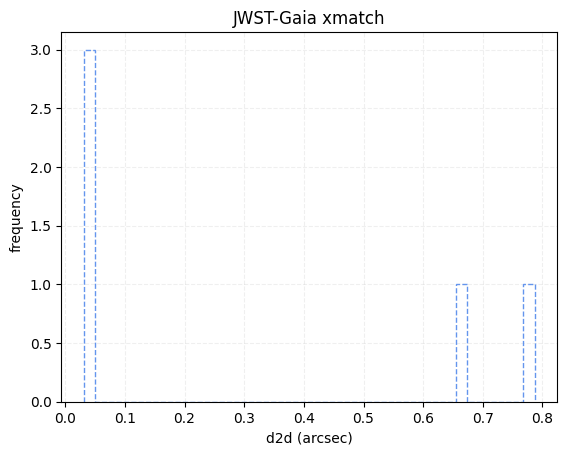

(0.5158800332547758,
        idx_1  idx_2       d2d
 10030  10030      0  0.669025
 10479  10479      1  0.040215
 13221  13221      2  0.049738
 10348  10348      3  0.031137
 1624    1624      4  0.787008,
 <SkyCoord (ICRS): (ra, dec) in deg
     [(182.36754815, 58.85066397), (182.37663487, 58.85617902),
      (182.37732683, 58.85658882), ..., (182.41792228, 58.82589627),
      (182.45669612, 58.84947386), (182.45749483, 58.8499627 )]>,
 <SkyCoord (ICRS): (ra, dec) in deg
     [(182.41096622, 58.82771678), (182.4298503 , 58.83855081),
      (182.45217581, 58.84850373), (182.44712871, 58.84923699),
      (182.42600107, 58.85568245)]>)

In [169]:
calc_dispersion(tb_gaia, 'jwstred_temp_gaia/jhat_corr_phot.txt', 
                phot_image = phot_img,
                dist_limit = 1.0, plot = True, inspect_large_offset=True)

#### Breakup star mask

In [18]:
jwst_im = fits.open(glob.glob('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits')[0])

In [19]:
jwst_im.info()

Filename: jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     346   ()      
  1  SCI           1 ImageHDU       156   (2048, 2048)   float32   
  2  ERR           1 ImageHDU        10   (2048, 2048)   float32   
  3  DQ            1 ImageHDU        11   (2048, 2048)   int32 (rescales to uint32)   
  4  AREA          1 ImageHDU         9   (2048, 2048)   float32   
  5  VAR_POISSON    1 ImageHDU         9   (2048, 2048)   float32   
  6  VAR_RNOISE    1 ImageHDU         9   (2048, 2048)   float32   
  7  VAR_FLAT      1 ImageHDU         9   (2048, 2048)   float32   
  8  ASDF          1 BinTableHDU     11   1R x 1C   [26608B]   


In [20]:
dq_mask = deepcopy(jwst_im['DQ'].data)

In [21]:
flag_sat = np.array(dq_mask != 1) & np.array(dq_mask != 2) & np.array(dq_mask != 3)

In [22]:
np.shape(flag_sat), np.shape(dq_mask)

((2048, 2048), (2048, 2048))

In [23]:
flag_sat.sum()

4165548

In [24]:
dq_mask[flag_sat] = 10
dq_mask[~flag_sat] = 1

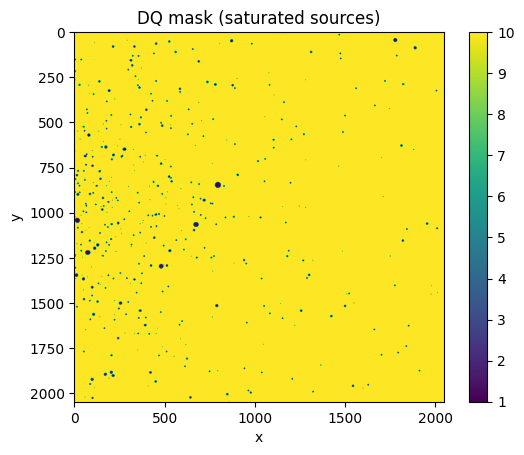

In [26]:
plt.imshow(dq_mask)
plt.colorbar()
plt.xlabel('x')
plt.ylabel('y')
plt.title('DQ mask (saturated sources)')
plt.show()
# plt.savefig('dq_mask.png', bbox_inches = 'tight', dpi = 500)

In [27]:
np.unique(dq_mask)

array([ 1, 10], dtype=uint32)

In [36]:
def expand_mask(mask, size = 40, mask_shape = 'square'):
    """
    Expand the mask by a given size using binary dilation.

    Parameters
    ----------
    mask : numpy.ndarray
        The mask to be expanded.
    size : int
        The size of the structuring element used for binary dilation.
    mask_shape : str
        The shape of the structuring element. Can be 'square' or 'circle'.

    Returns
    -------
    mask_exp : numpy.ndarray
        The expanded mask.
    """
    # Create a binary mask where pixels with flag 1 are set to True
    binary_mask = (mask == 1)
    
    # Define a structuring element
    if mask_shape == 'square':
        structuring_element = np.ones((size, size), dtype=bool)
    if mask_shape == 'circle':
        y, x = np.ogrid[:size, :size]
        center = (size-1)/2
        structuring_element = (x - center)**2 + (y - center)**2 <= center**2
    
    expanded_mask = binary_dilation(binary_mask, structure=structuring_element)
    
    # Convert the expanded binary mask back to the original mask format
    mask_exp = np.where(expanded_mask, 1, mask)
    
    return mask_exp

In [41]:
expmask = expand_mask(dq_mask, mask_shape = 'circle')
expmask[expmask == 1] = False
expmask[expmask == 10] = True
# expmask[expmask == 1] = True

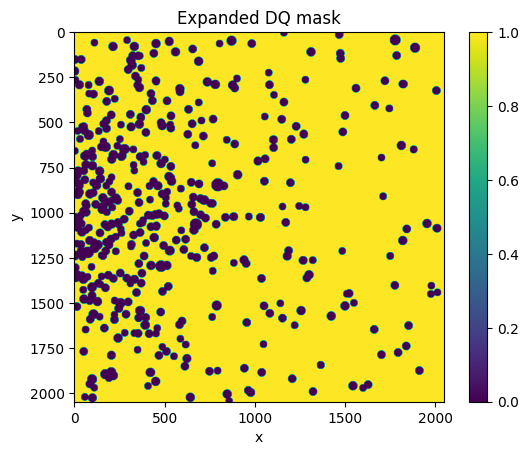

In [42]:
# expmask[expmask > 10] = 10
plt.imshow(expmask)
plt.colorbar()
plt.xlabel('x')
plt.ylabel('y')
plt.title('Expanded DQ mask')
plt.show()
# plt.savefig('exp_dq_mask.png', bbox_inches = 'tight', dpi = 500)

In [43]:
expmask

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]], dtype=uint32)

In [17]:
plt.imshow(jwst_im['SCI'].data, vmin = np.nanmedian(jwst_im['SCI'].data) - 1*np.nanstd(jwst_im['SCI'].data),
                                vmax = np.nanmedian(jwst_im['SCI'].data) + 1*np.nanstd(jwst_im['SCI'].data))
plt.colorbar()

In [307]:
# masked_im = np.where(dq_mask, jwst_im['SCI'].data, 3)
masked_im = np.where(expmask, jwst_im['SCI'].data, np.nan)

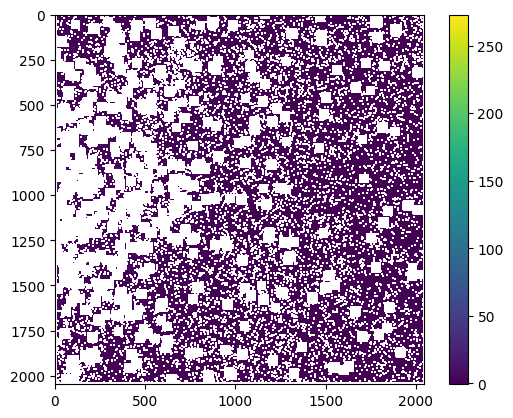

In [308]:
plt.imshow(masked_im)
plt.colorbar()

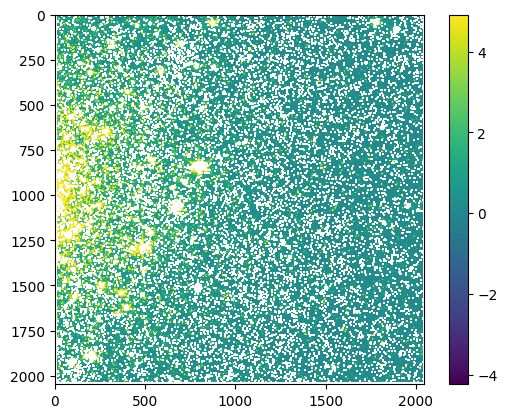

In [38]:
plt.imshow(masked_im, vmin = np.nanmedian(masked_im) - 1*np.nanstd(masked_im),
                      vmax = np.nanmedian(masked_im) + 1*np.nanstd(masked_im))
plt.colorbar()

In [309]:
jwst_im['SCI'].data = masked_im

In [44]:
# bin_dq_hdu = 
data, hdr = fits.getdata('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits', ext=3, header=True)
# bin_dq_data = np.where(expmask, jwst_im['DQ'].data, 3)
hdr['extname'] = 'BIN_DQ'
image_hdu = fits.ImageHDU(data=expmask, name="BIN_DQ", header = hdr)
jwst_im.insert(8, image_hdu)
# bin_dq_hdu

In [45]:
jwst_im.info()

Filename: jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     346   ()      
  1  SCI           1 ImageHDU       156   (2048, 2048)   float32   
  2  ERR           1 ImageHDU        10   (2048, 2048)   float32   
  3  DQ            1 ImageHDU        11   (2048, 2048)   uint32   
  4  AREA          1 ImageHDU         9   (2048, 2048)   float32   
  5  VAR_POISSON    1 ImageHDU         9   (2048, 2048)   float32   
  6  VAR_RNOISE    1 ImageHDU         9   (2048, 2048)   float32   
  7  VAR_FLAT      1 ImageHDU         9   (2048, 2048)   float32   
  8  BIN_DQ        1 ImageHDU        11   (2048, 2048)   uint32   
  9  ASDF          1 BinTableHDU     11   1R x 1C   [26608B]   


In [46]:
jwst_im.writeto('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal_masked.fits', overwrite = True)

In [48]:
def add_bin_dq(filename):
    im = fits.open(filename)
    dq_mask = deepcopy(im['DQ'].data)

    flag_sat = np.array(dq_mask != 1) & np.array(dq_mask != 2) & np.array(dq_mask != 3)
    dq_mask[flag_sat] = 10
    dq_mask[~flag_sat] = 1

    expmask = expand_mask(dq_mask, mask_shape = 'circle')
    expmask[expmask == 10] = False
    expmask[expmask == 1] = True

    data, hdr = fits.getdata(filename, ext=3, header=True)
    hdr['extname'] = 'BIN_DQ'
    image_hdu = fits.ImageHDU(data=expmask, name="BIN_DQ", header = hdr)
    im.insert(8, image_hdu)
    im.writeto(filename.replace('.fits', '_masked.fits'), overwrite = True)


In [49]:
add_bin_dq('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits')

In [51]:
im = fits.open('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal_masked.fits')

In [ ]:
def prepare_image(data_original, imhdr, area=None, dq=None, 
                  DNunits=False, dq_ignore_bits = 4):
    # dq_ignore_bits contains the bits in the dq which are still ok, so they
    # should be ignored.
    # 2 = Pixel saturated during integration
    # 4 = Jump detected during integration

    if area is not None:

        if self.verbose: print('Applying Pixel Area Map')

        data_pam = data_original * area

    else:

        data_pam = data_original

    if DNunits:
        if imhdr["BUNIT"]!='MJy/sr':
            raise RuntimeError(f'imhdr["BUNIT"]={imhdr["BUNIT"]} is not MJy/sr!')
        if self.verbose: print(f'Converting units from {imhdr["BUNIT"]} to DN/s')
        data = data_pam / imhdr['PHOTMJSR']
    else:
        data = data_pam


    if dq is not None:
        # dq_ignore_bits are removed from the mask!
        #fits.writeto('TEST_dq_delme.fits',dq,overwrite=True,output_verify='ignore')
        mask = np.bitwise_and(dq,np.full(data_original.shape, ~dq_ignore_bits, dtype='int'))
    else:
        mask = np.zeros(data_original.shape, dtype='int')

    # hijack a few bits for our purposes...
    mask[np.isnan(data)==True] = 8
    mask[np.isfinite(data)==False] = 8
    mask[np.where(data==0)] = 16

    #fits.writeto('TEST_mask_delme.fits',mask,overwrite=True,output_verify='ignore')

    data[mask>0] = np.nan

    return data,mask,DNunits

In [19]:
test_im = fits.open('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits')

In [20]:
test_im.info()

Filename: jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     346   ()      
  1  SCI           1 ImageHDU       156   (2048, 2048)   float32   
  2  ERR           1 ImageHDU        10   (2048, 2048)   float32   
  3  DQ            1 ImageHDU        11   (2048, 2048)   int32 (rescales to uint32)   
  4  AREA          1 ImageHDU         9   (2048, 2048)   float32   
  5  VAR_POISSON    1 ImageHDU         9   (2048, 2048)   float32   
  6  VAR_RNOISE    1 ImageHDU         9   (2048, 2048)   float32   
  7  VAR_FLAT      1 ImageHDU         9   (2048, 2048)   float32   
  8  BIN_DQ        1 ImageHDU        11   (2048, 2048)   int32 (rescales to uint32)   
  9  ASDF          1 BinTableHDU     11   1R x 1C   [26608B]   


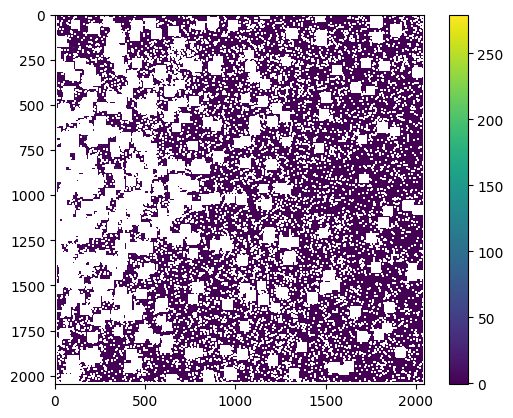

In [24]:
plt.imshow(data)
plt.colorbar()

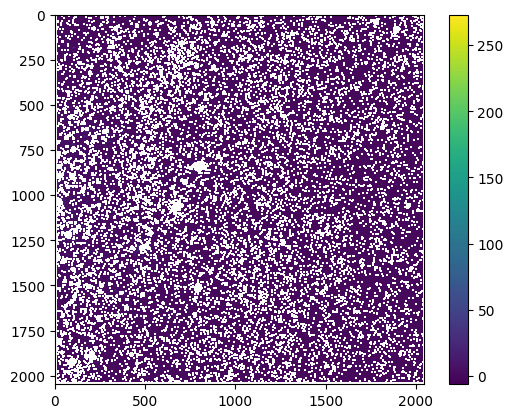

In [15]:
plt.imshow(test_im['SCI'].data)
plt.colorbar()

In [275]:
dq = test_im['BIN_DQ'].data
og_data = np.array(test_im['SCI'].data)
dq_ignore_bits = 4
mask = np.bitwise_and(dq, np.full(og_data.shape, ~dq_ignore_bits, dtype = 'int'))

In [247]:
dq

array([[2151153665, 2151153665, 2151153665, ..., 2151153665, 2151153665,
        2151153665],
       [2151153665, 2151153665, 2151153665, ..., 2151153665, 2151153665,
        2151153665],
       [2151153665, 2151153665, 2151153665, ..., 2151153665, 2151153665,
        2151153665],
       ...,
       [2155347969, 2151153665, 2151153665, ..., 2151153665, 2151153665,
        2151153665],
       [2151153665, 2151153665, 2151153665, ..., 2151153665, 2151153665,
        2151153665],
       [2151153665, 2151153665, 2151153665, ..., 2151153665, 2151153665,
        2151153665]], dtype=uint32)

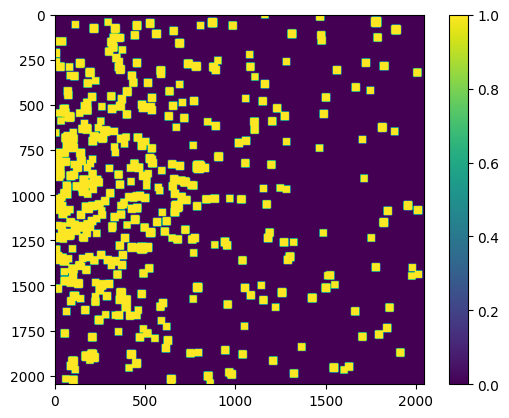

In [276]:
# mask = np.array(mask, dtype = 'float32')
# mask[mask>0] = np.nan
plt.imshow(mask)
plt.colorbar()

In [148]:
np.bitwise_and(np.array([1]), np.array([5]))

array([1])

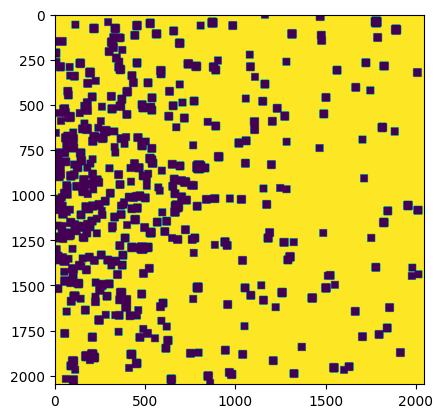

In [142]:
plt.imshow(dq)

## Guess offset

In [5]:
%reload_ext autoreload
%autoreload 2
    
import jwst123
import glob, os
import numpy as np
import pandas as pd
from astropy.io import fits
from astropy import wcs
from copy import copy
from tqdm import tqdm
import astropy.units as u
from astropy.coordinates import SkyCoord
from astropy.stats import sigma_clipped_stats
import matplotlib.pyplot as plt

from nbutils import xmatch_common

JWST version: 1.14.0


In [63]:
def calc_guess_dispersion(ref_table, phot_file, w, dist_limit = 1, 
                          plot = False, inspect_large_offset = False):
    jhat_df = pd.read_csv(phot_file, sep = '\s+')
    
    jh_radec = w.all_pix2world(jhat_df['x'], jhat_df['y'], 0)
    jh_ra, jh_dec = np.array(jh_radec[0])*u.degree, np.array(jh_radec[1])*u.degree
    jh_skycoord = SkyCoord(ra = jh_ra, dec = jh_dec)

    ref_ra, ref_dec = np.array(ref_table['ra'])*u.degree, np.array(ref_table['dec'])*u.degree
    ref_skycoord = SkyCoord(ra = ref_ra, dec = ref_dec)
    
    dist_matched_df = xmatch_common(jh_skycoord, ref_skycoord, dist_limit=dist_limit)

    clip_mean, clip_median, clip_std = sigma_clipped_stats(dist_matched_df['d2d']**2)#, sigma_lower = 3, sigma_upper = 1)
    dispersion = np.sqrt(clip_mean)
    
    if plot:
        plt.figure(figsize = (5, 4), dpi = 300)
        plt.hist(dist_matched_df['d2d'], bins = np.linspace(0.001, 0.07, 40), histtype = 'step', 
                 linestyle = '--', color = 'cornflowerblue')
        plt.xlabel('d2d (arcsec)')
        plt.ylabel('frequency')
        plt.text(0.04, 0.6, '''RMS offset: {:.3f}"'''.format(dispersion))
        plt.title('JWST-Gaia xmatch')
        plt.grid(alpha = 0.2, linestyle = '--')
        plt.show()
        
    return dispersion, dist_matched_df, jh_skycoord, ref_skycoord

In [6]:
mosaic_name = glob.glob('jwstred_temp_gaia/f300m_jhat_6_i2d.fits')[0]
photfilename = jwst123.fix_phot(mosaic_name)
ref_table = pd.read_csv(photfilename, sep='\s+')
outdir = 'jwstred_temp_gaia'

0 jwstred_temp_gaia/f300m_jhat_6_i2d.phot.txt


2025-07-25 09:47:33,761 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-07-25 09:47:33,978 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-07-25 09:47:33,983 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-07-25 09:47:33,983 - stpipe - INFO - Instrument: NIRCAM
2025-07-25 09:47:33,983 - stpipe - INFO - Detector: MULTIPLE
2025-07-25 09:47:33,984 - stpipe - INFO - Filter: F300M
2025-07-25 09:47:33,984 - stpipe - INFO - Pupil: CLEAR
2025-07-25 09:47:33,984 - stpipe - INFO - Subarray: FULL


dmag 0.36200000000000004


In [3]:
align_image = glob.glob('jwstred_temp_gaia/f300m_15_i2d.fits')[0]
align_photfile = jwst123.fix_phot(align_image)

0 jwstred_temp_gaia/f300m_15_i2d.phot.txt


2025-07-25 09:14:00,683 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-07-25 09:14:00,843 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-07-25 09:14:00,847 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-07-25 09:14:00,847 - stpipe - INFO - Instrument: NIRCAM
2025-07-25 09:14:00,848 - stpipe - INFO - Detector: MULTIPLE
2025-07-25 09:14:00,848 - stpipe - INFO - Filter: F300M
2025-07-25 09:14:00,848 - stpipe - INFO - Pupil: CLEAR
2025-07-25 09:14:00,848 - stpipe - INFO - Subarray: FULL


dmag 0.36200000000000004


In [58]:
sci_hdr = copy(wcs.WCS(fits.getheader(align_image, ext=1)))
crpix1, crpix2 = sci_hdr.wcs.crpix

In [73]:
#shifts
off, xshift, yshift = [], [], []
xsh, ysh = np.linspace(-50, 50, 26), np.linspace(-50, 50, 26)
for xs in tqdm(xsh):
    for ys in ysh:
        in_wcs = copy(sci_hdr)
        in_wcs.wcs.crpix = [crpix1+xs, crpix2+ys]
        disp, dmdf, jhs, gas = calc_guess_dispersion(ref_table, align_photfile, in_wcs, dist_limit = 1, 
                                                     plot = False, inspect_large_offset=False)
        off.append(disp)
        xshift.append(xs)
        yshift.append(ys)

100%|████████████████████████████████████████████| 26/26 [01:39<00:00,  3.82s/it]


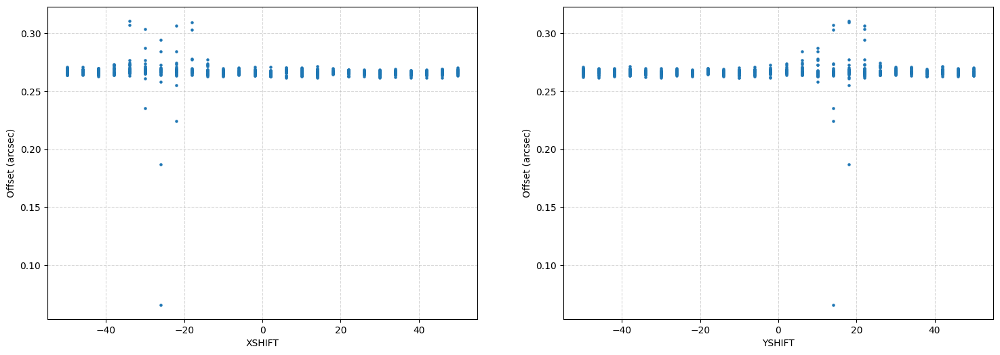

In [76]:
fig, ax = plt.subplots(1, 2, figsize = (18, 6))

ax[0].scatter(np.array(xshift), np.array(off), s = 5)
ax[0].grid(linestyle = '--', alpha = 0.5)
ax[0].set_xlabel('XSHIFT')def fmt(x):
    s = f"{x*100:.1f}"
    if s.endswith("0"):
        s = f"{x*100:.0f}"
    return rf"{s} \%" if plt.rcParams["text.usetex"] else f"{s} %"
ax[0].set_ylabel('Offset (arcsec)')

ax[1].scatter(np.array(yshift), np.array(off), s = 5)
ax[1].grid(linestyle = '--', alpha = 0.5)
ax[1].set_xlabel('YSHIFT')
ax[1].set_ylabel('Offset (arcsec)')
plt.show()

In [77]:
def fmt(x):
    s = f"{x*100:.1f}"
    if s.endswith("0"):
        s = f"{x*100:.0f}"
    return rf"{s} \%" if plt.rcParams["text.usetex"] else f"{s} %"

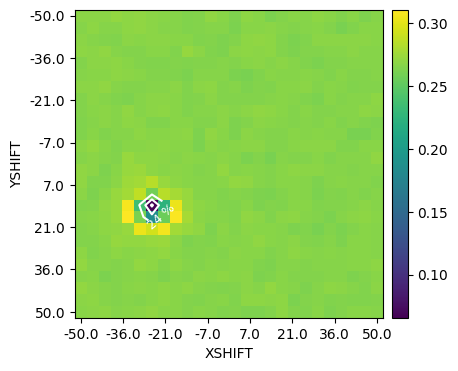

In [101]:
#shifts
fig, ax = plt.subplots(1, 1, figsize = (6,4))
im = ax.imshow(np.array(off).reshape(26,26).T)
cs = ax.contour(np.arange(0, 26, 1), np.arange(0, 26, 1), np.array(off).reshape(26, 26).T, colors='white', levels = 3);
ax.clabel(cs, cs.levels, fmt=fmt, fontsize=9)
fig.colorbar(im, ax=ax, pad = 0.02)
plt.xticks(np.linspace(0, 25, 8), np.round(np.linspace(-50, 50, 8)))
plt.yticks(np.linspace(0, 25, 8), np.round(np.linspace(-50, 50, 8)))
plt.xlabel('XSHIFT')
plt.ylabel('YSHIFT')
plt.show()

In [91]:
xshift[np.argmin(off)], yshift[np.argmin(off)]

(-26.0, 14.0)

JWST version: 1.14.0
JWST version: 1.14.0
Aligning f300m_15_i2d.fits to JWST
telescope set to jwst

### Doing photometry on jwstred_temp_gaia/f300m_15_i2d.fits
True ./jwstred_temp_gaia/f300m_15.phot.txt
photometry catalog filename: ./jwstred_temp_gaia/f300m_15.phot.txt
photcat ./jwstred_temp_gaia/f300m_15.phot.txt already exists, but recreating it since overwrite=True
Instrument: NIRCAM, aperture:NRCA5_FULL
Finding stars --- Detector: MULTIPLE, Filter: F300M
FWHM for the filter F300M: 1.585 px
Background and rms using MMMBackground and MADStdBackgroundRMS: 0.1638125628232956 0.12225337016817571


2025-07-25 10:05:33,828 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.



Number of sources found in the image: 39240
-------------------------------------



2025-07-25 10:05:34,092 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-07-25 10:05:34,097 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-07-25 10:05:34,097 - stpipe - INFO - Instrument: NIRCAM
2025-07-25 10:05:34,097 - stpipe - INFO - Detector: MULTIPLE
2025-07-25 10:05:34,097 - stpipe - INFO - Filter: F300M
2025-07-25 10:05:34,098 - stpipe - INFO - Pupil: CLEAR
2025-07-25 10:05:34,098 - stpipe - INFO - Subarray: FULL


radii:[2.501]pixels radius_sky_in:3.255000114440918 radius_sky_out:5.666999816894531  radius_for_mag:[2.501]
Performing aperture photometry for radius r = 2.500999927520752 px
Time Elapsed: 1.9286061250022613
39224 objects left after removing entries with NaNs in mag or dmag column
dmag 0.2172
SNR_min cut: 39213 objects left after removing entries dmag>0.2172 (SNR<5)
39213 out of 39224 entries remain in photometry table
Saving ./jwstred_temp_gaia/f300m_15.phot.txt
########### !!!!!!!!!!  INITIAL CUT on image photometry cat: starting with 39224 objects
dmag_max =0.1 CUT:
dmag 0.1
39156 left
SHARPNESS =(0.3, 0.95) CUT:
sharpness 0.95
39146 left
roundness1=(-0.7, 0.7) CUT:
roundness1 0.7
36657 left
objmag_lim=(15, 25) CUT:
mag 25
36352 left
Nbright=800 CUT:
800 left
800 of image photometry objects pass initial cuts #1, 38424 cut
Getting jwstred_temp_gaia/f300m_jhat_6_i2d.corr.phot.txt and matching it: ra=210.7608272581262 dec=54.29075147767467 radius=0.06947849324379095 deg
RA/Dec columns

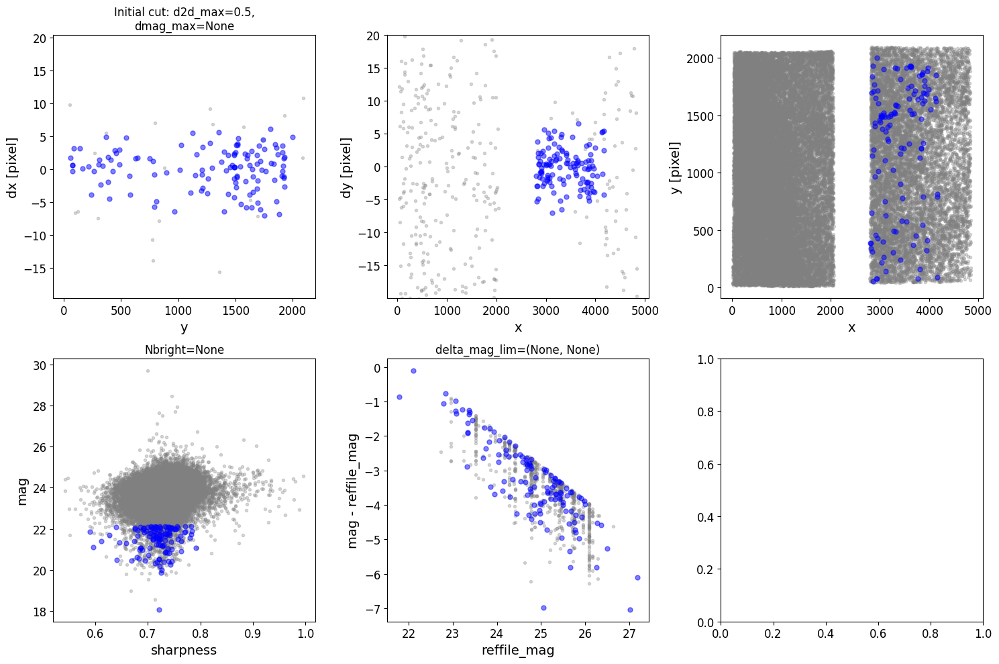

### Doing histogram cut for dx, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dx versus y
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
    slope  intercept  maxval  index  d_bestguess  fwhm  multimax
-0.000977    1.02832    22.0      8     0.910445   4.0     False
Setting rough_cut_px=10.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp 1.710445105964401

rough_cut_px=0.8 pixels removes 97 from 123 entries
Keeping 26 out of 26, skippin 0 because of null values in columns d_rot_tmp
median: 0.839033
75.000000 percentile cut: max residual for cut: 0.472244
__tmp_residuals 0.47224434566979506
median: 0.713928
i:00 mean:0.713928(0.071826) stdev:0.304730(0.049434) X2norm:0.97 Nchanged:0 Ngood:19 Nc

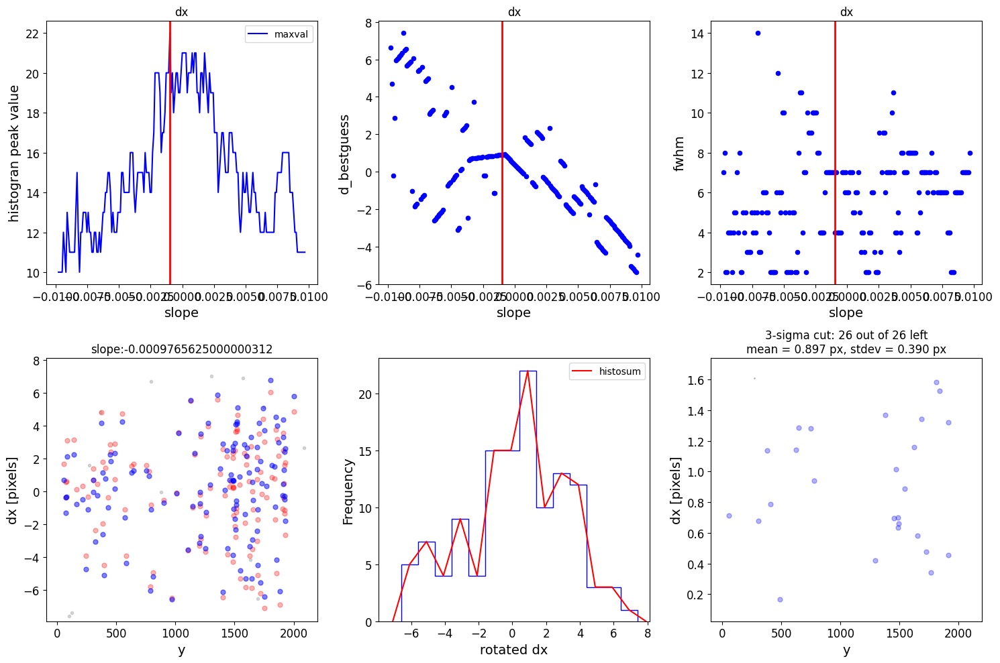

### Doing histogram cut for dy, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dy versus x
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
   slope  intercept  maxval  index  d_bestguess  fwhm  multimax
0.001855  -4.513428     8.0      7    -0.152453   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp 0.647547496695162

rough_cut_px=0.8 pixels removes 17 from 26 entries
Keeping 9 out of 9, skippin 0 because of null values in columns d_rot_tmp
median: -0.303642
75.000000 percentile cut: max residual for cut: 0.469927
__tmp_residuals 0.4699268473980309
median: -0.330233
i:00 mean:-0.330233(0.129433) stdev:0.289422(0.083549) X2norm:0.91 Nchanged:0 Ngood:6 Nclip:3

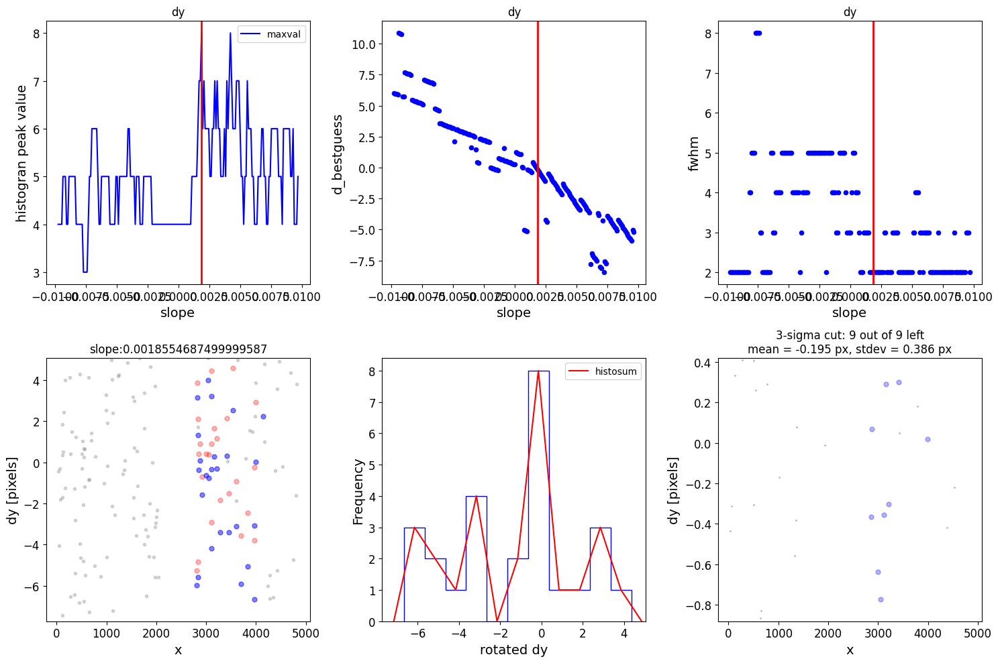

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

dx median of best matched objects of 1st iteration: 0.27553317211913964 dy median of best matched objects of 1st iteration: 0.9018966833272088
Matching reference catalog jwstred_temp_gaia/f300m_jhat_6_i2d.corr.phot.txt
Using 800 image objects that are in x_idl=[-62.15,246.71] and y_idl=[-64.51,72.50] range
x 4825
y 2066
Keeping 42913 out of 50969 catalog objects within x=40.0-4825 and y=40.0-2066
Keeping 42913  after removing NaNs from ra/dec
!! Matching 800 image objects to 42913 refcat objects!
########### !!!!!!!!!!  INITIAL CUT on matched cat: starting with 800 objects
d2d =0.5 CUT using reffile_d2d:
reffile_d2d 0.5
123 left
123 of image photometry objects pass initial cuts #1, 677 cut
### Doing histogram cut for dx, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dx versus y
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, win

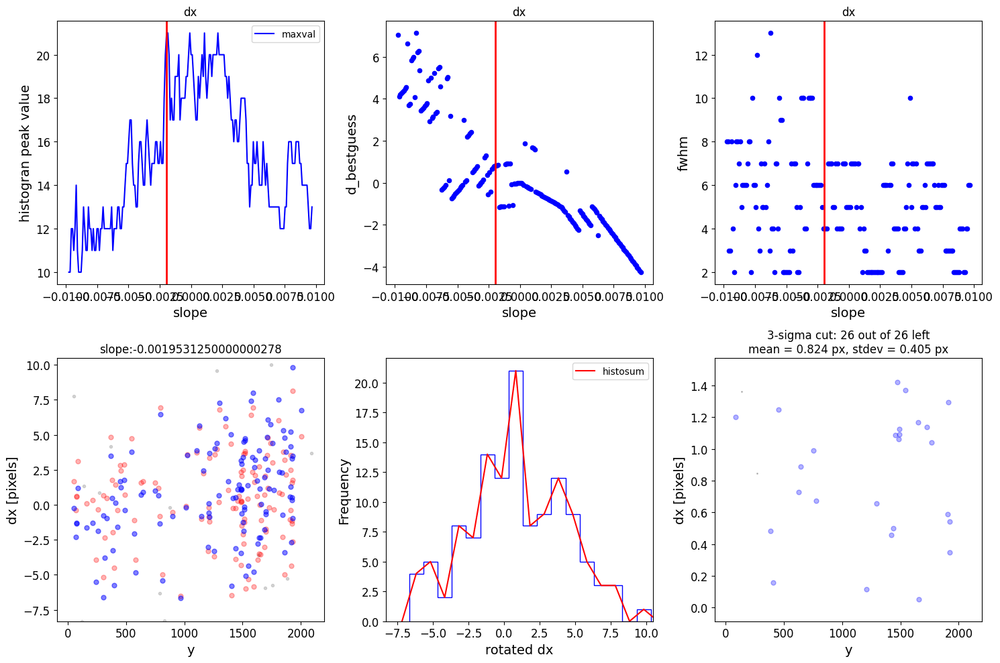

### Doing histogram cut for dy, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dy versus x
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
   slope  intercept  maxval  index  d_bestguess  fwhm  multimax
0.006348 -15.440674     9.0      9    -3.408414   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp -2.6084141898871254

rough_cut_px=0.8 pixels removes 17 from 26 entries
Keeping 9 out of 9, skippin 0 because of null values in columns d_rot_tmp
median: -3.529978
75.000000 percentile cut: max residual for cut: 0.322862
__tmp_residuals 0.3228617459001626
median: -3.702800
i:00 mean:-3.702800(0.082278) stdev:0.183978(0.053110) X2norm:0.91 Nchanged:0 Ngood:6 Nclip

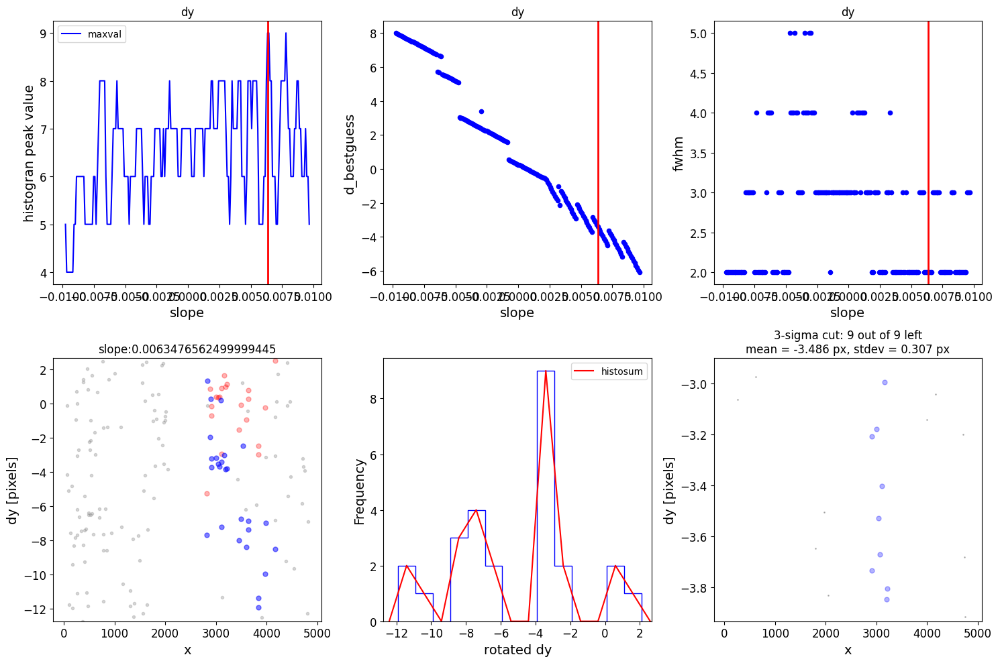

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

2025-07-25 10:05:43,938 - stpipe.TweakRegStep - INFO - TweakRegStep instance created.
2025-07-25 10:05:44,301 - stpipe.TweakRegStep - INFO - Step TweakRegStep running with args ([<ImageModel(2106, 4865) from f300m_15_i2d.fits>],).
2025-07-25 10:05:44,302 - stpipe.TweakRegStep - INFO - Step TweakRegStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: /Users/aswin/jwst123/jwstred_temp_gaia/f300m_15_jhat.fits
  output_dir: ./jwstred_temp_gaia
  output_ext: .fits
  output_use_model: True
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_catalogs: False
  catalog_format: ecsv
  kernel_fwhm: 2.5
  snr_threshold: 50
  brightest: 4000
  peakmax: None
  enforce_user_order: False
  expand_refcat: False
  minobj: 4
  searchrad: 0.5
  use2dhist: True
  separation: 9
  tolerance: 0.7
  xoffset: 0
  yoffset: 0
  fitgeometry: general
  nclip: 3
  sigma: 3.0
  align_to_gaia: False
  gaia_catalog: GAIADR2
  min_g

Setting output directory for f300m_15_jhat.fits file to ./jwstred_temp_gaia
9 matches are passed to tweakreg general fitting
Fitting tweakreg fitgeometry=general to xy=x,y to ra,dec=reffile_ra,reffile_dec
WCSAXES 2 2
CRPIX1 2428.8385914403552 2428.8385914404
CRPIX2 1051.070065295876 1051.0700652959
PC1_1 -0.2914514608122133 -0.29661129955609
PC1_2 -0.9565856187453514 -0.95571771405426
PC2_1 -0.9565856187453514 -0.95325475344177
PC2_2 0.2914514608122133 0.29328164593102
CDELT1 1.74746835331027e-05 1.7474683533103e-05
CDELT2 1.74746835331027e-05 1.7474683533103e-05
CUNIT1 deg deg
CUNIT2 deg deg
CRVAL1 210.76091447912987 210.76098736291
CRVAL2 54.29080285272499 54.290753297207
MJD-BEG 59961.559097592595 59961.559097593
MJD-AVG 59961.562080098374 59961.562080098
MJD-END 59961.56506260417 59961.565062604
XPOSURE 472.418 472.418
TELAPSE 472.418 472.418
OBSGEO-X -393184142.15387064 -393184142.15387
OBSGEO-Y 1620105236.4008162 1620105236.4008
OBSGEO-Z 238882324.86591524 238882324.86592
RADESYS

2025-07-25 10:05:44,505 - stpipe.TweakRegStep - INFO - Step TweakRegStep done


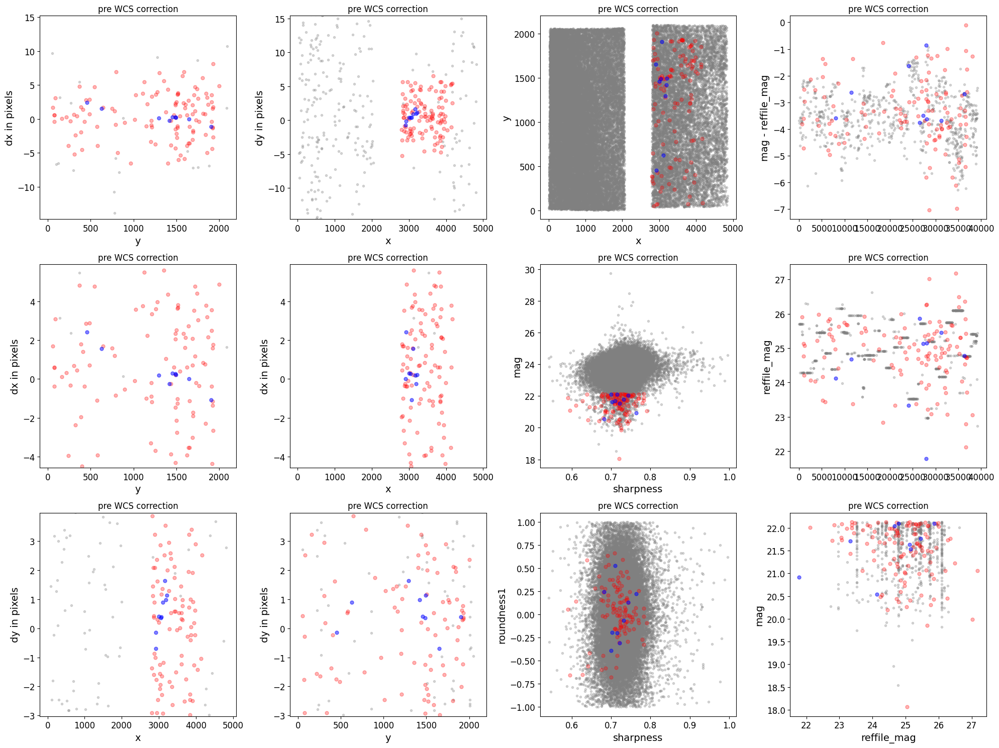

./jwstred_temp_gaia/f300m_15_jhat.fits


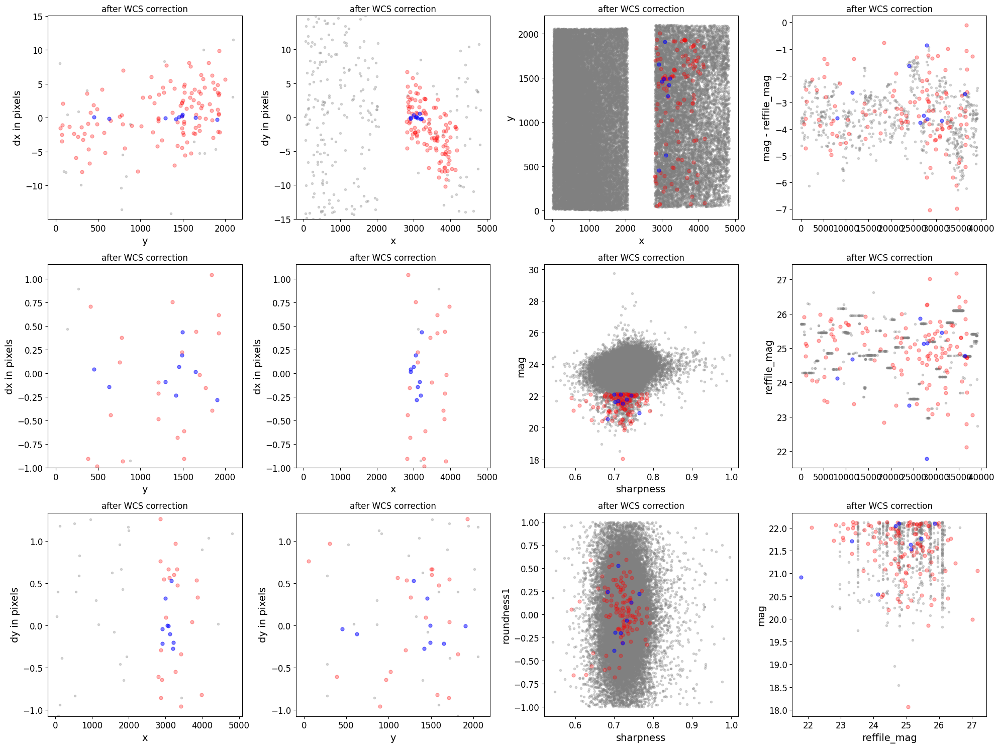

*** Note: close plots to continue!


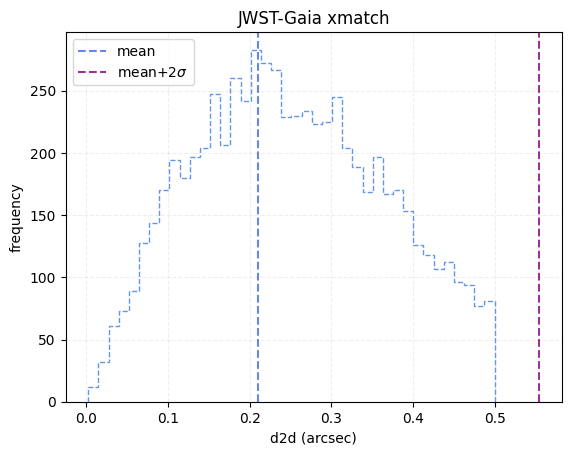

Initial dispersion: 209.9249122973283 mas
0 jwstred_temp_gaia/f300m_15_jhat_i2d.phot.txt


2025-07-25 10:05:50,490 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-07-25 10:05:50,810 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-07-25 10:05:50,815 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-07-25 10:05:50,815 - stpipe - INFO - Instrument: NIRCAM
2025-07-25 10:05:50,815 - stpipe - INFO - Detector: MULTIPLE
2025-07-25 10:05:50,815 - stpipe - INFO - Filter: F300M
2025-07-25 10:05:50,816 - stpipe - INFO - Pupil: CLEAR
2025-07-25 10:05:50,816 - stpipe - INFO - Subarray: FULL


dmag 0.36200000000000004


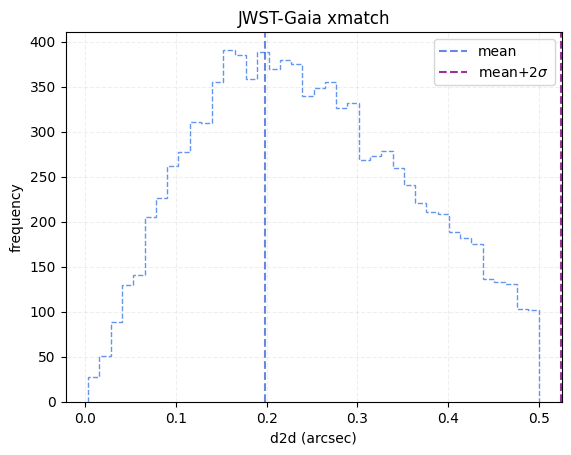

Final dispersion: 198.2903278567922 mas
telescope set to jwst

### Doing photometry on jwstred_temp_gaia/f300m_15_i2d.fits
True ./jwstred_temp_gaia/f300m_15.phot.txt
photometry catalog filename: ./jwstred_temp_gaia/f300m_15.phot.txt
photcat ./jwstred_temp_gaia/f300m_15.phot.txt already exists, but recreating it since overwrite=True
Instrument: NIRCAM, aperture:NRCA5_FULL
Finding stars --- Detector: MULTIPLE, Filter: F300M
FWHM for the filter F300M: 1.585 px
Background and rms using MMMBackground and MADStdBackgroundRMS: 0.1638125628232956 0.12225337016817571


2025-07-25 10:06:00,728 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-07-25 10:06:00,887 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-07-25 10:06:00,891 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-07-25 10:06:00,892 - stpipe - INFO - Instrument: NIRCAM
2025-07-25 10:06:00,892 - stpipe - INFO - Detector: MULTIPLE
2025-07-25 10:06:00,892 - stpipe - INFO - Filter: F300M
2025-07-25 10:06:00,892 - stpipe - INFO - Pupil: CLEAR
2025-07-25 10:06:00,893 - stpipe - INFO - Subarray: FULL



Number of sources found in the image: 62405
-------------------------------------

radii:[2.501]pixels radius_sky_in:3.255000114440918 radius_sky_out:5.666999816894531  radius_for_mag:[2.501]
Performing aperture photometry for radius r = 2.500999927520752 px
Time Elapsed: 3.0243600829853676
62276 objects left after removing entries with NaNs in mag or dmag column
dmag 0.36200000000000004
SNR_min cut: 62166 objects left after removing entries dmag>0.36200000000000004 (SNR<3)
62166 out of 62276 entries remain in photometry table
Saving ./jwstred_temp_gaia/f300m_15.phot.txt
########### !!!!!!!!!!  INITIAL CUT on image photometry cat: starting with 62276 objects
dmag_max =0.1 CUT:
dmag 0.1
60956 left
SHARPNESS =(0.3, 0.95) CUT:
sharpness 0.95
60935 left
roundness1=(-0.7, 0.7) CUT:
roundness1 0.7
55917 left
Nbright=800 CUT:
800 left
800 of image photometry objects pass initial cuts #1, 61476 cut
Getting jwstred_temp_gaia/f300m_jhat_6_i2d.corr.phot.txt and matching it: ra=210.7608272581262 

2025-07-25 10:06:09,768 - stpipe.TweakRegStep - INFO - TweakRegStep instance created.


####BEST:
   slope  intercept  maxval  index  d_bestguess  fwhm  multimax
0.001855  -4.513428     8.0      4    -3.152453   2.0      True
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp -2.3524525033048382

rough_cut_px=0.8 pixels removes 22 from 31 entries
Keeping 9 out of 9, skippin 0 because of null values in columns d_rot_tmp
median: -3.115466
75.000000 percentile cut: max residual for cut: 0.447145
__tmp_residuals 0.4471446373627881
median: -2.978743
i:00 mean:-2.978743(0.161064) stdev:0.360151(0.103967) X2norm:0.91 Nchanged:0 Ngood:6 Nclip:3

mean: -3.158650
i:01 mean:-3.158650(0.156416) stdev:0.442410(0.104277) X2norm:1.00 Nchanged:3 Ngood:9 Nclip:0

mean: -3.158650
i:02 mean:-3.158650(0.156416) stdev:0.442410(0.104277) X2norm:1.00 Nchanged:0 Ngood:9 Nclip:0


2025-07-25 10:06:10,136 - stpipe.TweakRegStep - INFO - Step TweakRegStep running with args ([<ImageModel(2106, 4865) from f300m_15_i2d.fits>],).
2025-07-25 10:06:10,137 - stpipe.TweakRegStep - INFO - Step TweakRegStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: /Users/aswin/jwst123/jwstred_temp_gaia/f300m_15_jhat.fits
  output_dir: ./jwstred_temp_gaia
  output_ext: .fits
  output_use_model: True
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_catalogs: False
  catalog_format: ecsv
  kernel_fwhm: 2.5
  snr_threshold: 50
  brightest: 4000
  peakmax: None
  enforce_user_order: False
  expand_refcat: False
  minobj: 4
  searchrad: 0.5
  use2dhist: True
  separation: 9
  tolerance: 0.7
  xoffset: 0
  yoffset: 0
  fitgeometry: general
  nclip: 3
  sigma: 3.0
  align_to_gaia: False
  gaia_catalog: GAIADR2
  min_gaia: 30
  save_gaia_catalog: False
  telescope: jwst
2025-07-25 10:06:10,142 - stpipe.

Setting output directory for f300m_15_jhat.fits file to ./jwstred_temp_gaia
9 matches are passed to tweakreg general fitting
Fitting tweakreg fitgeometry=general to xy=x,y to ra,dec=reffile_ra,reffile_dec
WCSAXES 2 2
CRPIX1 2428.8385914403552 2428.8385914404
CRPIX2 1051.070065295876 1051.0700652959
PC1_1 -0.2914514608122133 -0.2939374878501
PC1_2 -0.9565856187453514 -0.95629942945358
PC2_1 -0.9565856187453514 -0.95641723850787
PC2_2 0.2914514608122133 0.29146604742286
CDELT1 1.74746835331027e-05 1.7474683533103e-05
CDELT2 1.74746835331027e-05 1.7474683533103e-05
CUNIT1 deg deg
CUNIT2 deg deg
CRVAL1 210.76091447912987 210.76102355339
CRVAL2 54.29080285272499 54.290787321061
MJD-BEG 59961.559097592595 59961.559097593
MJD-AVG 59961.562080098374 59961.562080098
MJD-END 59961.56506260417 59961.565062604
XPOSURE 472.418 472.418
TELAPSE 472.418 472.418
OBSGEO-X -393184142.15387064 -393184142.15387
OBSGEO-Y 1620105236.4008162 1620105236.4008
OBSGEO-Z 238882324.86591524 238882324.86592
RADESYS 

2025-07-25 10:06:10,289 - stpipe.TweakRegStep - INFO - Step TweakRegStep done


./jwstred_temp_gaia/f300m_15_jhat.fits


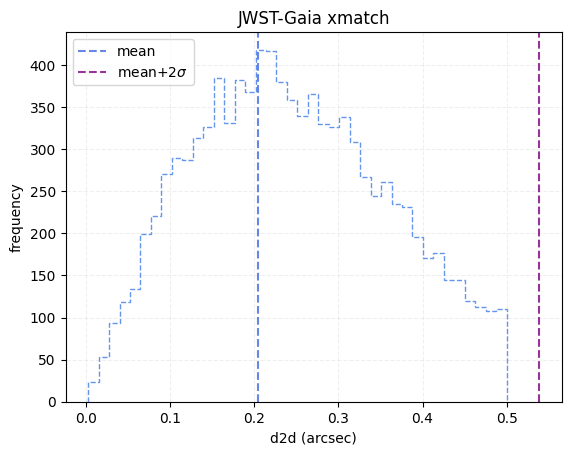

Initial dispersion: 203.70830232593124 mas
0 jwstred_temp_gaia/f300m_15_jhat_i2d.phot.txt


2025-07-25 10:06:15,924 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-07-25 10:06:16,132 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-07-25 10:06:16,137 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-07-25 10:06:16,137 - stpipe - INFO - Instrument: NIRCAM
2025-07-25 10:06:16,137 - stpipe - INFO - Detector: MULTIPLE
2025-07-25 10:06:16,137 - stpipe - INFO - Filter: F300M
2025-07-25 10:06:16,137 - stpipe - INFO - Pupil: CLEAR
2025-07-25 10:06:16,138 - stpipe - INFO - Subarray: FULL


dmag 0.36200000000000004


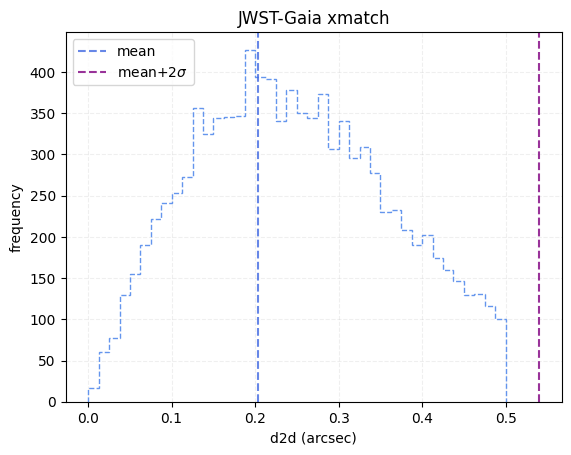

Final dispersion: 203.82097347549245 mas
0 jwstred_temp_gaia/f300m_15_i2d.phot.txt


2025-07-25 10:06:26,075 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-07-25 10:06:26,339 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-07-25 10:06:26,344 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-07-25 10:06:26,344 - stpipe - INFO - Instrument: NIRCAM
2025-07-25 10:06:26,344 - stpipe - INFO - Detector: MULTIPLE
2025-07-25 10:06:26,344 - stpipe - INFO - Filter: F300M
2025-07-25 10:06:26,345 - stpipe - INFO - Pupil: CLEAR
2025-07-25 10:06:26,345 - stpipe - INFO - Subarray: FULL


dmag 0.36200000000000004
Best guess for jwstred_temp_gaia/f300m_15_i2d.fits: (25, -15)
telescope set to jwst

### Doing photometry on jwstred_temp_gaia/f300m_15_i2d.fits
True ./jwstred_temp_gaia/f300m_15.phot.txt
photometry catalog filename: ./jwstred_temp_gaia/f300m_15.phot.txt
photcat ./jwstred_temp_gaia/f300m_15.phot.txt already exists, but recreating it since overwrite=True
Instrument: NIRCAM, aperture:NRCA5_FULL
Finding stars --- Detector: MULTIPLE, Filter: F300M
FWHM for the filter F300M: 1.585 px
Background and rms using MMMBackground and MADStdBackgroundRMS: 0.1638125628232956 0.12225337016817571


2025-07-25 10:07:42,906 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-07-25 10:07:43,070 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-07-25 10:07:43,074 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-07-25 10:07:43,075 - stpipe - INFO - Instrument: NIRCAM
2025-07-25 10:07:43,075 - stpipe - INFO - Detector: MULTIPLE
2025-07-25 10:07:43,075 - stpipe - INFO - Filter: F300M
2025-07-25 10:07:43,075 - stpipe - INFO - Pupil: CLEAR
2025-07-25 10:07:43,075 - stpipe - INFO - Subarray: FULL



Number of sources found in the image: 62405
-------------------------------------

radii:[2.501]pixels radius_sky_in:3.255000114440918 radius_sky_out:5.666999816894531  radius_for_mag:[2.501]
Performing aperture photometry for radius r = 2.500999927520752 px
Time Elapsed: 3.034784874995239
62276 objects left after removing entries with NaNs in mag or dmag column
dmag 0.36200000000000004
SNR_min cut: 62166 objects left after removing entries dmag>0.36200000000000004 (SNR<3)
62166 out of 62276 entries remain in photometry table
Saving ./jwstred_temp_gaia/f300m_15.phot.txt
########### !!!!!!!!!!  INITIAL CUT on image photometry cat: starting with 62276 objects
dmag_max =0.1 CUT:
dmag 0.1
60956 left
SHARPNESS =(0.3, 0.95) CUT:
sharpness 0.95
60935 left
roundness1=(-0.7, 0.7) CUT:
roundness1 0.7
55917 left
Nbright=800 CUT:
800 left
800 of image photometry objects pass initial cuts #1, 61476 cut
Getting jwstred_temp_gaia/f300m_jhat_6_i2d.corr.phot.txt and matching it: ra=210.7608272581262 d

2025-07-25 10:07:51,883 - stpipe.TweakRegStep - INFO - TweakRegStep instance created.


####BEST:
    slope  intercept  maxval  index  d_bestguess  fwhm  multimax
-0.000293   0.712646   124.0     12   -14.650828   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp -13.850828425248082

rough_cut_px=0.8 pixels removes 2 from 126 entries
Keeping 124 out of 124, skippin 0 because of null values in columns d_rot_tmp
median: -14.736708
75.000000 percentile cut: max residual for cut: 0.177098
__tmp_residuals 0.17709833152250587
median: -14.724030
i:00 mean:-14.724030(0.010839) stdev:0.103961(0.007623) X2norm:0.99 Nchanged:0 Ngood:93 Nclip:31

mean: -14.741432
i:01 mean:-14.741432(0.013078) stdev:0.140250(0.009208) X2norm:1.00 Nchanged:23 Ngood:116 Nclip:8

mean: -14.746497
i:02 mean:-14.746497(0.014900) stdev:0.165250(0.010493) X2norm:1.00 Nchanged:8 Ngood:124 Nclip:0

mean: -14.746497
i:03 mean:-14.746497(0.014900) stdev:0.165250(0.010493) X2norm:1.00 Nchanged

2025-07-25 10:07:52,234 - stpipe.TweakRegStep - INFO - Step TweakRegStep running with args ([<ImageModel(2106, 4865) from f300m_15_i2d.fits>],).
2025-07-25 10:07:52,235 - stpipe.TweakRegStep - INFO - Step TweakRegStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: /Users/aswin/jwst123/jwstred_temp_gaia/f300m_15_jhat.fits
  output_dir: ./jwstred_temp_gaia
  output_ext: .fits
  output_use_model: True
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_catalogs: False
  catalog_format: ecsv
  kernel_fwhm: 2.5
  snr_threshold: 50
  brightest: 4000
  peakmax: None
  enforce_user_order: False
  expand_refcat: False
  minobj: 4
  searchrad: 0.5
  use2dhist: True
  separation: 9
  tolerance: 0.7
  xoffset: 0
  yoffset: 0
  fitgeometry: general
  nclip: 3
  sigma: 3.0
  align_to_gaia: False
  gaia_catalog: GAIADR2
  min_gaia: 30
  save_gaia_catalog: False
  telescope: jwst
2025-07-25 10:07:52,241 - stpipe.

Setting output directory for f300m_15_jhat.fits file to ./jwstred_temp_gaia
124 matches are passed to tweakreg general fitting
Fitting tweakreg fitgeometry=general to xy=x,y to ra,dec=reffile_ra,reffile_dec
WCSAXES 2 2
CRPIX1 2428.8385914403552 2428.8385914404
CRPIX2 1051.070065295876 1051.0700652959
PC1_1 -0.2914514608122133 -0.29149848354164
PC1_2 -0.9565856187453514 -0.95652269955916
PC2_1 -0.9565856187453514 -0.95666845786598
PC2_2 0.2914514608122133 0.29156150039612
CDELT1 1.74746835331027e-05 1.7474683533103e-05
CDELT2 1.74746835331027e-05 1.7474683533103e-05
CUNIT1 deg deg
CUNIT2 deg deg
CRVAL1 210.76091447912987 210.76112047488
CRVAL2 54.29080285272499 54.290295919823
MJD-BEG 59961.559097592595 59961.559097593
MJD-AVG 59961.562080098374 59961.562080098
MJD-END 59961.56506260417 59961.565062604
XPOSURE 472.418 472.418
TELAPSE 472.418 472.418
OBSGEO-X -393184142.15387064 -393184142.15387
OBSGEO-Y 1620105236.4008162 1620105236.4008
OBSGEO-Z 238882324.86591524 238882324.86592
RADES

2025-07-25 10:07:52,449 - stpipe.TweakRegStep - INFO - Step TweakRegStep done


./jwstred_temp_gaia/f300m_15_jhat.fits


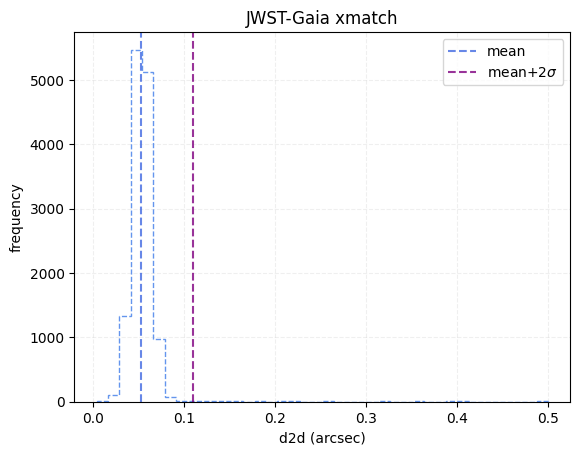

Initial dispersion: 52.661260831491276 mas
0 jwstred_temp_gaia/f300m_15_jhat_i2d.phot.txt


2025-07-25 10:07:57,879 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-07-25 10:07:58,084 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-07-25 10:07:58,088 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-07-25 10:07:58,089 - stpipe - INFO - Instrument: NIRCAM
2025-07-25 10:07:58,089 - stpipe - INFO - Detector: MULTIPLE
2025-07-25 10:07:58,089 - stpipe - INFO - Filter: F300M
2025-07-25 10:07:58,089 - stpipe - INFO - Pupil: CLEAR
2025-07-25 10:07:58,089 - stpipe - INFO - Subarray: FULL


dmag 0.36200000000000004


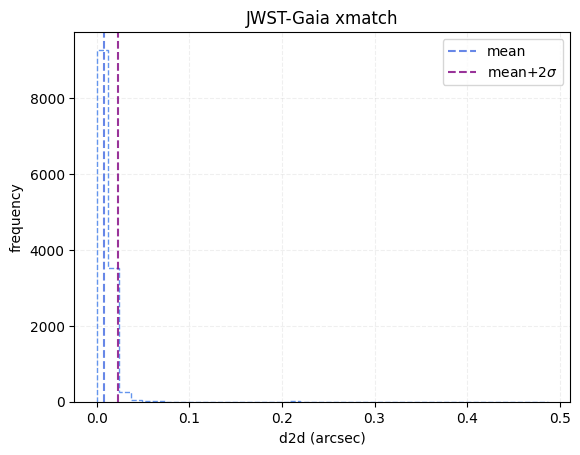

Final dispersion: 8.120020499120203 mas
Final JWST dispersion for jwstred_temp_gaia/f300m_15_i2d.fits: 8.120020499120203 mas


In [11]:
jwst123.align_jwst_image(align_image=align_image, outdir=outdir, gaia=False, 
                         plot=True, verbose=True, photfilename=photfilename, Nbright = 800)